# Spatio-Temporal NSMPP + Spatio-Temporal Hawkes Baseline
This notebook combines:
- Training the Neural Stationary Marked Point Process (NSMPP) for spatio-temporal data (t, x, y)
- Spatio-Temporal Hawkes Baseline (without magnitude)
- Comparison of log-likelihoods per event.

In [7]:
# NOTE: Comment below if you only run the unit tests
from google.colab import drive
drive.mount("/content/gdrive", force_remount=True)

# root path for the project
rootpath = "gdrive/MyDrive/PP-Fourier-Kernel"

# key Python dependencies
import torch
import torch.nn as nn
import arrow
import itertools
import numpy as np
import torch.optim as optim
from abc import ABC, abstractmethod
from matplotlib import pyplot as plt
from torch.utils.data import TensorDataset, DataLoader
import os

os.makedirs(f"{rootpath}/saved_models", exist_ok=True)


Mounted at /content/gdrive


# 1. NSMPP Environment & Model Definition
This section contains all the classes needed from the original NSMPP code.

## Kernels

In [13]:
class ExponentialDecayingKernel(nn.Module):
    def __init__(self, beta):
        super(ExponentialDecayingKernel, self).__init__()

        # trained beta
        self._beta = nn.Parameter(torch.tensor(beta, dtype=torch.float32))

    def forward(self, x, y):
        diff = x - y
        diff = torch.clamp(diff, min=0.0)
        return torch.exp(-self._beta * diff)



#class ExponentialDecayingKernel(torch.nn.Module):
#    """
#    Exponential Decaying Kernel
#    """
#    def __init__(self, beta):
#        """
#        Arg:
#        - beta: decaying rate
#        """
#        super(ExponentialDecayingKernel, self).__init__()
#        self._beta = beta # torch.nn.Parameter(torch.rand([1]), requires_grad=True)
#        # self._beta = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
#
#    def forward(self, x, y):
#        """
#        customized forward function returning kernel evaluation at x and y with
#        size [ batch_size, batch_size ], where
#        - x: the first input with size  [ batch_size, data_dim ]
#        - y: the second input with size [ batch_size, data_dim ]
#        """
#        # return torch.nn.functional.softplus(self._beta * torch.exp(- self._beta * (x - y)))
#        return self._beta * torch.exp(- self._beta * torch.abs(x - y))



class DeepNetworkBasis(torch.nn.Module):
    """
    Deep Neural Network Basis Kernel

    This class directly models the kernel-induced feature mapping by a deep
    neural network.
    """
    def __init__(self, data_dim, basis_dim,
                 init_gain=5e-1, init_bias=1e-3, nn_width=5):
        """
        Args:
        - data_dim:  dimension of input data point
        - basis_dim: dimension of basis function
        - nn_width:  the width of each layer in NN
        """
        super(DeepNetworkBasis, self).__init__()
        # configurations
        self.data_dim  = data_dim
        self.basis_dim = basis_dim
        # init parameters for net
        self.init_gain   = init_gain
        self.init_bias   = init_bias
        # network for basis function
        self.net = torch.nn.Sequential(
            torch.nn.Linear(data_dim, nn_width),  # [ data_dim, n_hidden_nodes ]
            torch.nn.Softplus(),
            torch.nn.Linear(nn_width, nn_width),  # [ n_hidden_nodes, n_hidden_nodes ]
            torch.nn.Softplus(),
            torch.nn.Linear(nn_width, nn_width),  # [ n_hidden_nodes, n_hidden_nodes ]
            torch.nn.Softplus(),
            torch.nn.Linear(nn_width, basis_dim), # [ n_hidden_nodes, basis_dim ]
            torch.nn.Sigmoid())
        self.net.apply(self.init_weights)

    def init_weights(self, m):
        """
        initialize weight matrices in network
        """
        if type(m) == torch.nn.Linear:
            torch.nn.init.xavier_uniform_(m.weight, gain=self.init_gain)
            m.bias.data.fill_(self.init_bias)

    def forward(self, x):
        """
        customized forward function returning basis function evaluated at x
        with size [ batch_size, data_dim ]
        """
        return self.net(x) * 2 - 1         # [ batch_size, basis_dim ]



class DeepBasisKernel(torch.nn.Module):
    """
    Deep Basis Kernel
    """
    def __init__(self,
                 n_basis, data_dim, basis_dim,
                 init_gain=5e-1, init_bias=1e-3, init_std=1.,
                 nn_width=5):
        """
        Arg:
        - n_basis:   number of basis functions
        - data_dim:  dimension of input data point
        - basis_dim: dimension of basis function
        - nn_width:  the width of each layer in basis NN
        """
        super(DeepBasisKernel, self).__init__()
        # configurations
        self.n_basis   = n_basis
        self.data_dim  = data_dim
        self.basis_dim = basis_dim
        # set of basis functions and corresponding weights
        self.xbasiss   = torch.nn.ModuleList([])
        self.ybasiss   = torch.nn.ModuleList([])
        self.weights   = torch.nn.ParameterList([])
        for i in range(n_basis):
            self.xbasiss.append(DeepNetworkBasis(data_dim, basis_dim,
                                                 init_gain=init_gain, init_bias=init_bias,
                                                 nn_width=nn_width))
            self.ybasiss.append(DeepNetworkBasis(data_dim, basis_dim,
                                                 init_gain=init_gain, init_bias=init_bias,
                                                 nn_width=nn_width))
            self.weights.append(torch.nn.Parameter(torch.empty(1).normal_(mean=0,std=init_std), requires_grad=True))

    def forward(self, x, y):
        """
        customized forward function returning kernel evaluation at x and y with
        size [ batch_size, batch_size ], where
        - x: the first input with size  [ batch_size, data_dim ]
        - y: the second input with size [ batch_size, data_dim ]
        """
        K = []
        for weight, xbasis, ybasis in zip(self.weights, self.xbasiss, self.ybasiss):
            xbasis_func = xbasis(x)                                   # [ batch_size, basis_dim ]
            ybasis_func = ybasis(y)                                   # [ batch_size, basis_dim ]
            weight      = torch.nn.functional.softplus(weight)        # scalar
            ki          = (weight * xbasis_func * ybasis_func).sum(1) # [ batch_size ]
            K.append(ki)
        K = torch.stack(K, 1).sum(1)
        return K



class SpatioTemporalDeepBasisKernel(torch.nn.Module):
    """
    Spatio-temporal Deep Basis Kernel
    """
    def __init__(self,
                 n_basis, data_dim, basis_dim,
                 init_gain=5e-1, init_bias=1e-3, init_std=1.,
                 nn_width=5, beta=1):
        """
        Arg:
        - n_basis:   number of basis functions
        - data_dim:  dimension of input data point
        - basis_dim: dimension of basis function
        - nn_width:  the width of each layer in basis NN
        """
        super(SpatioTemporalDeepBasisKernel, self).__init__()
        # decoupled kernels
        self.spatialkernel  = DeepBasisKernel(n_basis, data_dim-1, basis_dim,
                                              init_gain=init_gain, init_bias=init_bias, init_std=init_std,
                                              nn_width=nn_width)
        # self.temporalkernel = ExponentialDecayingKernel(beta)
        self.beta = torch.nn.Parameter(torch.rand([1]), requires_grad=True)

    def temporalkernel(self, x, y):
        return self.beta * torch.exp(- self.beta * (x - y))

    def forward(self, x, y):
        """
        customized forward function returning kernel evaluation at x and y with
        size [ batch_size, batch_size ], where
        - x: the first input with size  [ batch_size, data_dim ]
        - y: the second input with size [ batch_size, data_dim ]
        """
        xt, yt = x[:, 0].clone(), y[:, 0].clone()   # [ batch_size ]
        xs, ys = x[:, 1:].clone(), y[:, 1:].clone() # [ batch_size, data_dim - 1 ]
        tval   = self.temporalkernel(xt, yt)        # [ batch_size ]
        sval   = self.spatialkernel(xs, ys)         # [ batch_size ]
        return tval * sval                          # [ batch_size ]


class DeepJointFourierSpectrum(torch.nn.Module):
    """
    Deep Joint Fourier Spectrum

    This class models the joint Fourier spectrum p(w, u), which is approximated
    by sampling a number of fourier features from a deep neural network.
    """
    def __init__(self, noise_dim, fourier_dim,
                 noise_mean=0, noise_std=1e+1,
                 init_gain=1e-1, init_bias=1e-3):
        """
        Args:
        - noise_dim:   dimension of input noise
        - fourier_dim: dimension of two output fourier features
        """
        super(DeepJointFourierSpectrum, self).__init__()
        # configurations
        self.noise_dim   = noise_dim
        self.fourier_dim = fourier_dim
        # noise parameters
        self.noise_mean  = noise_mean
        self.noise_std   = noise_std
        # init parameters for net
        self.init_gain   = init_gain
        self.init_bias   = init_bias
        self.net         = torch.nn.Sequential(
            torch.nn.Linear(noise_dim, 100),       # [ n_sampled_fouriers, n_hidden_nodes ]
            torch.nn.Softplus(),
            torch.nn.Linear(100, 100),             # [ n_hidden_nodes, n_hidden_nodes ]
            torch.nn.Softplus(),
            torch.nn.Linear(100, 100),             # [ n_hidden_nodes, n_hidden_nodes ]
            torch.nn.Softplus(),
            torch.nn.Linear(100, fourier_dim * 2), # [ n_hidden_nodes, 2 * fourier_dim ]
            torch.nn.Sigmoid())
        self.net.apply(self.init_weights)

    def init_weights(self, m):
        """
        initialize weight matrices in network
        """
        if type(m) == torch.nn.Linear:
            torch.nn.init.xavier_uniform_(m.weight, gain=self.init_gain)
            m.bias.data.fill_(self.init_bias)

    def forward(self, n_sampled_fouriers):
        """
        customized forward function returning `n_sampled_fouriers` fourier
        features w and u.
        """
        noise    = torch.FloatTensor(n_sampled_fouriers, self.noise_dim).normal_(mean=self.noise_mean,std=self.noise_std)
        fouriers = self.net(noise) * 2 - 1                # rescale output to (-1, 1)
        ws       = fouriers[:, :self.fourier_dim].clone() # [ n_sampled_fouriers, fourier_dim ]
        us       = fouriers[:, self.fourier_dim:].clone() # [ n_sampled_fouriers, fourier_dim ]
        return ws, us



class DeepFourierKernel(torch.nn.Module):
    """
    Deep Non-Stationary Fourier Kernel k(x, y)
    """
    def __init__(self, noise_dim, data_dim):
        """
        Args:
        - noise_dim:          dimension of noise prior
        - data_dim:           dimension of input data
        """
        super(DeepFourierKernel, self).__init__()
        # configuration
        self.noise_dim   = noise_dim          # dimension of noise prior
        self.data_dim    = data_dim           # dimension of input data
        self.precomputed = False
        # fourier specturm specified by a deep neural network
        self.p  = DeepJointFourierSpectrum(self.noise_dim, self.data_dim)
        self.q  = DeepJointFourierSpectrum(self.noise_dim, self.data_dim)
        # scalar parameters
        # Note: set constant to make kernel simpler.
        self.c1 = 1e-4 # torch.nn.Parameter(torch.randn((1), requires_grad=True))
        self.c2 = 1e-4 # torch.nn.Parameter(torch.randn((1), requires_grad=True))

    def precompute_fourier_features(self, n_sampled_fouriers):
        """
        Precompute fourier features
        """
        # sampled fourier features
        self.pre_ws_p, self.pre_us_p = self.p(n_sampled_fouriers)  # 2 * [ n_sampled_fouriers, fourier_dim ]
        self.pre_ws_q, self.pre_us_q = self.q(n_sampled_fouriers)  # 2 * [ n_sampled_fouriers, fourier_dim ]
        self.precomputed = True

    def forward(self, x, y, n_sampled_fouriers=None):
        """
        return kernel evaluation at x and y with size [ batch_size, batch_size ],
        where
        - x: the first input with size  [ batch_size, data_dim ]
        - y: the second input with size [ batch_size, data_dim ]
        - n_sampled_fouriers: number of sampled fourier features (if None, then
                              use precomputed fourier features)
        """
        # sampled fourier features
        if n_sampled_fouriers is not None:
            ws_p, us_p = self.p(n_sampled_fouriers)   # 2 * [ n_sampled_fouriers, fourier_dim ]
            ws_q, us_q = self.q(n_sampled_fouriers)   # 2 * [ n_sampled_fouriers, fourier_dim ]
        # use precomputed fourier features
        elif n_sampled_fouriers is None and self.precomputed is True:
            ws_p, us_p = self.pre_ws_p, self.pre_us_p # 2 * [ n_sampled_fouriers, fourier_dim ]
            ws_q, us_q = self.pre_ws_q, self.pre_us_q # 2 * [ n_sampled_fouriers, fourier_dim ]
        else:
            raise Exception("No available Fourier features.")
        # transpose
        ws_p, us_p = torch.transpose(ws_p, 0, 1), torch.transpose(us_p, 0, 1)
        ws_q, us_q = torch.transpose(ws_q, 0, 1), torch.transpose(us_q, 0, 1)
        # cosine and sine
        cos_wx_uy_p = torch.cos(torch.matmul(x, ws_p) - torch.matmul(y, us_p)) # [ batch_size, n_sampled_fouriers ]
        sin_wx_uy_q = torch.sin(torch.matmul(x, ws_q) - torch.matmul(y, us_q)) # [ batch_size, n_sampled_fouriers ]
        # integral
        eval = self.c1 * cos_wx_uy_p.mean(1) - \
               self.c2 * sin_wx_uy_q.mean(1) - \
               4 ** self.data_dim * \
               torch.prod(torch.pow(torch.sinc(x), self.data_dim)) * \
               torch.prod(torch.pow(torch.sinc(y), self.data_dim))          # [ batch_size ]

        # NOTE: currently apply softplus to prohibit negative values
        # NOTE: -0.5 to make the value smaller
        # return (torch.nn.functional.softplus(eval) - 0.5)/10 # [ batch_size ]
        return eval + 5e-5 # [ batch_size ]

# UNIT TEST
if __name__ == "__main__":
    batch_size = 16
    data_dim   = 3

    # kernel = DeepFourierKernel(noise_dim=5, data_dim=data_dim)
    # kernel.precompute_fourier_features(n_sampled_fouriers=100)
    kernel = DeepBasisKernel(n_basis=5, data_dim=data_dim, basis_dim=7)
    x      = torch.randn((batch_size, data_dim))
    y      = torch.randn((batch_size, data_dim))

    print("[%s] Unit test" % arrow.now())
    # print("[%s] input x:\n" % arrow.now(), x)
    # print("[%s] input y:\n" % arrow.now(), y)
    print("[%s] kernel(x, y):\n" % arrow.now(), kernel(x, y))

[2026-06-06T04:55:43.015194+00:00] Unit test
[2026-06-06T04:55:43.015352+00:00] kernel(x, y):
 tensor([0.2177, 0.2199, 0.2192, 0.2221, 0.2176, 0.2201, 0.2217, 0.2280, 0.2184,
        0.2216, 0.2186, 0.2186, 0.2190, 0.2194, 0.2208, 0.2170],
       grad_fn=<SumBackward1>)


##Point processes

In [14]:
class BasePointProcess(torch.nn.Module):
    """
    Point Process Base Class
    """
    @abstractmethod
    def __init__(self, T, S, data_dim, numerical_int=True, int_res=100):
        """
        Args:
        - T:             time horizon. e.g. (0, 1)
        - S:             bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        - data_dim:      dimension of input data
        - numerical_int: numerical integral flag
        - int_res:       numerical integral resolution
        """
        super(BasePointProcess, self).__init__()
        # configuration
        self.data_dim      = data_dim
        self.T             = T # time horizon. e.g. (0, 1)
        self.S             = S # bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        self.numerical_int = numerical_int
        assert len(S) + 1 == self.data_dim, "Invalid space dimension"

        # numerical likelihood integral preparation
        if int_res is not None:
            self.int_res  = int_res
            self.tt       = torch.FloatTensor(np.linspace(self.T[0], self.T[1], int_res))  # [ in_res ]
            self.ss       = [ np.linspace(S_k[0], S_k[1], int_res) for S_k in self.S ]     # [ data_dim - 1, in_res ]
            # spatio-temporal coordinates that need to be evaluated
            self.t_coords = torch.ones((int_res ** (data_dim - 1), 1))                     # [ int_res^(data_dim - 1), 1 ]
            self.s_coords = torch.FloatTensor(np.array(list(itertools.product(*self.ss)))) # [ int_res^(data_dim - 1), data_dim - 1 ]
            # unit volumn
            self.unit_vol = np.prod([ S_k[1] - S_k[0] for S_k in self.S ] + [ self.T[1] - self.T[0] ]) / (self.int_res) ** self.data_dim

    def numerical_integral(self, X):
        """
        return conditional intensity evaluation at grid points, the numerical
        integral can be further calculated by summing up these evaluations and
        scaling by the unit volumn.
        """
        batch_size, seq_len, _ = X.shape
        integral = []
        for t in self.tt:
            # all possible points at time t (x_t)
            t_coord = self.t_coords * t
            xt      = torch.cat([t_coord, self.s_coords], 1) # [ int_res^(data_dim - 1), data_dim ]
            xt      = xt\
                .unsqueeze_(0)\
                .repeat(batch_size, 1, 1)\
                .reshape(-1, self.data_dim)                  # [ batch_size * int_res^(data_dim - 1), data_dim ]
            # history points before time t (H_t)
            mask = ((X[:, :, 0].clone() <= t) * (X[:, :, 0].clone() > 0))\
                .unsqueeze_(-1)\
                .repeat(1, 1, self.data_dim)                 # [ batch_size, seq_len, data_dim ]
            ht   = X * mask                                  # [ batch_size, seq_len, data_dim ]
            ht   = ht\
                .unsqueeze_(1)\
                .repeat(1, self.int_res ** (self.data_dim - 1), 1, 1)\
                .reshape(-1, seq_len, self.data_dim)         # [ batch_size * int_res^(data_dim - 1), seq_len, data_dim ]
            # lambda and integral
            lams = torch.nn.functional.softplus(self.cond_lambda(xt, ht))\
                .reshape(batch_size, -1)                     # [ batch_size, int_res^(data_dim - 1) ]
            integral.append(lams)
        # NOTE: second dimension is time, third dimension is mark space
        integral = torch.stack(integral, 1)                  # [ batch_size, int_res, int_res^(data_dim - 1) ]
        return integral

    def cond_lambda(self, xi, hti):
        """
        return conditional intensity given x
        Args:
        - xi:   current i-th point       [ batch_size, data_dim ]
        - hti:  history points before ti [ batch_size, seq_len, data_dim ]
        Return:
        - lami: i-th lambda              [ batch_size ]
        """
        # if length of the history is zero
        if hti.size()[0] == 0:
            return self.mu()
        # otherwise treat zero in the time (the first) dimension as invalid points
        batch_size, seq_len, _ = hti.shape
        mask = hti[:, :, 0].clone() > 0                                          # [ batch_size, seq_len ]
        xi   = xi.unsqueeze_(1).repeat(1, seq_len, 1).reshape(-1, self.data_dim) # [ batch_size * seq_len, data_dim ]
        hti  = hti.reshape(-1, self.data_dim)                                    # [ batch_size * seq_len, data_dim ]
        K    = self.kernel(xi, hti).reshape(batch_size, seq_len)                 # [ batch_size, seq_len ]
        K    = K * mask                                                          # [ batch_size, seq_len ]
        lami = K.sum(1) + self.mu()                                              # [ batch_size ]
        return lami

    def log_likelihood(self, X, n_sampled_fouriers=200):
        """
        return log-likelihood given sequence X
        Args:
        - X:      input points sequence [ batch_size, seq_len, data_dim ]
        Return:
        - lams:   sequence of lambda    [ batch_size, seq_len ]
        - loglik: log-likelihood        [ batch_size ]
        """
        batch_size, seq_len, _ = X.shape
        lams     = [
            torch.nn.functional.softplus(self.cond_lambda(
                X[:, i, :].clone(),
                X[:, :i, :].clone())) + 1e-5
            for i in range(seq_len) ]
        lams     = torch.stack(lams, dim=1)                                   # [ batch_size, seq_len ]
        # log-likelihood
        mask     = X[:, :, 0] > 0                                             # [ batch_size, seq_len ]
        sumlog   = torch.log(lams) * mask                                     # [ batch_size, seq_len ]
        integral = self.numerical_integral(X)                                 # [ batch_size, int_res, int_res^(data_dim - 1) ]
        if self.numerical_int:
            loglik = sumlog.sum(1) - integral.sum(-1).sum(-1) * self.unit_vol # [ batch_size ]
        else:
            # TODO: integral in analytical form
            pass
        return lams, loglik

    @abstractmethod
    def mu(self):
        """
        return base intensity
        """
        raise NotImplementedError()

    @abstractmethod
    def forward(self, X):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)


class ExpDecayingHawkes(BasePointProcess):
    """
    Hawkes process with exponentially decaying kernel
    """
    def __init__(self, T, S, beta, mu, data_dim, numerical_int=True, int_res=100):
        super(ExpDecayingHawkes, self).__init__(T, S, data_dim, numerical_int, int_res)

        # kernel sebagai submodule
        self.kernel = ExponentialDecayingKernel(beta)

        # jadikan mu parameter trainable (kalau mau di-train)
        self._mu = nn.Parameter(torch.tensor(mu, dtype=torch.float32))

    def mu(self):
        """
        return base intensity (bisa pakai softplus kalau mau dipaksa positif)
        """
        return torch.nn.functional.softplus(self._mu)
        # atau kalau mau apa adanya:
        # return self._mu



class DeepFourierPointProcess(BasePointProcess):
    """
    Point Process with Deep Fourier Kernel
    """
    def __init__(self, T, S, noise_dim, data_dim, numerical_int=True, int_res=100):
        """
        Args:
        - T:             time horizon. e.g. (0, 1)
        - S:             bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        - noise_dim:     dimension of noise prior
        - data_dim:      dimension of input data
        - numerical_int: numerical integral flag
        - int_res:       numerical integral resolution
        """
        super(DeepFourierPointProcess, self).__init__(T, S, data_dim, numerical_int, int_res)
        # configuration
        self.noise_dim = noise_dim
        # deep fourier kernel
        self.kernel    = DeepFourierKernel(self.noise_dim, self.data_dim)

    def mu(self):
        """
        return base intensity
        """
        return 1.

    def forward(self, X, n_sampled_fouriers=200):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # precompute fourier features
        self.kernel.precompute_fourier_features(n_sampled_fouriers=n_sampled_fouriers)
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)



class DeepBasisPointProcess(BasePointProcess):
    """
    Point Process with Deep NN basis
    """
    def __init__(self,
                 T, S, mu,
                 n_basis, basis_dim, data_dim,
                 numerical_int=True, int_res=100,
                 init_gain=5e-1, init_bias=1e-3, init_std=1.,
                 nn_width=5):
        """
        Args:
        - T:             time horizon. e.g. (0, 1)
        - S:             bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        - n_basis:       number of basis functions
        - basis_dim:     dimension of basis function
        - data_dim:      dimension of input data
        - numerical_int: numerical integral flag
        - int_res:       numerical integral resolution
        - nn_width:      the width of each layer in kernel basis NN
        """
        super(DeepBasisPointProcess, self).__init__(T, S, data_dim, numerical_int, int_res)
        # configuration
        self.n_basis   = n_basis
        self.basis_dim = basis_dim
        self._mu       = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
        # deep nn basis kernel
        self.kernel    = DeepBasisKernel(n_basis, data_dim, basis_dim,
                                         init_gain=init_gain, init_bias=init_bias, init_std=init_std,
                                         nn_width=nn_width)

    def mu(self):
        """
        return base intensity
        """
        return torch.nn.functional.softplus(self._mu)

    def forward(self, X, n_sampled_fouriers=200):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)



class SpatioTemporalDeepBasisPointProcess(BasePointProcess):
    """
    Spatio-temporal Point Process with Deep NN basis
    """
    def __init__(self,
                 T, S,
                 n_basis, basis_dim, data_dim,
                 init_gain=5e-1, init_bias=1e-3, init_std=1.,
                 numerical_int=True, int_res=100, nn_width=5, beta=1):
        """
        See `DeepBasisPointProcess` for more details
        """
        super(SpatioTemporalDeepBasisPointProcess, self).__init__(T, S, data_dim, numerical_int, int_res)
        # configuration
        self.n_basis   = n_basis
        self.basis_dim = basis_dim
        self._mu    = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
        # spatio-temporal deep nn basis kernel
        self.kernel    = SpatioTemporalDeepBasisKernel(n_basis, data_dim, basis_dim,
                                                       init_gain=init_gain, init_bias=init_bias, init_std=init_std,
                                                       nn_width=nn_width, beta=beta)

    def mu(self):
        """
        return base intensity
        """
        return torch.nn.functional.softplus(self._mu)

    def forward(self, X, n_sampled_fouriers=200):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)



# UNIT TEST
if __name__ == "__main__":
    T          = (0., 1.)
    S          = ((0., 1.), (0., 1.))
    batch_size = 2
    data_dim   = 3
    seq_len    = 10
    int_res    = 20

    print("[%s] Unit test" % arrow.now())

    torch.random.manual_seed(1)
    np.random.seed(1)

    # random data preparation
    X = np.random.uniform(low=0, high=1, size=(batch_size, seq_len, data_dim))
    for batch_idx in range(batch_size):
        x = X[batch_idx]           # [ seq_len, data_dim ]
        # sort sequence by time
        x = x[np.argsort(x[:, 0])] # [ seq_len, data_dim ]
        X[batch_idx] = x
    X = torch.FloatTensor(X)       # [ batch_size, seq_len, data_dim ]

pp = DeepFourierPointProcess(
     T=T, S=S,
     noise_dim=5, data_dim=data_dim,
     numerical_int=True, int_res=int_res)
pp = SpatioTemporalDeepBasisPointProcess(
     T=T, S=S,
     n_basis=5, basis_dim=7, data_dim=data_dim,
     numerical_int=True, int_res=int_res, beta=1)

# test log likelihood
print("[%s] test log likelihood:\n" % arrow.now(), pp(X))

[2026-06-06T04:55:43.181249+00:00] Unit test
[2026-06-06T04:55:43.202205+00:00] test log likelihood:
 (tensor([[1.5115, 1.3719, 1.2375, 1.1080, 1.0128, 0.9396, 0.8766, 0.8261, 0.8182,
         0.7551],
        [1.5115, 1.3671, 1.2516, 1.1150, 1.0449, 0.9359, 0.8412, 0.7996, 0.7023,
         0.6427]], grad_fn=<StackBackward0>), tensor([-0.7395, -1.1009], grad_fn=<SubBackward0>))


In [15]:
class BasePointProcess(torch.nn.Module):
    """
    Point Process Base Class
    """
    @abstractmethod
    def __init__(self, T, S, data_dim, numerical_int=True, int_res=100):
        """
        Args:
        - T:             time horizon. e.g. (0, 1)
        - S:             bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        - data_dim:      dimension of input data
        - numerical_int: numerical integral flag
        - int_res:       numerical integral resolution
        """
        super(BasePointProcess, self).__init__()
        # configuration
        self.data_dim      = data_dim
        self.T             = T # time horizon. e.g. (0, 1)
        self.S             = S # bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        self.numerical_int = numerical_int
        assert len(S) + 1 == self.data_dim, "Invalid space dimension"

        # numerical likelihood integral preparation
        if int_res is not None:
            self.int_res  = int_res
            self.tt       = torch.FloatTensor(np.linspace(self.T[0], self.T[1], int_res))  # [ in_res ]
            self.ss       = [ np.linspace(S_k[0], S_k[1], int_res) for S_k in self.S ]     # [ data_dim - 1, in_res ]
            # spatio-temporal coordinates that need to be evaluated
            self.t_coords = torch.ones((int_res ** (data_dim - 1), 1))                     # [ int_res^(data_dim - 1), 1 ]
            self.s_coords = torch.FloatTensor(np.array(list(itertools.product(*self.ss)))) # [ int_res^(data_dim - 1), data_dim - 1 ]
            # unit volumn
            self.unit_vol = np.prod([ S_k[1] - S_k[0] for S_k in self.S ] + [ self.T[1] - self.T[0] ]) / (self.int_res) ** self.data_dim

    def numerical_integral(self, X):
        """
        return conditional intensity evaluation at grid points, the numerical
        integral can be further calculated by summing up these evaluations and
        scaling by the unit volumn.
        """
        batch_size, seq_len, _ = X.shape
        integral = []
        for t in self.tt:
            # all possible points at time t (x_t)
            t_coord = self.t_coords * t
            xt      = torch.cat([t_coord, self.s_coords], 1) # [ int_res^(data_dim - 1), data_dim ]
            xt      = xt\
                .unsqueeze_(0)\
                .repeat(batch_size, 1, 1)\
                .reshape(-1, self.data_dim)                  # [ batch_size * int_res^(data_dim - 1), data_dim ]
            # history points before time t (H_t)
            mask = ((X[:, :, 0].clone() <= t) * (X[:, :, 0].clone() > 0))\
                .unsqueeze_(-1)\
                .repeat(1, 1, self.data_dim)                 # [ batch_size, seq_len, data_dim ]
            ht   = X * mask                                  # [ batch_size, seq_len, data_dim ]
            ht   = ht\
                .unsqueeze_(1)\
                .repeat(1, self.int_res ** (self.data_dim - 1), 1, 1)\
                .reshape(-1, seq_len, self.data_dim)         # [ batch_size * int_res^(data_dim - 1), seq_len, data_dim ]
            # lambda and integral
            lams = torch.nn.functional.softplus(self.cond_lambda(xt, ht))\
                .reshape(batch_size, -1)                     # [ batch_size, int_res^(data_dim - 1) ]
            integral.append(lams)
        # NOTE: second dimension is time, third dimension is mark space
        integral = torch.stack(integral, 1)                  # [ batch_size, int_res, int_res^(data_dim - 1) ]
        return integral

    def cond_lambda(self, xi, hti):
        """
        return conditional intensity given x
        Args:
        - xi:   current i-th point       [ batch_size, data_dim ]
        - hti:  history points before ti [ batch_size, seq_len, data_dim ]
        Return:
        - lami: i-th lambda              [ batch_size ]
        """
        # if length of the history is zero
        if hti.size()[0] == 0:
            return self.mu()
        # otherwise treat zero in the time (the first) dimension as invalid points
        batch_size, seq_len, _ = hti.shape
        mask = hti[:, :, 0].clone() > 0                                          # [ batch_size, seq_len ]
        xi   = xi.unsqueeze_(1).repeat(1, seq_len, 1).reshape(-1, self.data_dim) # [ batch_size * seq_len, data_dim ]
        hti  = hti.reshape(-1, self.data_dim)                                    # [ batch_size * seq_len, data_dim ]
        K    = self.kernel(xi, hti).reshape(batch_size, seq_len)                 # [ batch_size, seq_len ]
        K    = K * mask                                                          # [ batch_size, seq_len ]
        lami = K.sum(1) + self.mu()                                              # [ batch_size ]
        return lami

    def log_likelihood(self, X, n_sampled_fouriers=200):
        """
        return log-likelihood given sequence X
        Args:
        - X:      input points sequence [ batch_size, seq_len, data_dim ]
        Return:
        - lams:   sequence of lambda    [ batch_size, seq_len ]
        - loglik: log-likelihood        [ batch_size ]
        """
        batch_size, seq_len, _ = X.shape
        lams     = [
            torch.nn.functional.softplus(self.cond_lambda(
                X[:, i, :].clone(),
                X[:, :i, :].clone())) + 1e-5
            for i in range(seq_len) ]
        lams     = torch.stack(lams, dim=1)                                   # [ batch_size, seq_len ]
        # log-likelihood
        mask     = X[:, :, 0] > 0                                             # [ batch_size, seq_len ]
        sumlog   = torch.log(lams) * mask                                     # [ batch_size, seq_len ]
        integral = self.numerical_integral(X)                                 # [ batch_size, int_res, int_res^(data_dim - 1) ]
        if self.numerical_int:
            loglik = sumlog.sum(1) - integral.sum(-1).sum(-1) * self.unit_vol # [ batch_size ]
        else:
            # TODO: integral in analytical form
            pass
        return lams, loglik

    @abstractmethod
    def mu(self):
        """
        return base intensity
        """
        raise NotImplementedError()

    @abstractmethod
    def forward(self, X):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)


class ExpDecayingHawkes(BasePointProcess):
    """
    Hawkes process with exponentially decaying kernel
    """
    def __init__(self, T, S, beta, mu, data_dim, numerical_int=True, int_res=100):
        super(ExpDecayingHawkes, self).__init__(T, S, data_dim, numerical_int, int_res)

        # kernel sebagai submodule
        self.kernel = ExponentialDecayingKernel(beta)

        # jadikan mu parameter trainable (kalau mau di-train)
        self._mu = nn.Parameter(torch.tensor(mu, dtype=torch.float32))

    def mu(self):
        """
        return base intensity (bisa pakai softplus kalau mau dipaksa positif)
        """
        return torch.nn.functional.softplus(self._mu)
        # atau kalau mau apa adanya:
        # return self._mu



class DeepFourierPointProcess(BasePointProcess):
    """
    Point Process with Deep Fourier Kernel
    """
    def __init__(self, T, S, noise_dim, data_dim, numerical_int=True, int_res=100):
        """
        Args:
        - T:             time horizon. e.g. (0, 1)
        - S:             bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        - noise_dim:     dimension of noise prior
        - data_dim:      dimension of input data
        - numerical_int: numerical integral flag
        - int_res:       numerical integral resolution
        """
        super(DeepFourierPointProcess, self).__init__(T, S, data_dim, numerical_int, int_res)
        # configuration
        self.noise_dim = noise_dim
        # deep fourier kernel
        self.kernel    = DeepFourierKernel(self.noise_dim, self.data_dim)

    def mu(self):
        """
        return base intensity
        """
        return 1.

    def forward(self, X, n_sampled_fouriers=200):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # precompute fourier features
        self.kernel.precompute_fourier_features(n_sampled_fouriers=n_sampled_fouriers)
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)



class DeepBasisPointProcess(BasePointProcess):
    """
    Point Process with Deep NN basis
    """
    def __init__(self,
                 T, S, mu,
                 n_basis, basis_dim, data_dim,
                 numerical_int=True, int_res=100,
                 init_gain=5e-1, init_bias=1e-3, init_std=1.,
                 nn_width=5):
        """
        Args:
        - T:             time horizon. e.g. (0, 1)
        - S:             bounded space for marks. e.g. a two dimensional box region [(0, 1), (0, 1)]
        - n_basis:       number of basis functions
        - basis_dim:     dimension of basis function
        - data_dim:      dimension of input data
        - numerical_int: numerical integral flag
        - int_res:       numerical integral resolution
        - nn_width:      the width of each layer in kernel basis NN
        """
        super(DeepBasisPointProcess, self).__init__(T, S, data_dim, numerical_int, int_res)
        # configuration
        self.n_basis   = n_basis
        self.basis_dim = basis_dim
        self._mu       = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
        # deep nn basis kernel
        self.kernel    = DeepBasisKernel(n_basis, data_dim, basis_dim,
                                         init_gain=init_gain, init_bias=init_bias, init_std=init_std,
                                         nn_width=nn_width)

    def mu(self):
        """
        return base intensity
        """
        return torch.nn.functional.softplus(self._mu)

    def forward(self, X, n_sampled_fouriers=200):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)



class SpatioTemporalDeepBasisPointProcess(BasePointProcess):
    """
    Spatio-temporal Point Process with Deep NN basis
    """
    def __init__(self,
                 T, S,
                 n_basis, basis_dim, data_dim,
                 init_gain=5e-1, init_bias=1e-3, init_std=1.,
                 numerical_int=True, int_res=100, nn_width=5, beta=1):
        """
        See `DeepBasisPointProcess` for more details
        """
        super(SpatioTemporalDeepBasisPointProcess, self).__init__(T, S, data_dim, numerical_int, int_res)
        # configuration
        self.n_basis   = n_basis
        self.basis_dim = basis_dim
        self._mu    = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
        # spatio-temporal deep nn basis kernel
        self.kernel    = SpatioTemporalDeepBasisKernel(n_basis, data_dim, basis_dim,
                                                       init_gain=init_gain, init_bias=init_bias, init_std=init_std,
                                                       nn_width=nn_width, beta=beta)

    def mu(self):
        """
        return base intensity
        """
        return torch.nn.functional.softplus(self._mu)

    def forward(self, X, n_sampled_fouriers=200):
        """
        custom forward function returning conditional intensities and corresponding log-likelihood
        """
        # return conditional intensities and corresponding log-likelihood
        return self.log_likelihood(X)



# UNIT TEST
if __name__ == "__main__":
    T          = (0., 1.)
    S          = ((0., 1.), (0., 1.))
    batch_size = 2
    data_dim   = 3
    seq_len    = 10
    int_res    = 20

    print("[%s] Unit test" % arrow.now())

    torch.random.manual_seed(1)
    np.random.seed(1)

    # random data preparation
    X = np.random.uniform(low=0, high=1, size=(batch_size, seq_len, data_dim))
    for batch_idx in range(batch_size):
        x = X[batch_idx]           # [ seq_len, data_dim ]
        # sort sequence by time
        x = x[np.argsort(x[:, 0])] # [ seq_len, data_dim ]
        X[batch_idx] = x
    X = torch.FloatTensor(X)       # [ batch_size, seq_len, data_dim ]

pp = DeepFourierPointProcess(
     T=T, S=S,
     noise_dim=5, data_dim=data_dim,
     numerical_int=True, int_res=int_res)
pp = SpatioTemporalDeepBasisPointProcess(
     T=T, S=S,
     n_basis=5, basis_dim=7, data_dim=data_dim,
     numerical_int=True, int_res=int_res, beta=1)

# test log likelihood
print("[%s] test log likelihood:\n" % arrow.now(), pp(X))

[2026-06-06T04:55:43.657908+00:00] Unit test
[2026-06-06T04:55:43.665853+00:00] test log likelihood:
 (tensor([[1.5115, 1.3719, 1.2375, 1.1080, 1.0128, 0.9396, 0.8766, 0.8261, 0.8182,
         0.7551],
        [1.5115, 1.3671, 1.2516, 1.1150, 1.0449, 0.9359, 0.8412, 0.7996, 0.7023,
         0.6427]], grad_fn=<StackBackward0>), tensor([-0.7395, -1.1009], grad_fn=<SubBackward0>))


#2. Load & Prepare Spatio-Temporal Data
- Assume the data has been saved as a `.npy` file with shape `(N_seq, L, 3)`.
- The final dimension is `(t, x, y)`.
- Time will be normalized to `[0, 10]` and space to `[-1, 1]^2`.

In [8]:
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader
import arrow
import matplotlib.pyplot as plt

# Load data
seq = np.load(f"{rootpath}/seq_sumatra_earthquake.npy")  # shape (N_seq, L, 3)
print("Raw seq.shape =", seq.shape)

# Normalisation
#   t -> [0, 10]
#   x,y -> [-1, 1]
class DataAdapter():
    """
    A helper class for normalizing and restoring data to the specific data range.

    init_data: numpy data points with shape [batch_size, seq_len, 3] that defines the x, y, t limits
    S:         data spatial range. eg. [[-1., 1.], [-1., 1.]]
    T:         data temporal range.  eg. [0., 10.]
    """
    def __init__(self, init_data, S=[[-1, 1], [-1, 1]], T=[0., 10.], xlim=None, ylim=None):
        self.data = init_data
        self.T    = T
        self.S    = S
        self.tlim = [ init_data[:, :, 0].min(), init_data[:, :, 0].max() ]
        mask      = np.nonzero(init_data[:, :, 0])
        x_nonzero = init_data[:, :, 1][mask]
        y_nonzero = init_data[:, :, 2][mask]
        self.xlim = [ x_nonzero.min(), x_nonzero.max() ] if xlim is None else xlim
        self.ylim = [ y_nonzero.min(), y_nonzero.max() ] if ylim is None else ylim
        print(self.tlim)
        print(self.xlim)
        print(self.ylim)

    def normalize(self, data):
        """normalize batches of data points to the specified range"""
        rdata = np.copy(data)
        for b in range(len(rdata)):
            # scale x
            rdata[b, np.nonzero(rdata[b, :, 0]), 1] = \
                (rdata[b, np.nonzero(rdata[b, :, 0]), 1] - self.xlim[0]) / \
                (self.xlim[1] - self.xlim[0]) * (self.S[0][1] - self.S[0][0]) + self.S[0][0]
            # scale y
            rdata[b, np.nonzero(rdata[b, :, 0]), 2] = \
                (rdata[b, np.nonzero(rdata[b, :, 0]), 2] - self.ylim[0]) / \
                (self.ylim[1] - self.ylim[0]) * (self.S[1][1] - self.S[1][0]) + self.S[1][0]
            # scale t
            rdata[b, np.nonzero(rdata[b, :, 0]), 0] = \
                (rdata[b, np.nonzero(rdata[b, :, 0]), 0] - self.tlim[0]) / \
                (self.tlim[1] - self.tlim[0]) * (self.T[1] - self.T[0]) + self.T[0]
        return rdata

    def restore(self, data):
        """restore the normalized batches of data points back to their real ranges."""
        ndata = np.copy(data)
        for b in range(len(ndata)):
            # scale x
            ndata[b, np.nonzero(ndata[b, :, 0]), 1] = \
                (ndata[b, np.nonzero(ndata[b, :, 0]), 1] - self.S[0][0]) / \
                (self.S[0][1] - self.S[0][0]) * (self.xlim[1] - self.xlim[0]) + self.xlim[0]
            # scale y
            ndata[b, np.nonzero(ndata[b, :, 0]), 2] = \
                (ndata[b, np.nonzero(ndata[b, :, 0]), 2] - self.S[1][0]) / \
                (self.S[1][1] - self.S[1][0]) * (self.ylim[1] - self.ylim[0]) + self.ylim[0]
            # scale t
            ndata[b, np.nonzero(ndata[b, :, 0]), 0] = \
                (ndata[b, np.nonzero(ndata[b, :, 0]), 0] - self.T[0]) / \
                (self.T[1] - self.T[0]) * (self.tlim[1] - self.tlim[0]) + self.tlim[0]
        return ndata

    def normalize_location(self, x, y):
        """normalize a single data location to the specified range"""
        _x = (x - self.xlim[0]) / (self.xlim[1] - self.xlim[0]) * (self.S[0][1] - self.S[0][0]) + self.S[0][0]
        _y = (y - self.ylim[0]) / (self.ylim[1] - self.ylim[0]) * (self.S[1][1] - self.S[1][0]) + self.S[1][0]
        return np.array([_x, _y])

    def restore_location(self, x, y):
        """restore a single data location back to the its original range"""
        _x = (x - self.S[0][0]) / (self.S[0][1] - self.S[0][0]) * (self.xlim[1] - self.xlim[0]) + self.xlim[0]
        _y = (y - self.S[1][0]) / (self.S[1][1] - self.S[1][0]) * (self.ylim[1] - self.ylim[0]) + self.ylim[0]
        return np.array([_x, _y])

    def __str__(self):
        raw_data_str = "raw data example:\n%s\n" % self.data[:1]
        nor_data_str = "normalized data example:\n%s" % self.normalize(self.data[:1])
        return raw_data_str + nor_data_str

# space-time  limit
S    = [[-1., 1.], [-1., 1.]]
T    = [0., 10.]
# normalize data to specific space-time region.
da   = DataAdapter(init_data=seq, S=S, T=T)
seq_norm = da.normalize(seq)
#seq_norm = seq_norm[:, 1:, :]  # remove first event (t=0)
print("seq_norm.shape =", seq_norm.shape)

# Training data preparation
data          = torch.FloatTensor(seq_norm)
train_dataset = TensorDataset(data)
train_loader  = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_seq      = data[0].squeeze()

Raw seq.shape = (212, 803, 3)
[np.float64(0.0), np.float64(2591833.0)]
[np.float64(-6.123), np.float64(5.7913)]
[np.float64(95.011), np.float64(107.346)]
seq_norm.shape = (212, 803, 3)


In [9]:
da = DataAdapter(seq, S=((-1,1),(-1,1)), T=(0,10))
seq_norm = da.normalize(seq)

mask = (seq_norm[:,:,0] != 0)
print("t norm min/max:", seq_norm[:,:,0][mask].min(), seq_norm[:,:,0][mask].max())
print("x norm min/max:", seq_norm[:,:,1][mask].min(), seq_norm[:,:,1][mask].max())
print("y norm min/max:", seq_norm[:,:,2][mask].min(), seq_norm[:,:,2][mask].max())


[np.float64(0.0), np.float64(2591833.0)]
[np.float64(-6.123), np.float64(5.7913)]
[np.float64(95.011), np.float64(107.346)]
t norm min/max: 0.00032023668191584877 10.0
x norm min/max: -1.0 1.0
y norm min/max: -1.0 1.0


In [10]:
seq_norm

array([[[ 0.00000000e+00,  2.91000000e+00,  9.56230000e+01],
        [ 3.55964292e-02,  6.50285791e-01, -9.21686259e-01],
        [ 3.78110781e-02, -6.25995652e-01,  1.84272396e-01],
        ...,
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[ 0.00000000e+00,  4.05500000e+00,  9.67650000e+01],
        [ 2.40617355e-01,  4.76377127e-01, -8.54884475e-01],
        [ 1.33605830e+00,  4.84770402e-01, -8.80340495e-01],
        ...,
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[ 0.00000000e+00,  2.20700000e+00,  9.50710000e+01],
        [ 6.40859191e-02, -9.14724323e-01,  5.78029996e-02],
        [ 3.31715045e-01,  5.50741546e-01, -8.82934739e-01],
        ...,
        [ 0.00000000e+00,  0.00000000e+00,

#3. NSMPP: Model, Training, and Log-Likelihood


In [18]:
def train(model,
          train_loader,
          trg_model,
          test_data,
          S, ngrid,
          modelname="pp",
          num_epochs=10,
          lr=1e-4,
          print_iter=10):
    """training procedure"""
    optimizer = optim.Adafactor(model.parameters(), lr=lr)
    plot_fitted_2D_model(model, test_data, S=S, ngrid=ngrid, filename="initialization")

    for i in range(num_epochs):
        epoch_loss = 0
        for j, data in enumerate(train_loader):
            optimizer.zero_grad()
            X_batch   = data[0]
            _, loglik = model(X_batch)
            loss      = - loglik.mean()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            if j % print_iter == 0:
                print("[%s] Epoch : %d,\titer : %d,\tloss : %.5e" % (arrow.now(), i, j, loss.item() / print_iter))
                torch.save(model.state_dict(), "%s/saved_models/%s.pth" % (rootpath, modelname))

        plot_fitted_2D_model(model, test_data, S=S, ngrid=ngrid, filename="epoch %d iter %d" % (i, j))
        print("[%s] Epoch : %d,\tTotal loss : %.5e" % (arrow.now(), i, epoch_loss))

def plot_fitted_2D_model(model, points,
                         ss=[[0, 0], [1, 0], [0.5, 0.5]],
                         ts=[1, 5, 8],
                         S=[(-1., 1.), (-1., 1.)],
                         ngrid=1000, filename="epoch 0"):
    """
    visualize the fitted model
    """
    # calculate 2d kernel (time only) given the fitted kernel module and one of its input
    def calc_2d_kernel(kernel, t, s, S, ngrid):
        tt = torch.FloatTensor([t]).unsqueeze(0).repeat(ngrid**2, 1)  # [ ngrid^(data_dim - 1), 1 ]
        xs = s.unsqueeze(0).repeat(ngrid**2, 1)                       # [ ngrid^(data_dim - 1), data_dim - 1 ]
        s  = [ np.linspace(S_k[0], S_k[1], ngrid) for S_k in S ]      # [ data_dim - 1, ngrid ] e.g. (2, 100)
        ys = torch.FloatTensor(np.array(list(itertools.product(*s)))) # [ ngrid^(data_dim - 1), data_dim - 1 ] e.g. (100^2, 2)
        xx = torch.cat([tt, xs], 1)
        yy = torch.cat([tt, ys], 1)
        vals = kernel(xx, yy)                                         # [ ngrid * ngrid ]
        vals = vals.reshape(ngrid, ngrid).detach().numpy()            # [ ngrid, ngrid ]
        return vals

    # calculate 1d point process (time only) given the fitted point process model
    def calc_3d_pointprocess(model, points, t, ngrid):
        tt = torch.FloatTensor([t]).unsqueeze(0).repeat(ngrid**2, 1)  # [ ngrid^(data_dim - 1), 1 ] e.g. (100^2, 1)
        s  = [ np.linspace(S_k[0], S_k[1], ngrid) for S_k in S ]      # [ data_dim - 1, ngrid ] e.g. (2, 100)
        ss = torch.FloatTensor(np.array(list(itertools.product(*s)))) # [ ngrid^(data_dim - 1), data_dim - 1 ] e.g. (100^2, 2)
        xx = torch.cat([tt, ss], 1)                                   # [ ngrid^(data_dim - 1), data_dim ] e.g. (100^2, 3)
        his_xx = points.unsqueeze(0).repeat(ngrid**2, 1, 1)           # [ ngrid^(data_dim - 1), seq_len, data_dim ] e.g. (100^2, seq_len, 3)
        lamval = model.cond_lambda(xx, his_xx)                        # [ ngrid^(data_dim - 1) ]
        lamval = lamval.view([ngrid, ngrid])                          # [ ngrid, ngrid ]
        lamval = torch.nn.functional.softplus(lamval).detach().numpy()
        return lamval

    # plot
    kernelvals    = []
    for t, s in zip(ts, ss):
        s         = torch.FloatTensor(s)
        kernelval = calc_2d_kernel(model.kernel, t, s, S, ngrid)
        kernelvals.append(kernelval)
    lamvals    = []
    for t in ts:
        mask   = points[:, 0] < t
        his_x  = points[mask, :]
        lamval = calc_3d_pointprocess(model, his_x, t, ngrid)
        lamvals.append(lamval)

    fig, handles = plt.subplots(1, len(ts)+len(ss), figsize=(5 * (len(ts)+len(ss)), 4))
    fig.suptitle(filename, fontsize=15)

    for i, ax in enumerate(handles[:len(ss)]):
        imi = ax.imshow(kernelvals[i],  origin="lower", extent=[S[0][0], S[0][1], S[1][0], S[1][1]])
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        fig.colorbar(imi, ax=ax, shrink=.9)
        ax.title.set_text('kernel for k(%s,.)' % ss[i])

    for i, ax in enumerate(handles[len(ss):]):
        imi = ax.imshow(lamvals[i],  origin="lower", extent=[S[0][0], S[0][1], S[1][0], S[1][1]])
        fig.colorbar(imi, ax=ax, shrink=.9)
        ax.title.set_text('lambda for t=%d' % ts[i])

    plt.show()
    plt.close(fig)

In [9]:
import gc, torch, psutil, os
gc.collect()
if torch.cuda.is_available(): torch.cuda.empty_cache()
print(f"RAM: {psutil.Process(os.getpid()).memory_info().rss / 1e9:.2f} GB")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.memory_allocated()/1e9:.2f} GB allocated, {torch.cuda.memory_reserved()/1e9:.2f} GB reserved")

RAM: 0.62 GB


Number of parameters: 3376


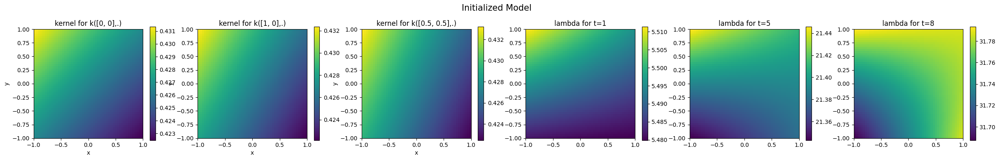

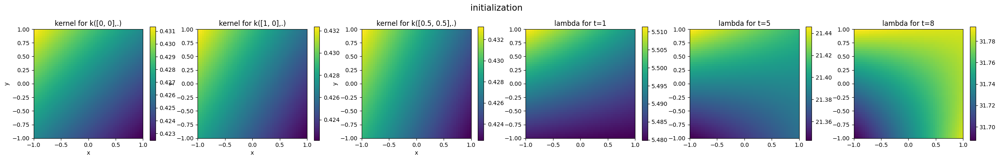

[2026-06-02T13:24:19.996297+00:00] Epoch : 0,	iter : 0,	loss : 2.77763e+01
[2026-06-02T13:25:28.313470+00:00] Epoch : 0,	iter : 5,	loss : 1.53619e+01
[2026-06-02T13:26:37.104946+00:00] Epoch : 0,	iter : 10,	loss : 9.36675e+01
[2026-06-02T13:27:44.046788+00:00] Epoch : 0,	iter : 15,	loss : 8.06813e+00
[2026-06-02T13:28:48.492491+00:00] Epoch : 0,	iter : 20,	loss : 1.15530e+01
[2026-06-02T13:29:53.692442+00:00] Epoch : 0,	iter : 25,	loss : 1.68029e+01
[2026-06-02T13:30:59.782913+00:00] Epoch : 0,	iter : 30,	loss : 1.22377e+01
[2026-06-02T13:32:04.969517+00:00] Epoch : 0,	iter : 35,	loss : 1.27920e+02
[2026-06-02T13:33:09.282208+00:00] Epoch : 0,	iter : 40,	loss : 1.64352e+01
[2026-06-02T13:34:15.108032+00:00] Epoch : 0,	iter : 45,	loss : 2.38543e+01
[2026-06-02T13:35:20.270320+00:00] Epoch : 0,	iter : 50,	loss : 8.69792e+00
[2026-06-02T13:36:24.491971+00:00] Epoch : 0,	iter : 55,	loss : 7.72172e+00
[2026-06-02T13:37:31.537714+00:00] Epoch : 0,	iter : 60,	loss : 7.34749e+00
[2026-06-02T13

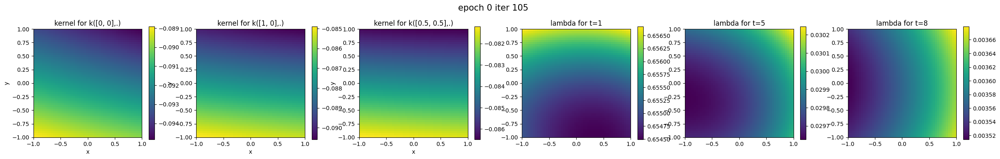

[2026-06-02T13:47:15.468155+00:00] Epoch : 0,	Total loss : 1.25587e+04
[2026-06-02T13:47:27.724660+00:00] Epoch : 1,	iter : 0,	loss : 7.09640e+00
[2026-06-02T13:48:30.371729+00:00] Epoch : 1,	iter : 5,	loss : 6.59950e+00
[2026-06-02T13:49:32.458678+00:00] Epoch : 1,	iter : 10,	loss : 7.22140e+00
[2026-06-02T13:50:34.304546+00:00] Epoch : 1,	iter : 15,	loss : 6.95279e+00
[2026-06-02T13:51:36.691318+00:00] Epoch : 1,	iter : 20,	loss : 7.34628e+00
[2026-06-02T13:52:38.115605+00:00] Epoch : 1,	iter : 25,	loss : 8.60808e+00
[2026-06-02T13:53:39.053098+00:00] Epoch : 1,	iter : 30,	loss : 9.57080e+00
[2026-06-02T13:54:42.604504+00:00] Epoch : 1,	iter : 35,	loss : 9.65578e+00
[2026-06-02T13:55:44.627207+00:00] Epoch : 1,	iter : 40,	loss : 9.59406e+00
[2026-06-02T13:56:46.282269+00:00] Epoch : 1,	iter : 45,	loss : 9.36360e+00
[2026-06-02T13:57:47.147278+00:00] Epoch : 1,	iter : 50,	loss : 8.97314e+00
[2026-06-02T13:58:47.373744+00:00] Epoch : 1,	iter : 55,	loss : 8.92844e+00
[2026-06-02T13:59:4

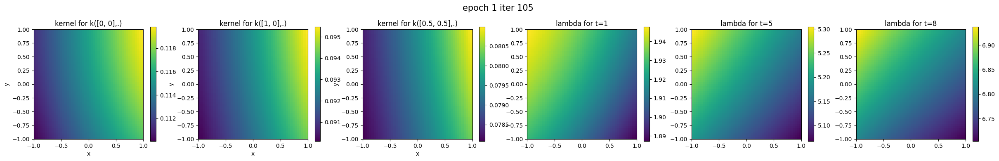

[2026-06-02T14:09:14.318826+00:00] Epoch : 1,	Total loss : 8.36928e+03
[2026-06-02T14:09:26.736879+00:00] Epoch : 2,	iter : 0,	loss : 1.08944e+01
[2026-06-02T14:10:29.234555+00:00] Epoch : 2,	iter : 5,	loss : 1.12140e+01
[2026-06-02T14:11:30.729084+00:00] Epoch : 2,	iter : 10,	loss : 9.32642e+00
[2026-06-02T14:12:32.320323+00:00] Epoch : 2,	iter : 15,	loss : 9.39852e+00
[2026-06-02T14:13:33.822931+00:00] Epoch : 2,	iter : 20,	loss : 8.79828e+00
[2026-06-02T14:14:35.588192+00:00] Epoch : 2,	iter : 25,	loss : 8.80625e+00
[2026-06-02T14:15:38.010398+00:00] Epoch : 2,	iter : 30,	loss : 8.47402e+00
[2026-06-02T14:16:39.900374+00:00] Epoch : 2,	iter : 35,	loss : 8.10816e+00
[2026-06-02T14:17:41.439500+00:00] Epoch : 2,	iter : 40,	loss : 7.84745e+00
[2026-06-02T14:18:43.485707+00:00] Epoch : 2,	iter : 45,	loss : 8.04920e+00
[2026-06-02T14:19:44.639338+00:00] Epoch : 2,	iter : 50,	loss : 7.98718e+00
[2026-06-02T14:20:46.418714+00:00] Epoch : 2,	iter : 55,	loss : 8.16330e+00
[2026-06-02T14:21:4

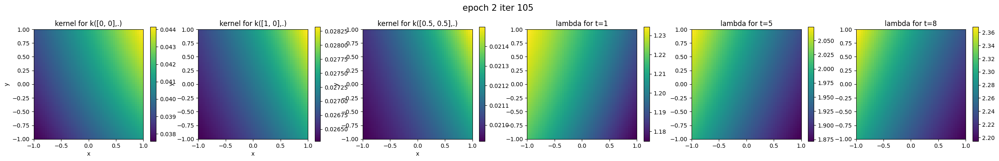

[2026-06-02T14:31:20.712518+00:00] Epoch : 2,	Total loss : 3.14621e+03
[2026-06-02T14:31:32.766041+00:00] Epoch : 3,	iter : 0,	loss : 8.17439e+00
[2026-06-02T14:32:34.755490+00:00] Epoch : 3,	iter : 5,	loss : 5.71981e+00
[2026-06-02T14:33:38.305314+00:00] Epoch : 3,	iter : 10,	loss : 8.40656e+00
[2026-06-02T14:34:41.543290+00:00] Epoch : 3,	iter : 15,	loss : 8.33174e+00
[2026-06-02T14:35:43.700289+00:00] Epoch : 3,	iter : 20,	loss : 8.08890e+00
[2026-06-02T14:36:46.787854+00:00] Epoch : 3,	iter : 25,	loss : 6.55158e+00
[2026-06-02T14:37:50.674205+00:00] Epoch : 3,	iter : 30,	loss : 8.29052e+00
[2026-06-02T14:38:54.421425+00:00] Epoch : 3,	iter : 35,	loss : 8.34368e+00
[2026-06-02T14:39:57.411540+00:00] Epoch : 3,	iter : 40,	loss : 8.60412e+00
[2026-06-02T14:40:59.244429+00:00] Epoch : 3,	iter : 45,	loss : 8.52177e+00
[2026-06-02T14:42:01.148027+00:00] Epoch : 3,	iter : 50,	loss : 2.59193e+00
[2026-06-02T14:43:01.725665+00:00] Epoch : 3,	iter : 55,	loss : 8.22108e+00
[2026-06-02T14:44:0

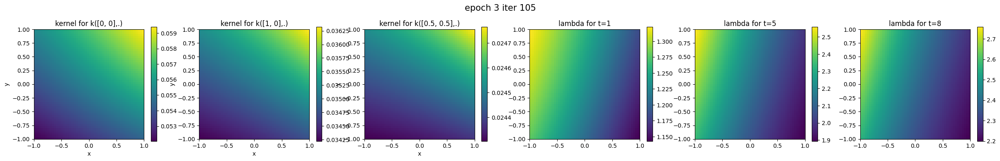

[2026-06-02T14:53:34.393626+00:00] Epoch : 3,	Total loss : 3.11528e+03
[2026-06-02T14:53:46.321970+00:00] Epoch : 4,	iter : 0,	loss : 8.14506e+00
[2026-06-02T14:54:48.525205+00:00] Epoch : 4,	iter : 5,	loss : 7.93655e+00
[2026-06-02T14:55:51.083104+00:00] Epoch : 4,	iter : 10,	loss : 8.30036e+00
[2026-06-02T14:56:54.225105+00:00] Epoch : 4,	iter : 15,	loss : 7.94064e+00
[2026-06-02T14:57:55.127825+00:00] Epoch : 4,	iter : 20,	loss : 8.40518e+00
[2026-06-02T14:58:58.968307+00:00] Epoch : 4,	iter : 25,	loss : 5.08883e+00
[2026-06-02T15:00:00.818799+00:00] Epoch : 4,	iter : 30,	loss : 6.33773e+00
[2026-06-02T15:01:03.891188+00:00] Epoch : 4,	iter : 35,	loss : 7.98994e+00
[2026-06-02T15:02:05.626725+00:00] Epoch : 4,	iter : 40,	loss : 8.09043e+00
[2026-06-02T15:03:07.748144+00:00] Epoch : 4,	iter : 45,	loss : 8.17983e+00
[2026-06-02T15:04:10.435690+00:00] Epoch : 4,	iter : 50,	loss : 8.00868e+00
[2026-06-02T15:05:13.441148+00:00] Epoch : 4,	iter : 55,	loss : 7.56105e+00
[2026-06-02T15:06:1

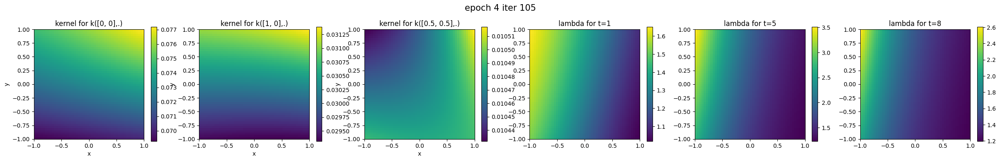

[2026-06-02T15:15:57.956041+00:00] Epoch : 4,	Total loss : 2.69264e+03
[2026-06-02T15:16:11.421508+00:00] Epoch : 5,	iter : 0,	loss : 7.48382e+00
[2026-06-02T15:17:14.705055+00:00] Epoch : 5,	iter : 5,	loss : 7.85098e+00
[2026-06-02T15:18:17.439975+00:00] Epoch : 5,	iter : 10,	loss : 8.93864e+00
[2026-06-02T15:19:18.555635+00:00] Epoch : 5,	iter : 15,	loss : 9.78114e+00
[2026-06-02T15:20:23.013775+00:00] Epoch : 5,	iter : 20,	loss : 8.15539e+00
[2026-06-02T15:21:26.009646+00:00] Epoch : 5,	iter : 25,	loss : 8.02411e+00
[2026-06-02T15:22:29.966556+00:00] Epoch : 5,	iter : 30,	loss : 7.61570e+00
[2026-06-02T15:23:32.159551+00:00] Epoch : 5,	iter : 35,	loss : 7.64375e+00
[2026-06-02T15:24:34.759399+00:00] Epoch : 5,	iter : 40,	loss : 7.54471e+00
[2026-06-02T15:25:36.368849+00:00] Epoch : 5,	iter : 45,	loss : 7.70673e+00
[2026-06-02T15:26:37.572014+00:00] Epoch : 5,	iter : 50,	loss : 7.30188e+00
[2026-06-02T15:27:39.675660+00:00] Epoch : 5,	iter : 55,	loss : 7.26874e+00
[2026-06-02T15:28:4

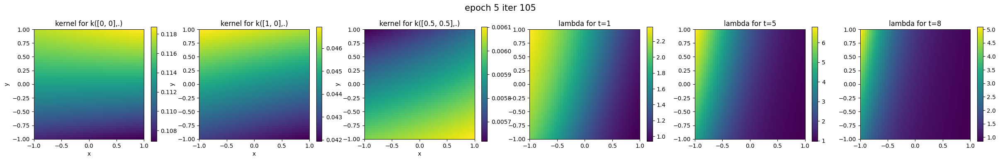

[2026-06-02T15:38:25.035965+00:00] Epoch : 5,	Total loss : 2.58109e+03
[2026-06-02T15:38:37.352126+00:00] Epoch : 6,	iter : 0,	loss : 7.34230e+00
[2026-06-02T15:39:39.928541+00:00] Epoch : 6,	iter : 5,	loss : 7.37810e+00
[2026-06-02T15:40:42.479005+00:00] Epoch : 6,	iter : 10,	loss : -1.92500e+00
[2026-06-02T15:41:45.201855+00:00] Epoch : 6,	iter : 15,	loss : 7.74593e+00
[2026-06-02T15:42:49.830307+00:00] Epoch : 6,	iter : 20,	loss : 5.92972e+00
[2026-06-02T15:43:54.347432+00:00] Epoch : 6,	iter : 25,	loss : 7.71770e+00
[2026-06-02T15:44:56.569574+00:00] Epoch : 6,	iter : 30,	loss : 7.40297e+00
[2026-06-02T15:46:00.053507+00:00] Epoch : 6,	iter : 35,	loss : 7.08747e+00
[2026-06-02T15:47:03.925242+00:00] Epoch : 6,	iter : 40,	loss : 7.39425e+00
[2026-06-02T15:48:05.864983+00:00] Epoch : 6,	iter : 45,	loss : 6.24742e+00
[2026-06-02T15:49:09.805059+00:00] Epoch : 6,	iter : 50,	loss : 7.89387e+00
[2026-06-02T15:50:12.784841+00:00] Epoch : 6,	iter : 55,	loss : 7.39719e+00
[2026-06-02T15:51:

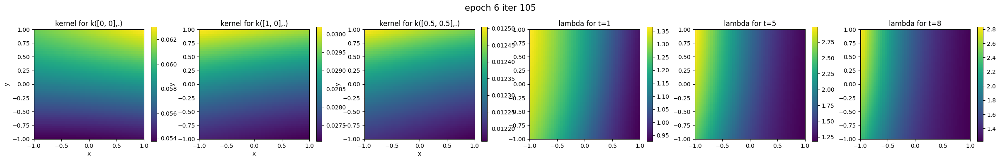

[2026-06-02T16:00:58.521633+00:00] Epoch : 6,	Total loss : 2.69815e+03
[2026-06-02T16:01:10.905179+00:00] Epoch : 7,	iter : 0,	loss : 7.32464e+00
[2026-06-02T16:02:15.342447+00:00] Epoch : 7,	iter : 5,	loss : 7.21238e+00
[2026-06-02T16:03:18.947096+00:00] Epoch : 7,	iter : 10,	loss : 6.31580e+00
[2026-06-02T16:04:20.613357+00:00] Epoch : 7,	iter : 15,	loss : 4.73063e+00
[2026-06-02T16:05:23.330158+00:00] Epoch : 7,	iter : 20,	loss : 6.63124e+00
[2026-06-02T16:06:25.410054+00:00] Epoch : 7,	iter : 25,	loss : 6.31921e+00
[2026-06-02T16:07:26.885665+00:00] Epoch : 7,	iter : 30,	loss : 8.13175e+00
[2026-06-02T16:08:29.751685+00:00] Epoch : 7,	iter : 35,	loss : 7.84571e+00
[2026-06-02T16:09:32.694225+00:00] Epoch : 7,	iter : 40,	loss : 8.61167e+00
[2026-06-02T16:10:35.031589+00:00] Epoch : 7,	iter : 45,	loss : 7.98726e+00
[2026-06-02T16:11:38.638629+00:00] Epoch : 7,	iter : 50,	loss : 7.39086e+00
[2026-06-02T16:12:41.808743+00:00] Epoch : 7,	iter : 55,	loss : 7.85340e+00
[2026-06-02T16:13:4

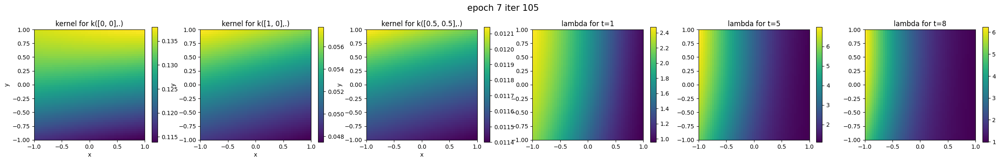

[2026-06-02T16:23:20.489725+00:00] Epoch : 7,	Total loss : 2.26927e+03
[2026-06-02T16:23:32.454069+00:00] Epoch : 8,	iter : 0,	loss : 8.36343e+00
[2026-06-02T16:24:34.779564+00:00] Epoch : 8,	iter : 5,	loss : 6.07022e+00
[2026-06-02T16:25:38.775491+00:00] Epoch : 8,	iter : 10,	loss : 7.06827e+00
[2026-06-02T16:26:41.097928+00:00] Epoch : 8,	iter : 15,	loss : 7.05381e+00
[2026-06-02T16:27:43.141373+00:00] Epoch : 8,	iter : 20,	loss : 7.32909e+00
[2026-06-02T16:28:48.241520+00:00] Epoch : 8,	iter : 25,	loss : 6.76295e+00
[2026-06-02T16:29:51.778411+00:00] Epoch : 8,	iter : 30,	loss : 6.74309e+00
[2026-06-02T16:30:54.093209+00:00] Epoch : 8,	iter : 35,	loss : 7.02839e+00
[2026-06-02T16:31:55.914740+00:00] Epoch : 8,	iter : 40,	loss : 2.95333e+00
[2026-06-02T16:32:59.771548+00:00] Epoch : 8,	iter : 45,	loss : 7.14217e+00
[2026-06-02T16:34:03.127469+00:00] Epoch : 8,	iter : 50,	loss : 6.99233e+00
[2026-06-02T16:35:06.822664+00:00] Epoch : 8,	iter : 55,	loss : 7.89190e+00
[2026-06-02T16:36:0

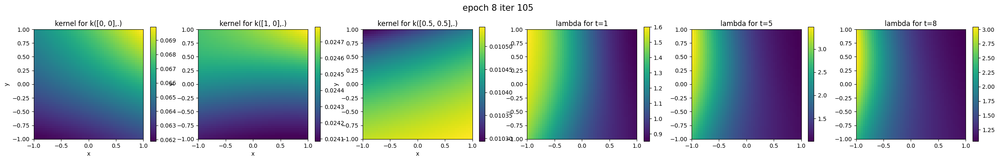

[2026-06-02T16:45:47.669217+00:00] Epoch : 8,	Total loss : 2.42190e+03
[2026-06-02T16:46:00.174670+00:00] Epoch : 9,	iter : 0,	loss : 7.28116e+00
[2026-06-02T16:47:04.272873+00:00] Epoch : 9,	iter : 5,	loss : 7.37234e+00
[2026-06-02T16:48:07.583885+00:00] Epoch : 9,	iter : 10,	loss : 7.27464e+00
[2026-06-02T16:49:09.894880+00:00] Epoch : 9,	iter : 15,	loss : 3.38112e+00
[2026-06-02T16:50:12.613370+00:00] Epoch : 9,	iter : 20,	loss : 5.62359e+00
[2026-06-02T16:51:15.422801+00:00] Epoch : 9,	iter : 25,	loss : 7.35197e+00
[2026-06-02T16:52:16.627669+00:00] Epoch : 9,	iter : 30,	loss : 6.55160e+00
[2026-06-02T16:53:18.974221+00:00] Epoch : 9,	iter : 35,	loss : 9.85056e-01
[2026-06-02T16:54:21.750213+00:00] Epoch : 9,	iter : 40,	loss : 7.35924e+00
[2026-06-02T16:55:26.481553+00:00] Epoch : 9,	iter : 45,	loss : 4.41505e+00
[2026-06-02T16:56:29.339098+00:00] Epoch : 9,	iter : 50,	loss : 7.04590e+00
[2026-06-02T16:57:33.153203+00:00] Epoch : 9,	iter : 55,	loss : 6.19989e+00
[2026-06-02T16:58:3

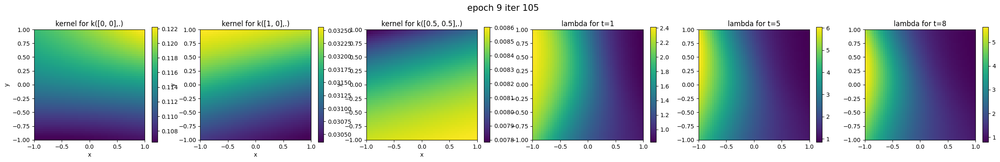

[2026-06-02T17:08:17.372982+00:00] Epoch : 9,	Total loss : 1.96852e+03
[2026-06-02T17:08:29.749732+00:00] Epoch : 10,	iter : 0,	loss : 7.24964e+00
[2026-06-02T17:09:33.066562+00:00] Epoch : 10,	iter : 5,	loss : 7.13063e+00
[2026-06-02T17:10:36.911081+00:00] Epoch : 10,	iter : 10,	loss : 6.82913e+00
[2026-06-02T17:11:39.314794+00:00] Epoch : 10,	iter : 15,	loss : -7.16937e+01
[2026-06-02T17:12:41.676901+00:00] Epoch : 10,	iter : 20,	loss : 7.10769e+00
[2026-06-02T17:13:45.789214+00:00] Epoch : 10,	iter : 25,	loss : 5.99520e+00
[2026-06-02T17:14:47.488535+00:00] Epoch : 10,	iter : 30,	loss : 4.73485e+00
[2026-06-02T17:15:50.481706+00:00] Epoch : 10,	iter : 35,	loss : 7.42479e+00
[2026-06-02T17:16:52.752094+00:00] Epoch : 10,	iter : 40,	loss : 7.97694e+00
[2026-06-02T17:17:56.861500+00:00] Epoch : 10,	iter : 45,	loss : 7.51386e+00
[2026-06-02T17:19:00.293264+00:00] Epoch : 10,	iter : 50,	loss : 6.80264e+00
[2026-06-02T17:20:02.768617+00:00] Epoch : 10,	iter : 55,	loss : 6.65125e+00
[2026-

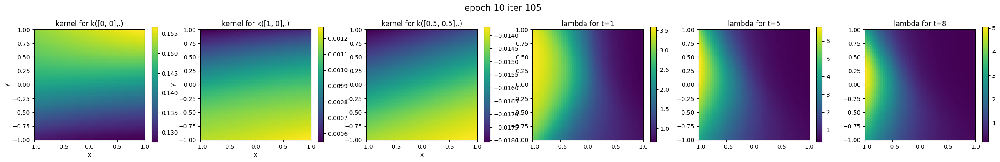

[2026-06-02T17:30:47.177176+00:00] Epoch : 10,	Total loss : 1.63307e+03
[2026-06-02T17:30:59.538715+00:00] Epoch : 11,	iter : 0,	loss : -1.74925e-01
[2026-06-02T17:32:02.535152+00:00] Epoch : 11,	iter : 5,	loss : 6.75696e+00
[2026-06-02T17:33:05.106375+00:00] Epoch : 11,	iter : 10,	loss : 5.16402e+00
[2026-06-02T17:34:07.258014+00:00] Epoch : 11,	iter : 15,	loss : 4.24601e+00
[2026-06-02T17:35:10.498060+00:00] Epoch : 11,	iter : 20,	loss : 6.27681e+00
[2026-06-02T17:36:12.956994+00:00] Epoch : 11,	iter : 25,	loss : 3.15219e+00
[2026-06-02T17:37:17.051521+00:00] Epoch : 11,	iter : 30,	loss : 5.90725e+00
[2026-06-02T17:38:19.439025+00:00] Epoch : 11,	iter : 35,	loss : 5.17660e+00
[2026-06-02T17:39:22.918097+00:00] Epoch : 11,	iter : 40,	loss : 6.64775e+00
[2026-06-02T17:40:24.652206+00:00] Epoch : 11,	iter : 45,	loss : 6.77047e+00
[2026-06-02T17:41:27.929747+00:00] Epoch : 11,	iter : 50,	loss : 7.32539e+00
[2026-06-02T17:42:31.250445+00:00] Epoch : 11,	iter : 55,	loss : 8.53384e+00
[2026

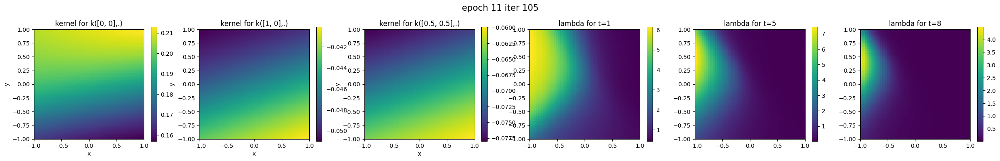

[2026-06-02T17:53:17.890667+00:00] Epoch : 11,	Total loss : 8.91373e+02
[2026-06-02T17:53:30.372766+00:00] Epoch : 12,	iter : 0,	loss : 5.70796e+00
[2026-06-02T17:54:36.402802+00:00] Epoch : 12,	iter : 5,	loss : -5.58911e+00
[2026-06-02T17:55:40.586343+00:00] Epoch : 12,	iter : 10,	loss : 6.18546e+00
[2026-06-02T17:56:43.099361+00:00] Epoch : 12,	iter : 15,	loss : 3.38366e+00
[2026-06-02T17:57:45.187404+00:00] Epoch : 12,	iter : 20,	loss : 3.38491e+00
[2026-06-02T17:58:48.502127+00:00] Epoch : 12,	iter : 25,	loss : 6.23737e+00
[2026-06-02T17:59:50.680651+00:00] Epoch : 12,	iter : 30,	loss : 6.98377e+00
[2026-06-02T18:00:53.346328+00:00] Epoch : 12,	iter : 35,	loss : 9.50837e+00
[2026-06-02T18:01:56.446357+00:00] Epoch : 12,	iter : 40,	loss : 7.44304e+00
[2026-06-02T18:02:57.750880+00:00] Epoch : 12,	iter : 45,	loss : 7.57900e+00
[2026-06-02T18:04:00.230566+00:00] Epoch : 12,	iter : 50,	loss : 6.12485e+00
[2026-06-02T18:05:03.938460+00:00] Epoch : 12,	iter : 55,	loss : 5.97273e+00
[2026

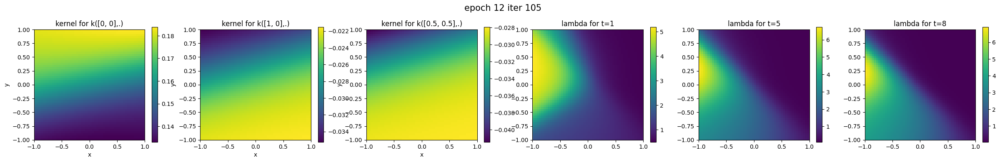

[2026-06-02T18:15:49.781746+00:00] Epoch : 12,	Total loss : 1.12057e+03
[2026-06-02T18:16:02.049486+00:00] Epoch : 13,	iter : 0,	loss : 6.54327e+00
[2026-06-02T18:17:03.596623+00:00] Epoch : 13,	iter : 5,	loss : 3.74414e+00
[2026-06-02T18:18:05.705794+00:00] Epoch : 13,	iter : 10,	loss : 6.04836e+00
[2026-06-02T18:19:07.749821+00:00] Epoch : 13,	iter : 15,	loss : 5.90318e+00
[2026-06-02T18:20:10.513073+00:00] Epoch : 13,	iter : 20,	loss : 5.79183e+00
[2026-06-02T18:21:12.190562+00:00] Epoch : 13,	iter : 25,	loss : 5.95791e+00
[2026-06-02T18:22:17.526403+00:00] Epoch : 13,	iter : 30,	loss : 4.41948e+00
[2026-06-02T18:23:21.892537+00:00] Epoch : 13,	iter : 35,	loss : 6.43201e+00
[2026-06-02T18:24:25.082919+00:00] Epoch : 13,	iter : 40,	loss : 5.46558e+00
[2026-06-02T18:25:28.117646+00:00] Epoch : 13,	iter : 45,	loss : 4.36499e+00
[2026-06-02T18:26:30.606040+00:00] Epoch : 13,	iter : 50,	loss : 6.64399e+00
[2026-06-02T18:27:32.456157+00:00] Epoch : 13,	iter : 55,	loss : 6.27045e+00
[2026-

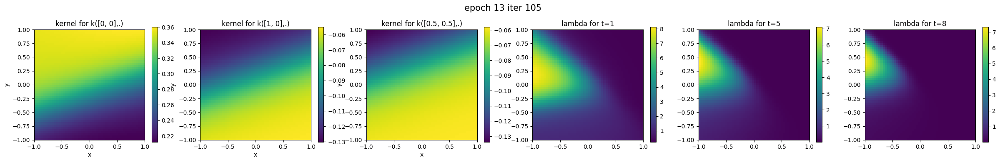

[2026-06-02T18:38:13.191642+00:00] Epoch : 13,	Total loss : 1.12856e+02
[2026-06-02T18:38:25.904700+00:00] Epoch : 14,	iter : 0,	loss : 5.91643e+00
[2026-06-02T18:39:29.626493+00:00] Epoch : 14,	iter : 5,	loss : 5.11512e+00
[2026-06-02T18:40:32.046617+00:00] Epoch : 14,	iter : 10,	loss : 2.95654e+00
[2026-06-02T18:41:34.772266+00:00] Epoch : 14,	iter : 15,	loss : 4.53783e+00
[2026-06-02T18:42:37.192953+00:00] Epoch : 14,	iter : 20,	loss : 4.87287e+00
[2026-06-02T18:43:38.655271+00:00] Epoch : 14,	iter : 25,	loss : -4.90367e+01
[2026-06-02T18:44:41.306553+00:00] Epoch : 14,	iter : 30,	loss : -1.03146e+01
[2026-06-02T18:45:44.770767+00:00] Epoch : 14,	iter : 35,	loss : 6.20460e+00
[2026-06-02T18:46:47.210195+00:00] Epoch : 14,	iter : 40,	loss : 3.90392e+00
[2026-06-02T18:47:50.205168+00:00] Epoch : 14,	iter : 45,	loss : 3.93635e+00
[2026-06-02T18:48:52.078260+00:00] Epoch : 14,	iter : 50,	loss : 4.65517e+00
[2026-06-02T18:49:54.360799+00:00] Epoch : 14,	iter : 55,	loss : 6.62121e+00
[202

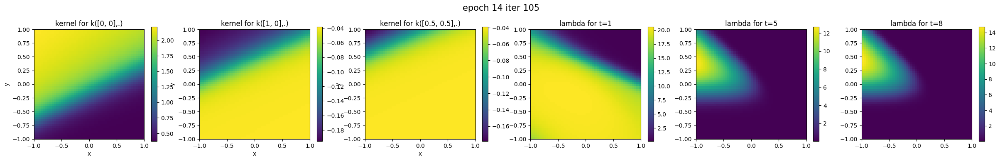

[2026-06-02T19:00:32.684329+00:00] Epoch : 14,	Total loss : -5.40991e+01
[2026-06-02T19:00:45.280410+00:00] Epoch : 15,	iter : 0,	loss : 5.70302e+00
[2026-06-02T19:01:46.880402+00:00] Epoch : 15,	iter : 5,	loss : 1.08330e+00
[2026-06-02T19:02:48.756983+00:00] Epoch : 15,	iter : 10,	loss : 4.73247e+00
[2026-06-02T19:03:51.975869+00:00] Epoch : 15,	iter : 15,	loss : 4.08324e+00
[2026-06-02T19:04:54.251258+00:00] Epoch : 15,	iter : 20,	loss : 4.43347e+00
[2026-06-02T19:05:57.587386+00:00] Epoch : 15,	iter : 25,	loss : 9.74157e-01
[2026-06-02T19:07:00.135962+00:00] Epoch : 15,	iter : 30,	loss : 5.25199e+00
[2026-06-02T19:08:03.040531+00:00] Epoch : 15,	iter : 35,	loss : -3.01148e+00
[2026-06-02T19:09:06.327341+00:00] Epoch : 15,	iter : 40,	loss : 5.03453e+00
[2026-06-02T19:10:09.778104+00:00] Epoch : 15,	iter : 45,	loss : 4.74596e+00
[2026-06-02T19:11:12.860446+00:00] Epoch : 15,	iter : 50,	loss : -2.98502e+00
[2026-06-02T19:12:18.882366+00:00] Epoch : 15,	iter : 55,	loss : 4.76394e+00
[20

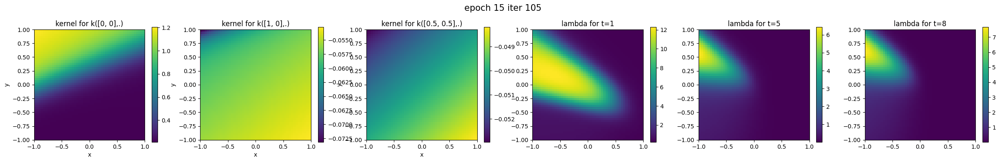

[2026-06-02T19:23:22.680826+00:00] Epoch : 15,	Total loss : -1.83747e+02
[2026-06-02T19:23:37.455906+00:00] Epoch : 16,	iter : 0,	loss : 5.19301e+00
[2026-06-02T19:24:50.375261+00:00] Epoch : 16,	iter : 5,	loss : 5.58945e+00
[2026-06-02T19:26:02.957051+00:00] Epoch : 16,	iter : 10,	loss : 5.52901e+00
[2026-06-02T19:27:16.247917+00:00] Epoch : 16,	iter : 15,	loss : 5.03588e+00
[2026-06-02T19:28:27.979570+00:00] Epoch : 16,	iter : 20,	loss : 5.86396e+00
[2026-06-02T19:29:39.397674+00:00] Epoch : 16,	iter : 25,	loss : 2.07708e+00
[2026-06-02T19:30:48.513987+00:00] Epoch : 16,	iter : 30,	loss : 5.40701e+00
[2026-06-02T19:31:51.854057+00:00] Epoch : 16,	iter : 35,	loss : 4.74912e+00
[2026-06-02T19:32:54.222230+00:00] Epoch : 16,	iter : 40,	loss : 3.48161e+00
[2026-06-02T19:33:55.710282+00:00] Epoch : 16,	iter : 45,	loss : 4.91732e+00
[2026-06-02T19:34:57.520759+00:00] Epoch : 16,	iter : 50,	loss : -1.69465e+01
[2026-06-02T19:35:58.669650+00:00] Epoch : 16,	iter : 55,	loss : 1.40940e+00
[202

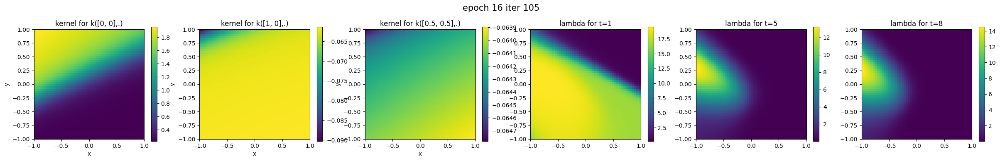

[2026-06-02T19:46:24.959469+00:00] Epoch : 16,	Total loss : -4.78627e+02
[2026-06-02T19:46:37.164219+00:00] Epoch : 17,	iter : 0,	loss : 5.27966e+00
[2026-06-02T19:47:40.374005+00:00] Epoch : 17,	iter : 5,	loss : 3.74845e+00
[2026-06-02T19:48:44.507346+00:00] Epoch : 17,	iter : 10,	loss : 5.64814e+00
[2026-06-02T19:49:47.757455+00:00] Epoch : 17,	iter : 15,	loss : 1.67751e+00
[2026-06-02T19:50:52.132551+00:00] Epoch : 17,	iter : 20,	loss : 3.92731e+00
[2026-06-02T19:51:55.617840+00:00] Epoch : 17,	iter : 25,	loss : 4.50764e+00
[2026-06-02T19:52:59.736759+00:00] Epoch : 17,	iter : 30,	loss : -3.96925e+00
[2026-06-02T19:54:03.085882+00:00] Epoch : 17,	iter : 35,	loss : 5.90036e+00
[2026-06-02T19:55:06.483082+00:00] Epoch : 17,	iter : 40,	loss : 5.88219e+00
[2026-06-02T19:56:11.579709+00:00] Epoch : 17,	iter : 45,	loss : 2.97411e+00
[2026-06-02T19:57:15.918230+00:00] Epoch : 17,	iter : 50,	loss : -6.18682e+00
[2026-06-02T19:58:20.711892+00:00] Epoch : 17,	iter : 55,	loss : 5.20198e+00
[20

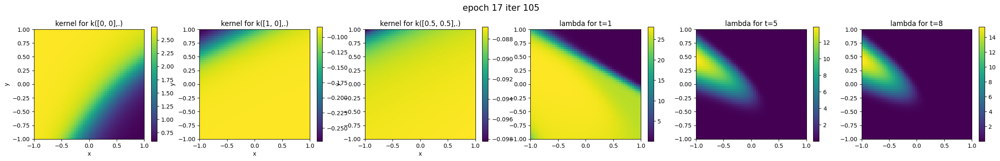

[2026-06-02T20:08:53.578466+00:00] Epoch : 17,	Total loss : -9.93567e+02
[2026-06-02T20:09:05.822253+00:00] Epoch : 18,	iter : 0,	loss : 4.87509e+00
[2026-06-02T20:10:05.987339+00:00] Epoch : 18,	iter : 5,	loss : 3.48673e+00
[2026-06-02T20:11:08.929179+00:00] Epoch : 18,	iter : 10,	loss : 4.85452e+00
[2026-06-02T20:12:10.447473+00:00] Epoch : 18,	iter : 15,	loss : 4.73222e+00
[2026-06-02T20:13:12.972849+00:00] Epoch : 18,	iter : 20,	loss : 2.97962e+00
[2026-06-02T20:14:14.176513+00:00] Epoch : 18,	iter : 25,	loss : 3.11674e+00
[2026-06-02T20:15:15.392502+00:00] Epoch : 18,	iter : 30,	loss : 3.25740e+00
[2026-06-02T20:16:16.532150+00:00] Epoch : 18,	iter : 35,	loss : -9.41322e-01
[2026-06-02T20:17:16.571668+00:00] Epoch : 18,	iter : 40,	loss : -7.74343e-01
[2026-06-02T20:18:17.558775+00:00] Epoch : 18,	iter : 45,	loss : 5.00311e+00
[2026-06-02T20:19:17.932671+00:00] Epoch : 18,	iter : 50,	loss : -3.33678e+02
[2026-06-02T20:20:20.246629+00:00] Epoch : 18,	iter : 55,	loss : 4.00623e+00
[2

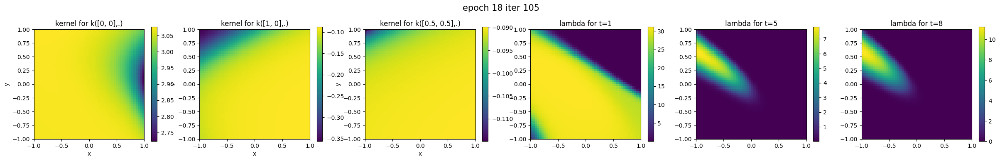

[2026-06-02T20:30:46.652506+00:00] Epoch : 18,	Total loss : -1.69258e+03
[2026-06-02T20:30:58.816038+00:00] Epoch : 19,	iter : 0,	loss : 5.34425e+00
[2026-06-02T20:31:59.791835+00:00] Epoch : 19,	iter : 5,	loss : 4.27313e+00
[2026-06-02T20:33:00.832228+00:00] Epoch : 19,	iter : 10,	loss : 1.86935e+00
[2026-06-02T20:34:01.560966+00:00] Epoch : 19,	iter : 15,	loss : -5.04955e+01
[2026-06-02T20:35:02.967059+00:00] Epoch : 19,	iter : 20,	loss : 5.75572e+00
[2026-06-02T20:36:04.318204+00:00] Epoch : 19,	iter : 25,	loss : 5.15035e+00
[2026-06-02T20:37:07.370060+00:00] Epoch : 19,	iter : 30,	loss : -1.21527e+00
[2026-06-02T20:38:08.042650+00:00] Epoch : 19,	iter : 35,	loss : -8.77095e-01
[2026-06-02T20:39:11.261950+00:00] Epoch : 19,	iter : 40,	loss : 1.41570e+00
[2026-06-02T20:40:13.951839+00:00] Epoch : 19,	iter : 45,	loss : 3.73538e+00
[2026-06-02T20:41:15.427526+00:00] Epoch : 19,	iter : 50,	loss : 2.03270e+00
[2026-06-02T20:42:16.492810+00:00] Epoch : 19,	iter : 55,	loss : -4.22914e+00
[

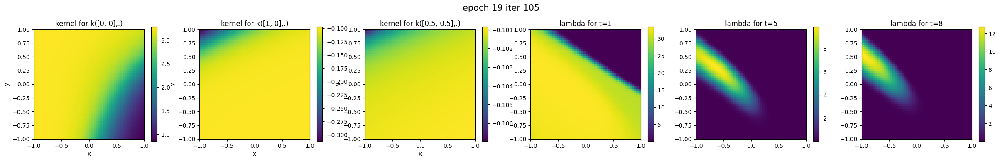

[2026-06-02T20:52:45.489677+00:00] Epoch : 19,	Total loss : -1.89050e+03
[2026-06-02T20:52:57.791463+00:00] Epoch : 20,	iter : 0,	loss : 5.17964e-02
[2026-06-02T20:54:01.639872+00:00] Epoch : 20,	iter : 5,	loss : -1.09756e+00
[2026-06-02T20:55:02.859937+00:00] Epoch : 20,	iter : 10,	loss : 1.86025e+00
[2026-06-02T20:56:04.079245+00:00] Epoch : 20,	iter : 15,	loss : 3.89976e+00
[2026-06-02T20:57:06.188313+00:00] Epoch : 20,	iter : 20,	loss : 3.70847e+00
[2026-06-02T20:58:09.069077+00:00] Epoch : 20,	iter : 25,	loss : 5.98679e-01
[2026-06-02T20:59:10.803132+00:00] Epoch : 20,	iter : 30,	loss : 6.10671e-01
[2026-06-02T21:00:13.087166+00:00] Epoch : 20,	iter : 35,	loss : -1.22797e+01
[2026-06-02T21:01:17.084174+00:00] Epoch : 20,	iter : 40,	loss : 7.87621e-01
[2026-06-02T21:02:18.028393+00:00] Epoch : 20,	iter : 45,	loss : 3.12157e+00
[2026-06-02T21:03:19.956439+00:00] Epoch : 20,	iter : 50,	loss : 3.73988e+00
[2026-06-02T21:04:20.325612+00:00] Epoch : 20,	iter : 55,	loss : 3.04883e+00
[20

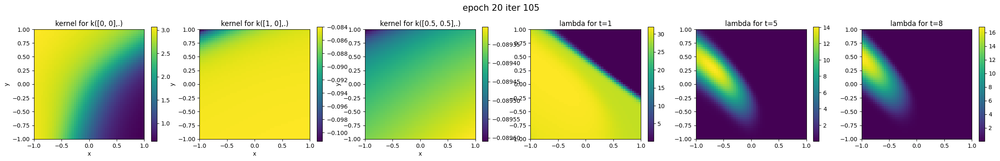

[2026-06-02T21:14:51.180244+00:00] Epoch : 20,	Total loss : -1.88764e+03
[2026-06-02T21:15:03.548151+00:00] Epoch : 21,	iter : 0,	loss : 5.62678e+00
[2026-06-02T21:16:04.539734+00:00] Epoch : 21,	iter : 5,	loss : -2.06048e+01
[2026-06-02T21:17:05.502491+00:00] Epoch : 21,	iter : 10,	loss : 1.76461e+00
[2026-06-02T21:18:06.509933+00:00] Epoch : 21,	iter : 15,	loss : -3.03650e+00
[2026-06-02T21:19:06.804962+00:00] Epoch : 21,	iter : 20,	loss : 4.82972e+00
[2026-06-02T21:20:08.477463+00:00] Epoch : 21,	iter : 25,	loss : -8.92925e+00
[2026-06-02T21:21:11.113920+00:00] Epoch : 21,	iter : 30,	loss : 1.27868e+00
[2026-06-02T21:22:11.854561+00:00] Epoch : 21,	iter : 35,	loss : 2.73616e+00
[2026-06-02T21:23:14.255270+00:00] Epoch : 21,	iter : 40,	loss : 4.58136e+00
[2026-06-02T21:24:15.986882+00:00] Epoch : 21,	iter : 45,	loss : -6.20475e+00
[2026-06-02T21:25:19.886859+00:00] Epoch : 21,	iter : 50,	loss : 4.02213e+00
[2026-06-02T21:26:23.197879+00:00] Epoch : 21,	iter : 55,	loss : -3.46823e+02


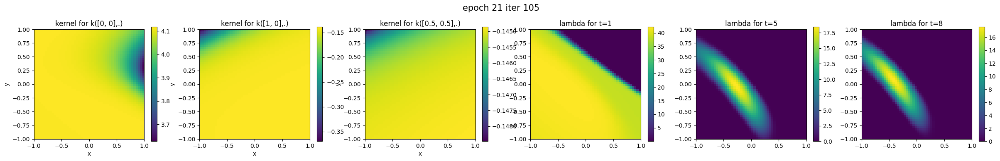

[2026-06-02T21:36:55.460689+00:00] Epoch : 21,	Total loss : -2.87550e+03
[2026-06-02T21:37:07.950974+00:00] Epoch : 22,	iter : 0,	loss : 1.38040e+00
[2026-06-02T21:38:11.082402+00:00] Epoch : 22,	iter : 5,	loss : 5.79815e-01
[2026-06-02T21:39:12.343969+00:00] Epoch : 22,	iter : 10,	loss : 3.89209e+00
[2026-06-02T21:40:15.366093+00:00] Epoch : 22,	iter : 15,	loss : -2.55294e+00
[2026-06-02T21:41:17.372025+00:00] Epoch : 22,	iter : 20,	loss : -3.80195e+00
[2026-06-02T21:42:19.724225+00:00] Epoch : 22,	iter : 25,	loss : 4.06399e+00
[2026-06-02T21:43:23.841257+00:00] Epoch : 22,	iter : 30,	loss : 2.76580e+00
[2026-06-02T21:44:25.719988+00:00] Epoch : 22,	iter : 35,	loss : -8.38792e+01
[2026-06-02T21:45:28.978918+00:00] Epoch : 22,	iter : 40,	loss : 2.40053e+00
[2026-06-02T21:46:31.658681+00:00] Epoch : 22,	iter : 45,	loss : -2.60495e+01
[2026-06-02T21:47:35.711808+00:00] Epoch : 22,	iter : 50,	loss : 1.03025e+00
[2026-06-02T21:48:37.389915+00:00] Epoch : 22,	iter : 55,	loss : -1.52276e+00


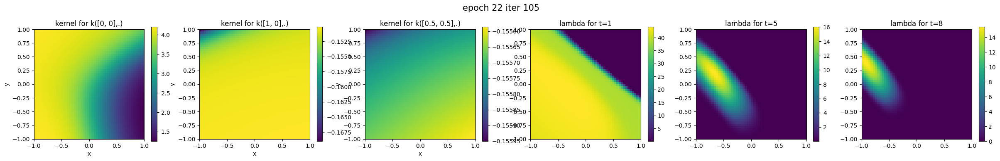

[2026-06-02T21:59:24.097656+00:00] Epoch : 22,	Total loss : -2.96809e+03
[2026-06-02T21:59:35.919325+00:00] Epoch : 23,	iter : 0,	loss : 3.30173e+00
[2026-06-02T22:00:39.071590+00:00] Epoch : 23,	iter : 5,	loss : -1.02187e+02
[2026-06-02T22:01:42.338491+00:00] Epoch : 23,	iter : 10,	loss : 7.99890e-01
[2026-06-02T22:02:45.788522+00:00] Epoch : 23,	iter : 15,	loss : 7.92371e+00
[2026-06-02T22:03:48.321610+00:00] Epoch : 23,	iter : 20,	loss : 1.27870e+00
[2026-06-02T22:04:51.111218+00:00] Epoch : 23,	iter : 25,	loss : 1.60645e+00
[2026-06-02T22:05:54.128006+00:00] Epoch : 23,	iter : 30,	loss : 1.67892e+00
[2026-06-02T22:06:55.910650+00:00] Epoch : 23,	iter : 35,	loss : -3.02733e+00
[2026-06-02T22:08:01.283730+00:00] Epoch : 23,	iter : 40,	loss : 1.99224e+00
[2026-06-02T22:09:03.897098+00:00] Epoch : 23,	iter : 45,	loss : -6.09731e+01
[2026-06-02T22:10:05.852189+00:00] Epoch : 23,	iter : 50,	loss : 2.98467e+00
[2026-06-02T22:11:08.184761+00:00] Epoch : 23,	iter : 55,	loss : 2.50036e+00
[2

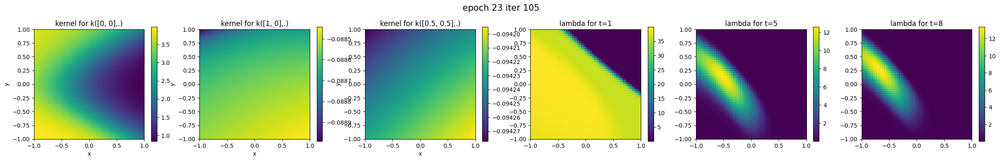

[2026-06-02T22:22:01.268514+00:00] Epoch : 23,	Total loss : -1.58463e+03
[2026-06-02T22:22:13.430699+00:00] Epoch : 24,	iter : 0,	loss : 4.13921e+00
[2026-06-02T22:23:16.663478+00:00] Epoch : 24,	iter : 5,	loss : 2.22194e-01
[2026-06-02T22:24:20.275781+00:00] Epoch : 24,	iter : 10,	loss : -1.07598e+01
[2026-06-02T22:25:24.768606+00:00] Epoch : 24,	iter : 15,	loss : 3.08563e+00
[2026-06-02T22:26:27.817397+00:00] Epoch : 24,	iter : 20,	loss : -5.06165e+00
[2026-06-02T22:27:31.742827+00:00] Epoch : 24,	iter : 25,	loss : 3.43215e+00
[2026-06-02T22:28:34.897464+00:00] Epoch : 24,	iter : 30,	loss : -2.53149e+00
[2026-06-02T22:29:39.218280+00:00] Epoch : 24,	iter : 35,	loss : 3.19627e+00
[2026-06-02T22:30:43.119022+00:00] Epoch : 24,	iter : 40,	loss : -2.26343e+01
[2026-06-02T22:31:48.263066+00:00] Epoch : 24,	iter : 45,	loss : 2.72384e+00
[2026-06-02T22:32:50.714569+00:00] Epoch : 24,	iter : 50,	loss : -4.87680e+00
[2026-06-02T22:33:55.325777+00:00] Epoch : 24,	iter : 55,	loss : -1.00151e+00

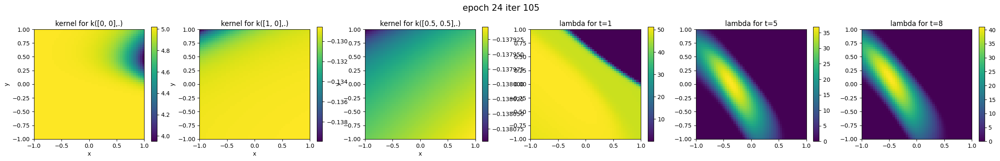

[2026-06-02T22:44:46.753732+00:00] Epoch : 24,	Total loss : -3.47072e+03
[2026-06-02T22:44:59.012120+00:00] Epoch : 25,	iter : 0,	loss : 2.18403e-02
[2026-06-02T22:46:00.679165+00:00] Epoch : 25,	iter : 5,	loss : 2.08583e+00
[2026-06-02T22:47:02.606433+00:00] Epoch : 25,	iter : 10,	loss : 1.24868e+00
[2026-06-02T22:48:05.583726+00:00] Epoch : 25,	iter : 15,	loss : 1.22365e+00
[2026-06-02T22:49:07.340609+00:00] Epoch : 25,	iter : 20,	loss : -7.31374e+00
[2026-06-02T22:50:09.224667+00:00] Epoch : 25,	iter : 25,	loss : 3.35591e+00
[2026-06-02T22:51:12.473094+00:00] Epoch : 25,	iter : 30,	loss : -1.17725e+01
[2026-06-02T22:52:12.856314+00:00] Epoch : 25,	iter : 35,	loss : -2.85325e+01
[2026-06-02T22:53:17.102071+00:00] Epoch : 25,	iter : 40,	loss : 7.02558e-01
[2026-06-02T22:54:18.469906+00:00] Epoch : 25,	iter : 45,	loss : 3.11046e+00
[2026-06-02T22:55:21.334737+00:00] Epoch : 25,	iter : 50,	loss : -2.02471e-01
[2026-06-02T22:56:25.300525+00:00] Epoch : 25,	iter : 55,	loss : -1.47104e+00


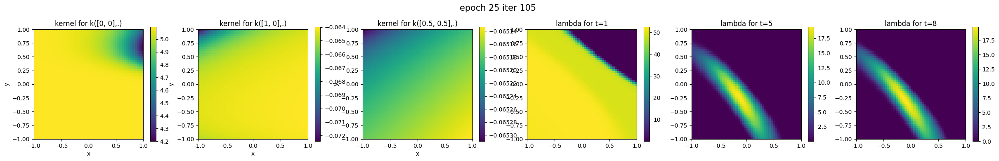

[2026-06-02T23:07:19.818461+00:00] Epoch : 25,	Total loss : -3.05360e+03
[2026-06-02T23:07:32.316977+00:00] Epoch : 26,	iter : 0,	loss : 1.44090e+00
[2026-06-02T23:08:37.115376+00:00] Epoch : 26,	iter : 5,	loss : 1.46051e+00
[2026-06-02T23:09:42.358181+00:00] Epoch : 26,	iter : 10,	loss : 7.22901e-01
[2026-06-02T23:10:46.710974+00:00] Epoch : 26,	iter : 15,	loss : -1.29990e-01
[2026-06-02T23:11:49.588615+00:00] Epoch : 26,	iter : 20,	loss : -8.13148e+00
[2026-06-02T23:12:53.705838+00:00] Epoch : 26,	iter : 25,	loss : -3.13335e+00
[2026-06-02T23:13:59.139227+00:00] Epoch : 26,	iter : 30,	loss : 3.65870e+00
[2026-06-02T23:15:05.240263+00:00] Epoch : 26,	iter : 35,	loss : -8.18457e+01
[2026-06-02T23:16:10.824772+00:00] Epoch : 26,	iter : 40,	loss : 2.09447e+00
[2026-06-02T23:17:15.747913+00:00] Epoch : 26,	iter : 45,	loss : 1.91371e+00
[2026-06-02T23:18:20.446889+00:00] Epoch : 26,	iter : 50,	loss : -1.43432e+01
[2026-06-02T23:19:25.225078+00:00] Epoch : 26,	iter : 55,	loss : 1.19737e+00


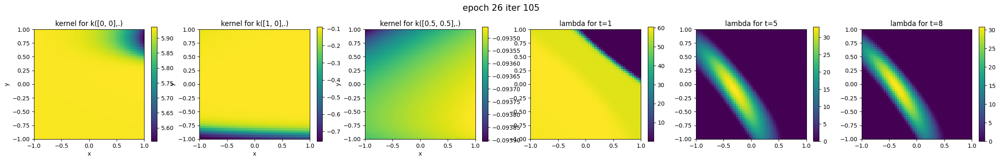

[2026-06-02T23:30:27.801814+00:00] Epoch : 26,	Total loss : -3.95722e+03
[2026-06-02T23:30:40.048255+00:00] Epoch : 27,	iter : 0,	loss : 7.13902e-01
[2026-06-02T23:31:44.156703+00:00] Epoch : 27,	iter : 5,	loss : -1.05646e+01
[2026-06-02T23:32:49.754176+00:00] Epoch : 27,	iter : 10,	loss : -1.69781e+01
[2026-06-02T23:33:53.105244+00:00] Epoch : 27,	iter : 15,	loss : -1.60832e+00
[2026-06-02T23:34:58.015430+00:00] Epoch : 27,	iter : 20,	loss : -1.51616e+02
[2026-06-02T23:36:02.209888+00:00] Epoch : 27,	iter : 25,	loss : 1.66673e+00
[2026-06-02T23:37:04.168019+00:00] Epoch : 27,	iter : 30,	loss : 6.57591e-01
[2026-06-02T23:38:07.284854+00:00] Epoch : 27,	iter : 35,	loss : 1.42801e+00
[2026-06-02T23:39:09.188512+00:00] Epoch : 27,	iter : 40,	loss : -7.72020e+00
[2026-06-02T23:40:10.812652+00:00] Epoch : 27,	iter : 45,	loss : -1.19703e+01
[2026-06-02T23:41:13.043636+00:00] Epoch : 27,	iter : 50,	loss : 3.55659e+00
[2026-06-02T23:42:16.887262+00:00] Epoch : 27,	iter : 55,	loss : -2.37988e+0

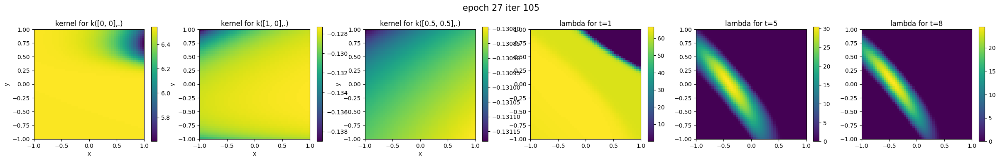

[2026-06-02T23:53:08.363233+00:00] Epoch : 27,	Total loss : -4.38815e+03
[2026-06-02T23:53:20.637952+00:00] Epoch : 28,	iter : 0,	loss : 6.43789e-01
[2026-06-02T23:54:24.151316+00:00] Epoch : 28,	iter : 5,	loss : -1.95967e+01
[2026-06-02T23:55:30.284687+00:00] Epoch : 28,	iter : 10,	loss : 2.30449e+00
[2026-06-02T23:56:34.611560+00:00] Epoch : 28,	iter : 15,	loss : 1.03090e+00
[2026-06-02T23:57:43.603629+00:00] Epoch : 28,	iter : 20,	loss : 1.96561e+00
[2026-06-02T23:58:51.888261+00:00] Epoch : 28,	iter : 25,	loss : 1.86463e+00
[2026-06-03T00:00:00.238492+00:00] Epoch : 28,	iter : 30,	loss : 1.18069e+00
[2026-06-03T00:01:08.892576+00:00] Epoch : 28,	iter : 35,	loss : 9.65456e-01
[2026-06-03T00:02:16.918583+00:00] Epoch : 28,	iter : 40,	loss : -8.89790e+00
[2026-06-03T00:03:23.610627+00:00] Epoch : 28,	iter : 45,	loss : 2.23257e+00
[2026-06-03T00:04:29.367103+00:00] Epoch : 28,	iter : 50,	loss : 1.59078e+00
[2026-06-03T00:05:32.565005+00:00] Epoch : 28,	iter : 55,	loss : -7.74557e+00
[2

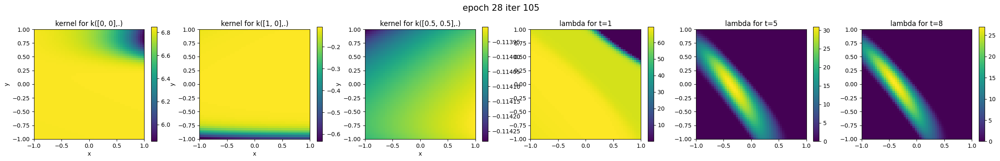

[2026-06-03T00:16:39.386395+00:00] Epoch : 28,	Total loss : -4.31108e+03
[2026-06-03T00:16:51.538338+00:00] Epoch : 29,	iter : 0,	loss : 9.45035e-01
[2026-06-03T00:17:56.763435+00:00] Epoch : 29,	iter : 5,	loss : -6.07969e+00
[2026-06-03T00:19:01.825744+00:00] Epoch : 29,	iter : 10,	loss : 2.44075e+00
[2026-06-03T00:20:06.292347+00:00] Epoch : 29,	iter : 15,	loss : -8.76629e+00
[2026-06-03T00:21:11.211204+00:00] Epoch : 29,	iter : 20,	loss : -4.08624e+00
[2026-06-03T00:22:16.917146+00:00] Epoch : 29,	iter : 25,	loss : 2.29297e+00
[2026-06-03T00:23:20.355742+00:00] Epoch : 29,	iter : 30,	loss : -2.64309e+00
[2026-06-03T00:24:23.753006+00:00] Epoch : 29,	iter : 35,	loss : 1.19214e+00
[2026-06-03T00:25:29.667452+00:00] Epoch : 29,	iter : 40,	loss : -1.56673e+00
[2026-06-03T00:26:34.442614+00:00] Epoch : 29,	iter : 45,	loss : 2.14639e+00
[2026-06-03T00:27:41.487061+00:00] Epoch : 29,	iter : 50,	loss : -1.09302e+00
[2026-06-03T00:28:49.381997+00:00] Epoch : 29,	iter : 55,	loss : -7.55929e+0

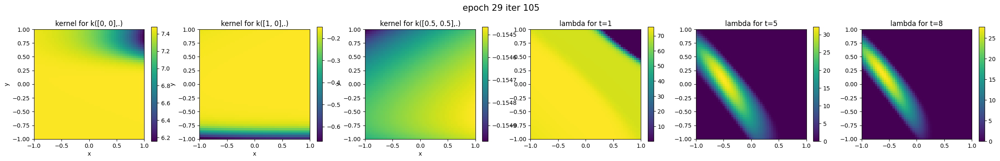

[2026-06-03T00:40:20.440832+00:00] Epoch : 29,	Total loss : -4.68595e+03
[2026-06-03T00:40:33.625446+00:00] Epoch : 30,	iter : 0,	loss : 1.40713e+00
[2026-06-03T00:41:40.062061+00:00] Epoch : 30,	iter : 5,	loss : 2.98479e-01
[2026-06-03T00:42:45.042314+00:00] Epoch : 30,	iter : 10,	loss : 1.61876e+00
[2026-06-03T00:43:49.866382+00:00] Epoch : 30,	iter : 15,	loss : -1.18465e+01
[2026-06-03T00:44:54.170867+00:00] Epoch : 30,	iter : 20,	loss : -7.69132e+00
[2026-06-03T00:45:58.281037+00:00] Epoch : 30,	iter : 25,	loss : -2.53106e-01
[2026-06-03T00:47:03.364956+00:00] Epoch : 30,	iter : 30,	loss : -2.10536e-01
[2026-06-03T00:48:08.923772+00:00] Epoch : 30,	iter : 35,	loss : 2.73588e+00
[2026-06-03T00:49:14.107446+00:00] Epoch : 30,	iter : 40,	loss : 1.37322e+00
[2026-06-03T00:50:22.706694+00:00] Epoch : 30,	iter : 45,	loss : -5.41313e+00
[2026-06-03T00:51:32.156394+00:00] Epoch : 30,	iter : 50,	loss : -1.52632e+01
[2026-06-03T00:52:39.705014+00:00] Epoch : 30,	iter : 55,	loss : 2.11756e+00

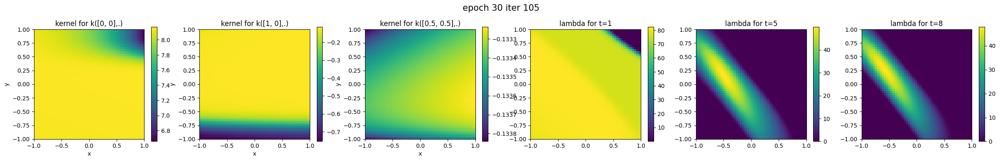

[2026-06-03T01:03:43.259171+00:00] Epoch : 30,	Total loss : -4.87910e+03
[2026-06-03T01:03:55.617575+00:00] Epoch : 31,	iter : 0,	loss : 2.33114e+00
[2026-06-03T01:04:58.262330+00:00] Epoch : 31,	iter : 5,	loss : -1.02242e+01
[2026-06-03T01:06:02.479191+00:00] Epoch : 31,	iter : 10,	loss : -8.59285e+00
[2026-06-03T01:07:05.285342+00:00] Epoch : 31,	iter : 15,	loss : -8.35537e+00
[2026-06-03T01:08:09.405397+00:00] Epoch : 31,	iter : 20,	loss : 2.35408e+00
[2026-06-03T01:09:11.390530+00:00] Epoch : 31,	iter : 25,	loss : 2.06182e+00
[2026-06-03T01:10:15.342218+00:00] Epoch : 31,	iter : 30,	loss : -6.46524e+00
[2026-06-03T01:11:19.550459+00:00] Epoch : 31,	iter : 35,	loss : -4.96600e-01
[2026-06-03T01:12:24.939674+00:00] Epoch : 31,	iter : 40,	loss : 5.90492e-01
[2026-06-03T01:13:29.395012+00:00] Epoch : 31,	iter : 45,	loss : 1.04854e+00
[2026-06-03T01:14:33.157393+00:00] Epoch : 31,	iter : 50,	loss : 1.85402e+00
[2026-06-03T01:15:37.272432+00:00] Epoch : 31,	iter : 55,	loss : -1.17571e+01

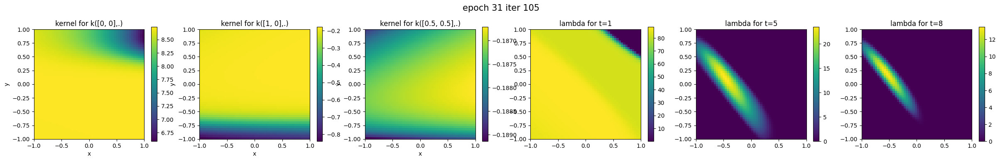

[2026-06-03T01:26:32.371715+00:00] Epoch : 31,	Total loss : -5.17133e+03
[2026-06-03T01:26:44.655676+00:00] Epoch : 32,	iter : 0,	loss : -5.58609e+00
[2026-06-03T01:27:49.523641+00:00] Epoch : 32,	iter : 5,	loss : -6.41198e+00
[2026-06-03T01:28:52.380973+00:00] Epoch : 32,	iter : 10,	loss : -5.88269e+00
[2026-06-03T01:29:59.683954+00:00] Epoch : 32,	iter : 15,	loss : -1.20041e+01
[2026-06-03T01:31:05.371819+00:00] Epoch : 32,	iter : 20,	loss : -1.13398e+00
[2026-06-03T01:32:09.097540+00:00] Epoch : 32,	iter : 25,	loss : -1.07596e+01
[2026-06-03T01:33:14.387412+00:00] Epoch : 32,	iter : 30,	loss : -2.00513e+00
[2026-06-03T01:34:18.979208+00:00] Epoch : 32,	iter : 35,	loss : 2.69060e+00
[2026-06-03T01:35:23.044162+00:00] Epoch : 32,	iter : 40,	loss : -2.64203e+01
[2026-06-03T01:36:26.134880+00:00] Epoch : 32,	iter : 45,	loss : -4.61448e+00
[2026-06-03T01:37:28.811002+00:00] Epoch : 32,	iter : 50,	loss : -1.44702e+00
[2026-06-03T01:38:32.843419+00:00] Epoch : 32,	iter : 55,	loss : -7.3461

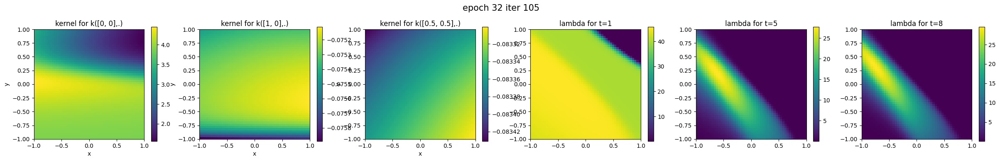

[2026-06-03T01:49:22.137610+00:00] Epoch : 32,	Total loss : -3.94372e+03
[2026-06-03T01:49:34.750212+00:00] Epoch : 33,	iter : 0,	loss : 3.50738e+00
[2026-06-03T01:50:40.239887+00:00] Epoch : 33,	iter : 5,	loss : -1.62118e+00
[2026-06-03T01:51:46.083529+00:00] Epoch : 33,	iter : 10,	loss : 4.07140e+00
[2026-06-03T01:52:52.904673+00:00] Epoch : 33,	iter : 15,	loss : -3.56937e+00
[2026-06-03T01:53:59.904239+00:00] Epoch : 33,	iter : 20,	loss : -3.76093e-01
[2026-06-03T01:55:09.082181+00:00] Epoch : 33,	iter : 25,	loss : -1.20444e+00
[2026-06-03T01:56:15.655228+00:00] Epoch : 33,	iter : 30,	loss : -3.92295e+00
[2026-06-03T01:57:22.206439+00:00] Epoch : 33,	iter : 35,	loss : -8.14050e+01
[2026-06-03T01:58:28.106641+00:00] Epoch : 33,	iter : 40,	loss : -5.65579e+00
[2026-06-03T01:59:33.042707+00:00] Epoch : 33,	iter : 45,	loss : -8.08281e-01
[2026-06-03T02:00:39.855282+00:00] Epoch : 33,	iter : 50,	loss : 1.20416e+00
[2026-06-03T02:01:44.429898+00:00] Epoch : 33,	iter : 55,	loss : -1.76890e

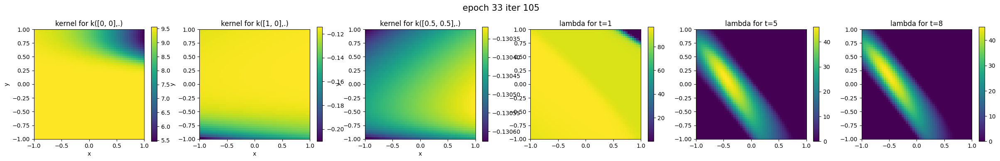

[2026-06-03T02:12:46.050037+00:00] Epoch : 33,	Total loss : -4.69728e+03
[2026-06-03T02:12:58.370240+00:00] Epoch : 34,	iter : 0,	loss : 3.49469e+00
[2026-06-03T02:14:02.441171+00:00] Epoch : 34,	iter : 5,	loss : 1.69771e+00
[2026-06-03T02:15:06.101987+00:00] Epoch : 34,	iter : 10,	loss : -3.51865e+00
[2026-06-03T02:16:09.331100+00:00] Epoch : 34,	iter : 15,	loss : 1.48123e+00
[2026-06-03T02:17:13.261787+00:00] Epoch : 34,	iter : 20,	loss : -7.79149e-01
[2026-06-03T02:18:16.666951+00:00] Epoch : 34,	iter : 25,	loss : 2.23184e-01
[2026-06-03T02:19:18.909416+00:00] Epoch : 34,	iter : 30,	loss : 1.43586e+00
[2026-06-03T02:20:22.291446+00:00] Epoch : 34,	iter : 35,	loss : -1.36290e+01
[2026-06-03T02:21:27.689399+00:00] Epoch : 34,	iter : 40,	loss : -1.51537e+00
[2026-06-03T02:22:32.240252+00:00] Epoch : 34,	iter : 45,	loss : -1.81323e+01
[2026-06-03T02:23:36.532395+00:00] Epoch : 34,	iter : 50,	loss : -4.07348e+02
[2026-06-03T02:24:40.045696+00:00] Epoch : 34,	iter : 55,	loss : 1.53440e+00

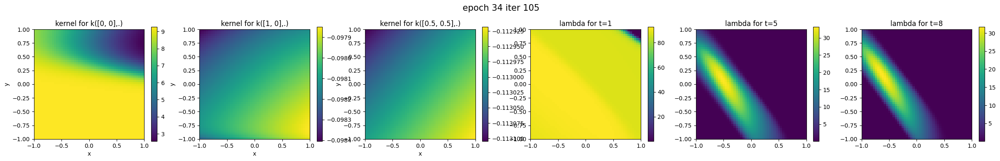

[2026-06-03T02:35:32.327940+00:00] Epoch : 34,	Total loss : -4.50714e+03
[2026-06-03T02:35:44.922386+00:00] Epoch : 35,	iter : 0,	loss : -7.10381e+01
[2026-06-03T02:36:48.003363+00:00] Epoch : 35,	iter : 5,	loss : 1.97793e+00
[2026-06-03T02:37:52.389196+00:00] Epoch : 35,	iter : 10,	loss : 2.12079e+00
[2026-06-03T02:38:57.952986+00:00] Epoch : 35,	iter : 15,	loss : 2.26757e+00
[2026-06-03T02:40:04.162961+00:00] Epoch : 35,	iter : 20,	loss : -9.15951e+00
[2026-06-03T02:41:10.334603+00:00] Epoch : 35,	iter : 25,	loss : 1.74674e+00
[2026-06-03T02:42:14.854140+00:00] Epoch : 35,	iter : 30,	loss : -2.77184e+00
[2026-06-03T02:43:20.875980+00:00] Epoch : 35,	iter : 35,	loss : -2.11337e+00
[2026-06-03T02:44:22.204998+00:00] Epoch : 35,	iter : 40,	loss : 3.03150e+00
[2026-06-03T02:45:24.991729+00:00] Epoch : 35,	iter : 45,	loss : 2.67279e+00
[2026-06-03T02:46:27.256193+00:00] Epoch : 35,	iter : 50,	loss : -5.79567e+00
[2026-06-03T02:47:30.350137+00:00] Epoch : 35,	iter : 55,	loss : 3.23986e+00


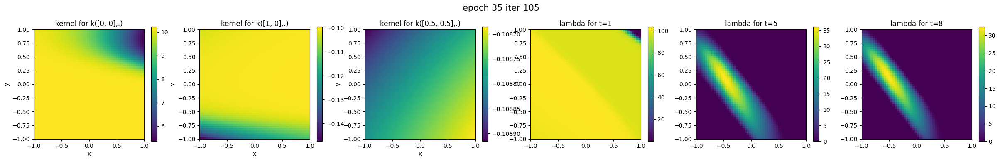

[2026-06-03T02:58:34.392096+00:00] Epoch : 35,	Total loss : -4.92706e+03
[2026-06-03T02:58:46.997724+00:00] Epoch : 36,	iter : 0,	loss : -6.91937e-01
[2026-06-03T02:59:51.892083+00:00] Epoch : 36,	iter : 5,	loss : -7.94117e-01
[2026-06-03T03:00:57.715028+00:00] Epoch : 36,	iter : 10,	loss : -2.05539e+01
[2026-06-03T03:02:04.339574+00:00] Epoch : 36,	iter : 15,	loss : 2.18039e+00
[2026-06-03T03:03:10.506406+00:00] Epoch : 36,	iter : 20,	loss : -4.26690e+02
[2026-06-03T03:04:16.520405+00:00] Epoch : 36,	iter : 25,	loss : -1.88610e+01
[2026-06-03T03:05:22.168447+00:00] Epoch : 36,	iter : 30,	loss : -3.29154e+00
[2026-06-03T03:06:27.462408+00:00] Epoch : 36,	iter : 35,	loss : 2.08597e+00
[2026-06-03T03:07:38.152367+00:00] Epoch : 36,	iter : 40,	loss : 7.68003e-01
[2026-06-03T03:08:48.248034+00:00] Epoch : 36,	iter : 45,	loss : -3.29185e+00
[2026-06-03T03:09:54.551591+00:00] Epoch : 36,	iter : 50,	loss : -3.29527e+00
[2026-06-03T03:11:00.257700+00:00] Epoch : 36,	iter : 55,	loss : 2.63367e+

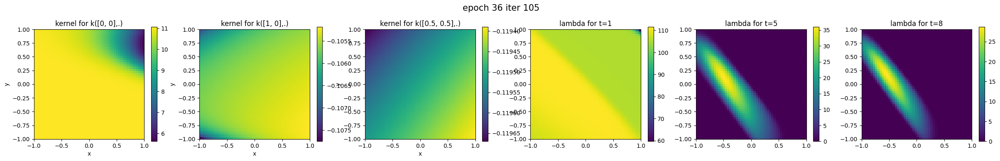

[2026-06-03T03:22:01.527944+00:00] Epoch : 36,	Total loss : -5.38102e+03
[2026-06-03T03:22:13.973614+00:00] Epoch : 37,	iter : 0,	loss : -4.56359e-01
[2026-06-03T03:23:17.154237+00:00] Epoch : 37,	iter : 5,	loss : 1.01649e+00
[2026-06-03T03:24:22.935745+00:00] Epoch : 37,	iter : 10,	loss : 2.27303e+00
[2026-06-03T03:25:26.819336+00:00] Epoch : 37,	iter : 15,	loss : -7.50130e+00
[2026-06-03T03:26:32.866411+00:00] Epoch : 37,	iter : 20,	loss : -3.75318e+00
[2026-06-03T03:27:37.441012+00:00] Epoch : 37,	iter : 25,	loss : 1.06794e+00
[2026-06-03T03:28:40.483479+00:00] Epoch : 37,	iter : 30,	loss : 2.18134e+00
[2026-06-03T03:29:44.436846+00:00] Epoch : 37,	iter : 35,	loss : 3.28341e+00
[2026-06-03T03:30:48.587991+00:00] Epoch : 37,	iter : 40,	loss : 1.36487e+00
[2026-06-03T03:31:51.630892+00:00] Epoch : 37,	iter : 45,	loss : -1.88170e+00
[2026-06-03T03:32:54.746946+00:00] Epoch : 37,	iter : 50,	loss : 1.40676e+00
[2026-06-03T03:33:59.188247+00:00] Epoch : 37,	iter : 55,	loss : -1.15770e+01


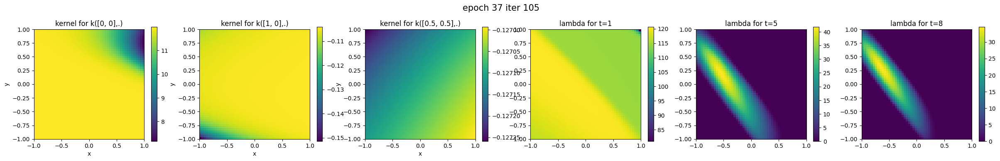

[2026-06-03T03:44:57.895399+00:00] Epoch : 37,	Total loss : -5.67057e+03
[2026-06-03T03:45:10.836596+00:00] Epoch : 38,	iter : 0,	loss : 6.45995e-01
[2026-06-03T03:46:16.191583+00:00] Epoch : 38,	iter : 5,	loss : -1.50234e+01
[2026-06-03T03:47:20.389816+00:00] Epoch : 38,	iter : 10,	loss : -1.81270e+01
[2026-06-03T03:48:24.803076+00:00] Epoch : 38,	iter : 15,	loss : -4.37980e+00
[2026-06-03T03:49:28.969806+00:00] Epoch : 38,	iter : 20,	loss : -1.11469e+01
[2026-06-03T03:50:33.858929+00:00] Epoch : 38,	iter : 25,	loss : -1.31058e+00
[2026-06-03T03:51:39.271429+00:00] Epoch : 38,	iter : 30,	loss : 6.84989e-01
[2026-06-03T03:52:42.759906+00:00] Epoch : 38,	iter : 35,	loss : -4.09923e-02
[2026-06-03T03:53:48.645376+00:00] Epoch : 38,	iter : 40,	loss : 1.13964e-01
[2026-06-03T03:54:53.720598+00:00] Epoch : 38,	iter : 45,	loss : 1.00514e+00
[2026-06-03T03:55:57.675771+00:00] Epoch : 38,	iter : 50,	loss : -1.59648e+01
[2026-06-03T03:57:00.445929+00:00] Epoch : 38,	iter : 55,	loss : 1.22849e+0

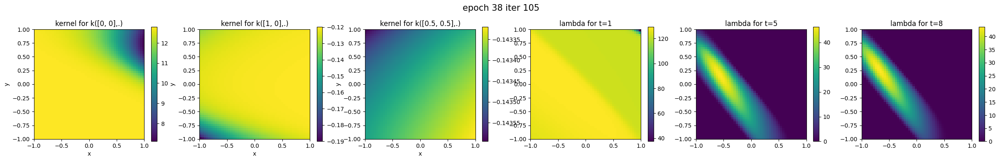

[2026-06-03T04:08:15.461454+00:00] Epoch : 38,	Total loss : -6.08805e+03
[2026-06-03T04:08:28.663101+00:00] Epoch : 39,	iter : 0,	loss : 1.86883e+00
[2026-06-03T04:09:34.866870+00:00] Epoch : 39,	iter : 5,	loss : -6.18764e+00
[2026-06-03T04:10:40.870242+00:00] Epoch : 39,	iter : 10,	loss : -6.21044e+00
[2026-06-03T04:11:48.114158+00:00] Epoch : 39,	iter : 15,	loss : -5.51837e+00
[2026-06-03T04:12:53.983997+00:00] Epoch : 39,	iter : 20,	loss : -1.01896e+01
[2026-06-03T04:13:58.965230+00:00] Epoch : 39,	iter : 25,	loss : 5.57065e-01
[2026-06-03T04:15:02.646278+00:00] Epoch : 39,	iter : 30,	loss : -3.71105e+00
[2026-06-03T04:16:08.275406+00:00] Epoch : 39,	iter : 35,	loss : -3.28403e+00
[2026-06-03T04:17:13.507143+00:00] Epoch : 39,	iter : 40,	loss : -2.67136e+00
[2026-06-03T04:18:19.061922+00:00] Epoch : 39,	iter : 45,	loss : -9.64068e+01
[2026-06-03T04:19:23.252857+00:00] Epoch : 39,	iter : 50,	loss : -3.84963e+00
[2026-06-03T04:20:27.146826+00:00] Epoch : 39,	iter : 55,	loss : 1.13183e

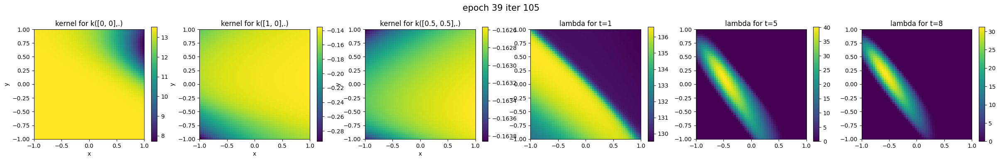

[2026-06-03T04:31:30.278906+00:00] Epoch : 39,	Total loss : -6.22135e+03
[2026-06-03T04:31:43.368971+00:00] Epoch : 40,	iter : 0,	loss : -2.37620e+01
[2026-06-03T04:32:48.317905+00:00] Epoch : 40,	iter : 5,	loss : -1.23638e+00
[2026-06-03T04:33:51.845397+00:00] Epoch : 40,	iter : 10,	loss : -1.11632e+01
[2026-06-03T04:34:54.774274+00:00] Epoch : 40,	iter : 15,	loss : 2.20361e-01
[2026-06-03T04:35:58.741277+00:00] Epoch : 40,	iter : 20,	loss : -1.01646e+01
[2026-06-03T04:37:02.961438+00:00] Epoch : 40,	iter : 25,	loss : -1.47701e+01
[2026-06-03T04:38:10.051924+00:00] Epoch : 40,	iter : 30,	loss : -2.47719e+01
[2026-06-03T04:39:21.882633+00:00] Epoch : 40,	iter : 35,	loss : -7.11817e-01
[2026-06-03T04:40:32.032524+00:00] Epoch : 40,	iter : 40,	loss : 5.97036e-01
[2026-06-03T04:41:46.026026+00:00] Epoch : 40,	iter : 45,	loss : -1.29986e+00
[2026-06-03T04:42:51.614662+00:00] Epoch : 40,	iter : 50,	loss : 2.99813e+00
[2026-06-03T04:43:57.715363+00:00] Epoch : 40,	iter : 55,	loss : 5.30684e-

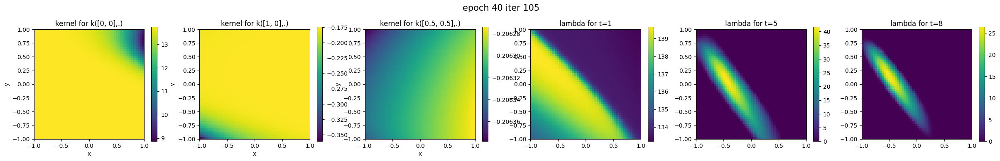

[2026-06-03T04:55:24.221162+00:00] Epoch : 40,	Total loss : -5.94372e+03
[2026-06-03T04:55:36.937369+00:00] Epoch : 41,	iter : 0,	loss : -5.31192e+00
[2026-06-03T04:56:39.653965+00:00] Epoch : 41,	iter : 5,	loss : -7.74205e+00
[2026-06-03T04:57:45.044424+00:00] Epoch : 41,	iter : 10,	loss : -2.73388e+00
[2026-06-03T04:58:51.583042+00:00] Epoch : 41,	iter : 15,	loss : 1.78978e+00
[2026-06-03T04:59:57.361532+00:00] Epoch : 41,	iter : 20,	loss : -1.93364e+00
[2026-06-03T05:01:02.860397+00:00] Epoch : 41,	iter : 25,	loss : -5.40603e+00
[2026-06-03T05:02:08.811424+00:00] Epoch : 41,	iter : 30,	loss : -3.37378e+00
[2026-06-03T05:03:14.840939+00:00] Epoch : 41,	iter : 35,	loss : -3.17086e+01
[2026-06-03T05:04:20.903072+00:00] Epoch : 41,	iter : 40,	loss : -2.85642e+01
[2026-06-03T05:05:27.643720+00:00] Epoch : 41,	iter : 45,	loss : -1.24669e+01
[2026-06-03T05:06:33.074165+00:00] Epoch : 41,	iter : 50,	loss : 1.28391e+00
[2026-06-03T05:07:39.337775+00:00] Epoch : 41,	iter : 55,	loss : 9.55673e

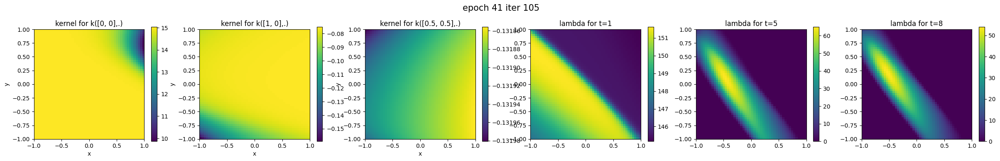

[2026-06-03T05:18:51.761902+00:00] Epoch : 41,	Total loss : -6.74446e+03
[2026-06-03T05:19:04.791208+00:00] Epoch : 42,	iter : 0,	loss : 4.50618e-01
[2026-06-03T05:20:12.154309+00:00] Epoch : 42,	iter : 5,	loss : -1.45928e-01
[2026-06-03T05:21:17.382140+00:00] Epoch : 42,	iter : 10,	loss : -2.07775e-01
[2026-06-03T05:22:21.472795+00:00] Epoch : 42,	iter : 15,	loss : -1.14837e+01
[2026-06-03T05:23:24.962174+00:00] Epoch : 42,	iter : 20,	loss : -4.41237e+00
[2026-06-03T05:24:29.828473+00:00] Epoch : 42,	iter : 25,	loss : -6.69553e+00
[2026-06-03T05:25:34.666694+00:00] Epoch : 42,	iter : 30,	loss : -1.21226e+01
[2026-06-03T05:26:39.743595+00:00] Epoch : 42,	iter : 35,	loss : -9.93619e+00
[2026-06-03T05:27:44.767626+00:00] Epoch : 42,	iter : 40,	loss : -7.29727e+00
[2026-06-03T05:28:50.321807+00:00] Epoch : 42,	iter : 45,	loss : -1.61671e+01
[2026-06-03T05:29:54.802357+00:00] Epoch : 42,	iter : 50,	loss : 1.50889e+00
[2026-06-03T05:31:00.023414+00:00] Epoch : 42,	iter : 55,	loss : -2.87269

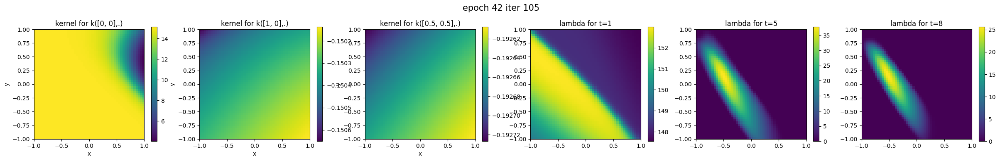

[2026-06-03T05:42:15.036242+00:00] Epoch : 42,	Total loss : -5.89022e+03
[2026-06-03T05:42:27.748162+00:00] Epoch : 43,	iter : 0,	loss : 1.55086e-01
[2026-06-03T05:43:33.960579+00:00] Epoch : 43,	iter : 5,	loss : 2.23803e+00
[2026-06-03T05:44:40.603437+00:00] Epoch : 43,	iter : 10,	loss : -6.25338e+00
[2026-06-03T05:45:47.196208+00:00] Epoch : 43,	iter : 15,	loss : -4.60608e-01
[2026-06-03T05:46:54.520589+00:00] Epoch : 43,	iter : 20,	loss : -2.60797e+00
[2026-06-03T05:48:00.714510+00:00] Epoch : 43,	iter : 25,	loss : -2.34167e+00
[2026-06-03T05:49:05.899693+00:00] Epoch : 43,	iter : 30,	loss : -1.76910e+00
[2026-06-03T05:50:11.649468+00:00] Epoch : 43,	iter : 35,	loss : 6.08800e-01
[2026-06-03T05:51:18.183652+00:00] Epoch : 43,	iter : 40,	loss : -2.72350e+00
[2026-06-03T05:52:26.403126+00:00] Epoch : 43,	iter : 45,	loss : -7.28003e+00
[2026-06-03T05:53:32.995246+00:00] Epoch : 43,	iter : 50,	loss : -1.22843e+01
[2026-06-03T05:54:38.794626+00:00] Epoch : 43,	iter : 55,	loss : -4.68957e

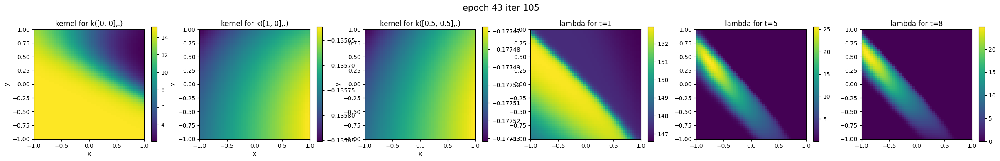

[2026-06-03T06:05:54.396346+00:00] Epoch : 43,	Total loss : -5.91089e+03
[2026-06-03T06:06:07.383244+00:00] Epoch : 44,	iter : 0,	loss : -3.48955e+00
[2026-06-03T06:07:14.086543+00:00] Epoch : 44,	iter : 5,	loss : -7.25952e+00
[2026-06-03T06:08:21.506457+00:00] Epoch : 44,	iter : 10,	loss : 1.86752e+00
[2026-06-03T06:09:28.217853+00:00] Epoch : 44,	iter : 15,	loss : -2.24646e+01
[2026-06-03T06:10:36.682385+00:00] Epoch : 44,	iter : 20,	loss : -2.85421e+00
[2026-06-03T06:11:44.339766+00:00] Epoch : 44,	iter : 25,	loss : -4.68890e+02
[2026-06-03T06:12:52.396505+00:00] Epoch : 44,	iter : 30,	loss : -1.32879e+01
[2026-06-03T06:13:58.103764+00:00] Epoch : 44,	iter : 35,	loss : -4.57366e+00
[2026-06-03T06:15:03.840178+00:00] Epoch : 44,	iter : 40,	loss : -1.25966e+00
[2026-06-03T06:16:09.979695+00:00] Epoch : 44,	iter : 45,	loss : -8.69151e-02
[2026-06-03T06:17:17.497606+00:00] Epoch : 44,	iter : 50,	loss : -3.01709e-01
[2026-06-03T06:18:22.940617+00:00] Epoch : 44,	iter : 55,	loss : -2.6528

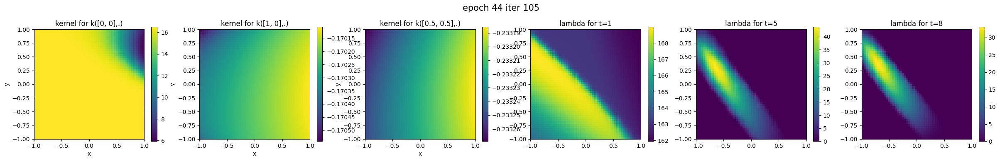

[2026-06-03T06:29:49.545484+00:00] Epoch : 44,	Total loss : -6.47790e+03
[2026-06-03T06:30:02.215780+00:00] Epoch : 45,	iter : 0,	loss : -4.57994e+00
[2026-06-03T06:31:06.948629+00:00] Epoch : 45,	iter : 5,	loss : 9.29489e-03
[2026-06-03T06:32:12.381312+00:00] Epoch : 45,	iter : 10,	loss : 1.82725e+00
[2026-06-03T06:33:17.287465+00:00] Epoch : 45,	iter : 15,	loss : -9.83628e+00
[2026-06-03T06:34:22.508349+00:00] Epoch : 45,	iter : 20,	loss : -5.32428e+00
[2026-06-03T06:35:28.016803+00:00] Epoch : 45,	iter : 25,	loss : -3.02211e+00
[2026-06-03T06:36:34.193304+00:00] Epoch : 45,	iter : 30,	loss : -5.65567e+00
[2026-06-03T06:37:40.204682+00:00] Epoch : 45,	iter : 35,	loss : -2.08538e+01
[2026-06-03T06:38:47.023455+00:00] Epoch : 45,	iter : 40,	loss : 2.14170e+00
[2026-06-03T06:39:54.065394+00:00] Epoch : 45,	iter : 45,	loss : -1.21153e+00
[2026-06-03T06:41:01.069929+00:00] Epoch : 45,	iter : 50,	loss : -5.65427e+00
[2026-06-03T06:42:06.806683+00:00] Epoch : 45,	iter : 55,	loss : -7.11081e

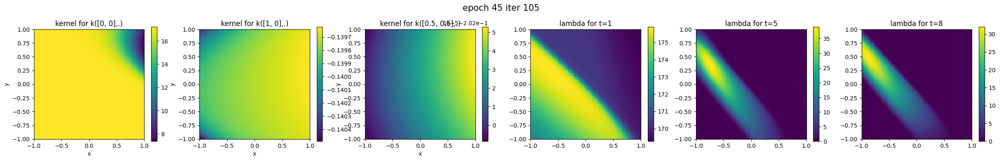

[2026-06-03T06:53:22.649377+00:00] Epoch : 45,	Total loss : -7.02662e+03
[2026-06-03T06:53:35.729085+00:00] Epoch : 46,	iter : 0,	loss : -7.94133e+00
[2026-06-03T06:54:39.665823+00:00] Epoch : 46,	iter : 5,	loss : -4.20701e+01
[2026-06-03T06:55:44.060430+00:00] Epoch : 46,	iter : 10,	loss : -4.64864e+00
[2026-06-03T06:56:49.105675+00:00] Epoch : 46,	iter : 15,	loss : -6.60731e-01
[2026-06-03T06:57:54.506840+00:00] Epoch : 46,	iter : 20,	loss : 4.29823e-01
[2026-06-03T06:58:59.361590+00:00] Epoch : 46,	iter : 25,	loss : -2.18479e+01
[2026-06-03T07:00:05.128618+00:00] Epoch : 46,	iter : 30,	loss : -2.17321e+01
[2026-06-03T07:01:12.442134+00:00] Epoch : 46,	iter : 35,	loss : 7.60123e-01
[2026-06-03T07:02:17.263533+00:00] Epoch : 46,	iter : 40,	loss : -9.72878e-02
[2026-06-03T07:03:20.650656+00:00] Epoch : 46,	iter : 45,	loss : -9.87083e+00
[2026-06-03T07:04:24.371735+00:00] Epoch : 46,	iter : 50,	loss : -2.07365e+00
[2026-06-03T07:05:28.929997+00:00] Epoch : 46,	iter : 55,	loss : -2.41050

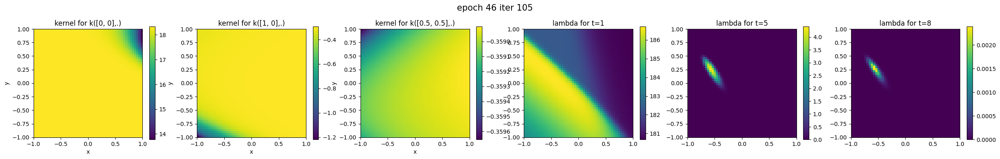

[2026-06-03T07:16:25.645270+00:00] Epoch : 46,	Total loss : -7.21883e+03
[2026-06-03T07:16:38.524474+00:00] Epoch : 47,	iter : 0,	loss : 1.89520e+00
[2026-06-03T07:17:42.414652+00:00] Epoch : 47,	iter : 5,	loss : 2.41238e+00
[2026-06-03T07:18:45.086420+00:00] Epoch : 47,	iter : 10,	loss : -3.90899e+00
[2026-06-03T07:19:49.012798+00:00] Epoch : 47,	iter : 15,	loss : 5.27384e+00
[2026-06-03T07:20:53.401097+00:00] Epoch : 47,	iter : 20,	loss : 4.67234e-01
[2026-06-03T07:21:59.844035+00:00] Epoch : 47,	iter : 25,	loss : 9.05507e-01
[2026-06-03T07:23:04.116615+00:00] Epoch : 47,	iter : 30,	loss : 3.18035e+00
[2026-06-03T07:24:06.810956+00:00] Epoch : 47,	iter : 35,	loss : -6.94762e+00
[2026-06-03T07:25:10.082261+00:00] Epoch : 47,	iter : 40,	loss : 3.09855e-01
[2026-06-03T07:26:13.466358+00:00] Epoch : 47,	iter : 45,	loss : -2.23276e+01
[2026-06-03T07:27:18.213758+00:00] Epoch : 47,	iter : 50,	loss : 2.81787e+00
[2026-06-03T07:28:20.497175+00:00] Epoch : 47,	iter : 55,	loss : -1.03918e+01
[

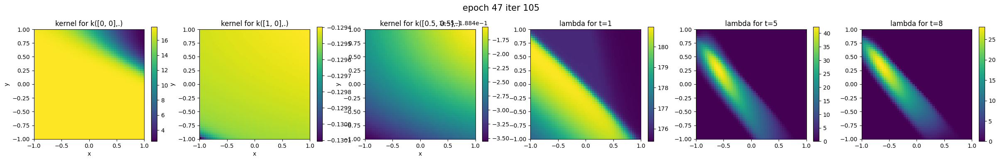

[2026-06-03T07:39:11.575526+00:00] Epoch : 47,	Total loss : -4.81859e+03
[2026-06-03T07:39:24.016782+00:00] Epoch : 48,	iter : 0,	loss : -7.46233e+00
[2026-06-03T07:40:26.779358+00:00] Epoch : 48,	iter : 5,	loss : -3.70700e+00
[2026-06-03T07:41:31.028695+00:00] Epoch : 48,	iter : 10,	loss : 1.25861e+00
[2026-06-03T07:42:33.834567+00:00] Epoch : 48,	iter : 15,	loss : -5.46740e+00
[2026-06-03T07:43:38.004438+00:00] Epoch : 48,	iter : 20,	loss : -9.54599e+00
[2026-06-03T07:44:41.499844+00:00] Epoch : 48,	iter : 25,	loss : -8.48979e+00
[2026-06-03T07:45:44.343632+00:00] Epoch : 48,	iter : 30,	loss : 4.49048e-01
[2026-06-03T07:46:46.848833+00:00] Epoch : 48,	iter : 35,	loss : -1.47837e+00
[2026-06-03T07:47:52.119184+00:00] Epoch : 48,	iter : 40,	loss : -6.42120e-01
[2026-06-03T07:48:57.681283+00:00] Epoch : 48,	iter : 45,	loss : -2.61439e+01
[2026-06-03T07:50:03.017554+00:00] Epoch : 48,	iter : 50,	loss : -2.76000e+00
[2026-06-03T07:51:05.619516+00:00] Epoch : 48,	iter : 55,	loss : -1.58831

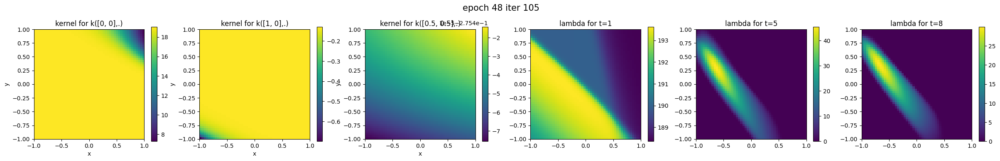

[2026-06-03T08:01:52.975040+00:00] Epoch : 48,	Total loss : -7.60785e+03
[2026-06-03T08:02:05.533010+00:00] Epoch : 49,	iter : 0,	loss : -5.13847e+00
[2026-06-03T08:03:09.162391+00:00] Epoch : 49,	iter : 5,	loss : -1.69255e+00
[2026-06-03T08:04:11.742636+00:00] Epoch : 49,	iter : 10,	loss : -2.81302e+01
[2026-06-03T08:05:17.129070+00:00] Epoch : 49,	iter : 15,	loss : -1.43496e+01
[2026-06-03T08:06:22.462687+00:00] Epoch : 49,	iter : 20,	loss : -2.76496e+01
[2026-06-03T08:07:26.918075+00:00] Epoch : 49,	iter : 25,	loss : 1.93864e+00
[2026-06-03T08:08:29.070384+00:00] Epoch : 49,	iter : 30,	loss : -4.68221e+01
[2026-06-03T08:09:32.527649+00:00] Epoch : 49,	iter : 35,	loss : -5.82502e+00
[2026-06-03T08:10:35.617174+00:00] Epoch : 49,	iter : 40,	loss : -5.47458e+00
[2026-06-03T08:11:39.513864+00:00] Epoch : 49,	iter : 45,	loss : -9.09230e+00
[2026-06-03T08:12:42.554083+00:00] Epoch : 49,	iter : 50,	loss : -9.29079e+00
[2026-06-03T08:13:47.417369+00:00] Epoch : 49,	iter : 55,	loss : -9.9272

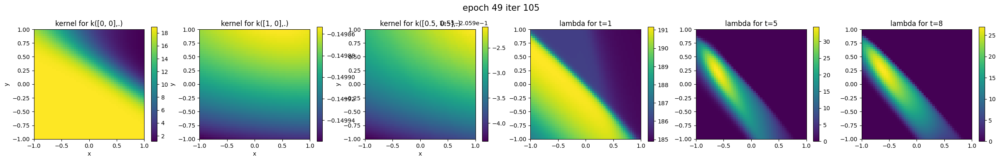

[2026-06-03T08:24:55.576478+00:00] Epoch : 49,	Total loss : -5.74260e+03
NSMPP total log-likelihood : 14433.6474609375


In [10]:
seed = 5
torch.random.manual_seed(seed)

# Training configurations
batch_size = 8
num_epochs = 50
lr         = 1e-2
modelname  = "nsmpp_db_real-%d" % seed

# Model configurations
T          = (0., 10.)
S          = ((-1, 1), (-1, 1))
data_dim   = 3
int_res    = 5

# Define point process model
#trg_model  = SpatioTemporalDeepBasisPointProcess(
#    T=T, S=S,
#    n_basis=5, basis_dim=7, data_dim=data_dim,
#    numerical_int=True, int_res=int_res,
    # init_gain=3.5e+0, init_bias=-7e-1,
#    init_gain=3e+0, init_bias=-1e-1,
#    nn_width=5, beta=1)
#torch.save(trg_model.state_dict(), "%s/saved_models/%s-%d.pth" % (rootpath, "spatiotemporal-deepnnbasis_target_model", seed))
#trg_model.load_state_dict(torch.load("%s/saved_models/%s-%d.pth" % (rootpath, "spatiotemporal-deepnnbasis_target_model", seed)))

init_model = DeepBasisPointProcess(
    T=T, S=S, mu=1.,
    n_basis=5, basis_dim=7, data_dim=data_dim,
    numerical_int=True, int_res=int_res,
    nn_width=10)
# init_model.load_state_dict(torch.load("%s/saved_models/%s.pth" % (rootpath, modelname)))
print("Number of parameters:",
      sum(p.numel() for p in init_model.parameters()))

# visualize the target model
#plot_fitted_2D_model(trg_model, test_seq,
#                     ss=[[0, 0], [1, 0], [-0.5, 0.5]],
#                     ts=[10, 50, 80],
#                     S=S, ngrid=50, filename="Target Model")
plot_fitted_2D_model(init_model, test_seq,
                     ss=[[0, 0], [1, 0], [0.5, 0.5]],
                     ts=[1, 5, 8],
                     S=S, ngrid=50, filename="Initialized Model")

# Training
train(init_model, train_loader, trg_model=None, S=S, ngrid=50, test_data=test_seq,
      modelname=modelname, num_epochs=num_epochs, lr=lr, print_iter=5)

# Log-likelihood evaluation
def evaluate_loglik_nspp(model, data):
    model.eval()
    with torch.no_grad():
        _, loglik = model(data)   # [N_seq]
        total_loglik = loglik.sum().item()
        n_events = (data[..., 0] > 0).sum().item()
        ll_per_event = total_loglik / n_events
    return total_loglik, ll_per_event, n_events

total_ll_db, ll_per_ev_db, n_ev_db = evaluate_loglik_nspp(init_model, data)
print("NSMPP total log-likelihood :", total_ll_db)

In [ ]:
init_model._mu

Number of parameters: 3277


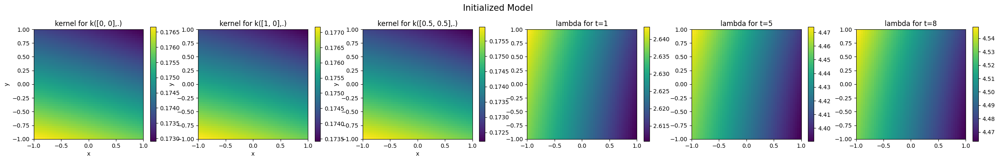

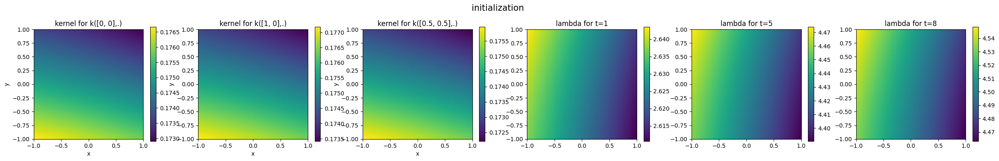

[2026-06-03T14:08:15.790433+00:00] Epoch : 0,	iter : 0,	loss : 1.26261e+01
[2026-06-03T14:09:21.552110+00:00] Epoch : 0,	iter : 5,	loss : 1.03618e+01
[2026-06-03T14:10:27.925448+00:00] Epoch : 0,	iter : 10,	loss : 1.30186e+01
[2026-06-03T14:11:33.396869+00:00] Epoch : 0,	iter : 15,	loss : 1.26360e+01
[2026-06-03T14:12:38.775771+00:00] Epoch : 0,	iter : 20,	loss : 1.02149e+01
[2026-06-03T14:13:43.694021+00:00] Epoch : 0,	iter : 25,	loss : 9.00140e+00
[2026-06-03T14:14:47.300031+00:00] Epoch : 0,	iter : 30,	loss : 9.05961e+00
[2026-06-03T14:15:51.689959+00:00] Epoch : 0,	iter : 35,	loss : 9.75889e+00
[2026-06-03T14:16:55.154177+00:00] Epoch : 0,	iter : 40,	loss : 9.91219e+00
[2026-06-03T14:17:57.168194+00:00] Epoch : 0,	iter : 45,	loss : 9.77672e+00
[2026-06-03T14:18:59.724027+00:00] Epoch : 0,	iter : 50,	loss : 9.38727e+00
[2026-06-03T14:20:03.034126+00:00] Epoch : 0,	iter : 55,	loss : 9.08112e+00
[2026-06-03T14:21:06.473260+00:00] Epoch : 0,	iter : 60,	loss : 8.94491e+00
[2026-06-03T14

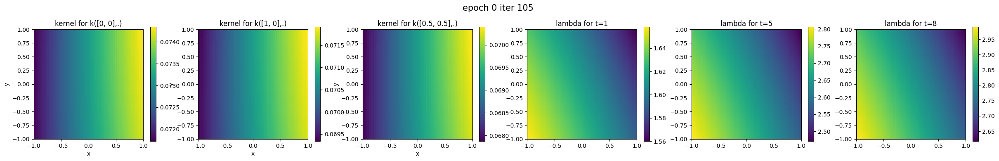

[2026-06-03T14:30:38.851223+00:00] Epoch : 0,	Total loss : 9.22965e+03
[2026-06-03T14:30:51.118809+00:00] Epoch : 1,	iter : 0,	loss : 9.70445e+00
[2026-06-03T14:31:53.275961+00:00] Epoch : 1,	iter : 5,	loss : 1.04467e+01
[2026-06-03T14:32:55.952298+00:00] Epoch : 1,	iter : 10,	loss : 1.00661e+01
[2026-06-03T14:33:57.682159+00:00] Epoch : 1,	iter : 15,	loss : 9.93978e+00
[2026-06-03T14:34:58.766210+00:00] Epoch : 1,	iter : 20,	loss : 9.29897e+00
[2026-06-03T14:36:01.422899+00:00] Epoch : 1,	iter : 25,	loss : 8.90406e+00
[2026-06-03T14:37:03.139356+00:00] Epoch : 1,	iter : 30,	loss : 8.82851e+00
[2026-06-03T14:38:05.063826+00:00] Epoch : 1,	iter : 35,	loss : 8.64966e+00
[2026-06-03T14:39:07.131826+00:00] Epoch : 1,	iter : 40,	loss : 8.39745e+00
[2026-06-03T14:40:09.223940+00:00] Epoch : 1,	iter : 45,	loss : 7.97764e+00
[2026-06-03T14:41:11.084032+00:00] Epoch : 1,	iter : 50,	loss : 8.01167e+00
[2026-06-03T14:42:12.358935+00:00] Epoch : 1,	iter : 55,	loss : 7.86288e+00
[2026-06-03T14:43:1

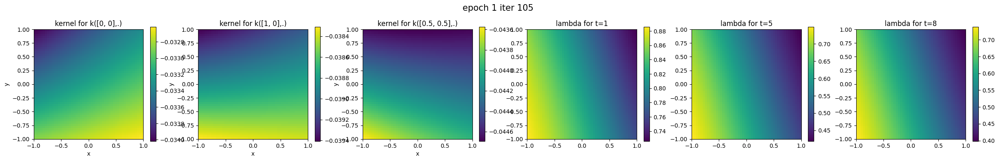

[2026-06-03T14:52:52.977070+00:00] Epoch : 1,	Total loss : 2.97005e+03
[2026-06-03T14:53:05.491249+00:00] Epoch : 2,	iter : 0,	loss : 6.80638e+01
[2026-06-03T14:54:08.147456+00:00] Epoch : 2,	iter : 5,	loss : 1.20698e+01
[2026-06-03T14:55:11.033956+00:00] Epoch : 2,	iter : 10,	loss : 1.18316e+01
[2026-06-03T14:56:14.781779+00:00] Epoch : 2,	iter : 15,	loss : 1.24960e+01
[2026-06-03T14:57:17.990993+00:00] Epoch : 2,	iter : 20,	loss : 9.63326e+00
[2026-06-03T14:58:20.913439+00:00] Epoch : 2,	iter : 25,	loss : 8.79412e+00
[2026-06-03T14:59:22.854974+00:00] Epoch : 2,	iter : 30,	loss : 8.06848e+00
[2026-06-03T15:00:28.342461+00:00] Epoch : 2,	iter : 35,	loss : 7.80901e+00
[2026-06-03T15:01:32.033573+00:00] Epoch : 2,	iter : 40,	loss : 7.80144e+00
[2026-06-03T15:02:34.244240+00:00] Epoch : 2,	iter : 45,	loss : 7.55423e+00
[2026-06-03T15:03:35.110763+00:00] Epoch : 2,	iter : 50,	loss : 7.64355e+00
[2026-06-03T15:04:37.296927+00:00] Epoch : 2,	iter : 55,	loss : 7.50964e+00
[2026-06-03T15:05:3

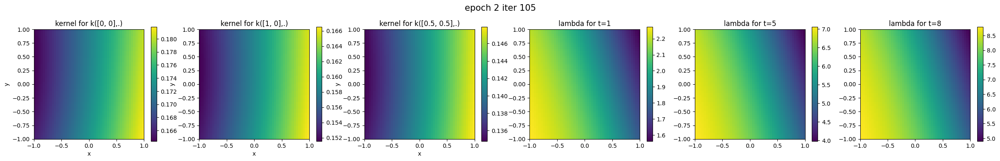

[2026-06-03T15:15:06.599725+00:00] Epoch : 2,	Total loss : 5.71650e+03
[2026-06-03T15:15:18.670978+00:00] Epoch : 3,	iter : 0,	loss : 1.41478e+01
[2026-06-03T15:16:20.750994+00:00] Epoch : 3,	iter : 5,	loss : 9.65106e+00
[2026-06-03T15:17:22.737084+00:00] Epoch : 3,	iter : 10,	loss : 1.08896e+01
[2026-06-03T15:18:26.571096+00:00] Epoch : 3,	iter : 15,	loss : 1.02028e+01
[2026-06-03T15:19:29.081289+00:00] Epoch : 3,	iter : 20,	loss : 9.66630e+00
[2026-06-03T15:20:31.201852+00:00] Epoch : 3,	iter : 25,	loss : 8.91602e+00
[2026-06-03T15:21:32.872315+00:00] Epoch : 3,	iter : 30,	loss : 8.06140e+00
[2026-06-03T15:22:35.622383+00:00] Epoch : 3,	iter : 35,	loss : 8.50290e+00
[2026-06-03T15:23:38.131815+00:00] Epoch : 3,	iter : 40,	loss : 8.57670e+00
[2026-06-03T15:24:39.432263+00:00] Epoch : 3,	iter : 45,	loss : 8.30621e+00
[2026-06-03T15:25:41.670446+00:00] Epoch : 3,	iter : 50,	loss : 7.02886e+00
[2026-06-03T15:26:43.638162+00:00] Epoch : 3,	iter : 55,	loss : 5.52296e+00
[2026-06-03T15:27:4

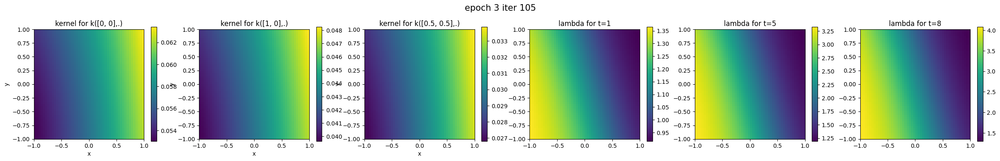

[2026-06-03T15:37:20.000665+00:00] Epoch : 3,	Total loss : 2.64549e+03
[2026-06-03T15:37:31.922221+00:00] Epoch : 4,	iter : 0,	loss : -3.06751e+01
[2026-06-03T15:38:34.586081+00:00] Epoch : 4,	iter : 5,	loss : 7.65941e+00
[2026-06-03T15:39:37.571217+00:00] Epoch : 4,	iter : 10,	loss : 8.02618e+00
[2026-06-03T15:40:40.897000+00:00] Epoch : 4,	iter : 15,	loss : 7.77947e+00
[2026-06-03T15:41:42.705008+00:00] Epoch : 4,	iter : 20,	loss : 7.56896e+00
[2026-06-03T15:42:44.527370+00:00] Epoch : 4,	iter : 25,	loss : 7.49654e+00
[2026-06-03T15:43:47.453930+00:00] Epoch : 4,	iter : 30,	loss : 7.64010e+00
[2026-06-03T15:44:50.015952+00:00] Epoch : 4,	iter : 35,	loss : 7.70041e+00
[2026-06-03T15:45:51.789721+00:00] Epoch : 4,	iter : 40,	loss : 7.42228e+00
[2026-06-03T15:46:53.011520+00:00] Epoch : 4,	iter : 45,	loss : 7.79622e+00
[2026-06-03T15:47:55.447176+00:00] Epoch : 4,	iter : 50,	loss : 6.94537e+00
[2026-06-03T15:48:56.723519+00:00] Epoch : 4,	iter : 55,	loss : 7.46803e+00
[2026-06-03T15:49:

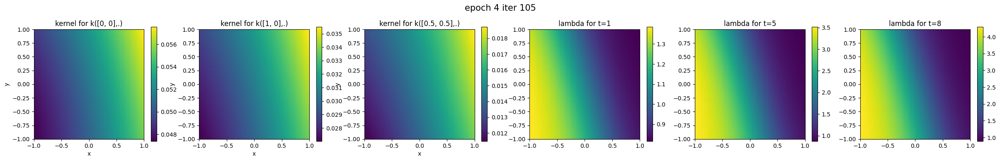

[2026-06-03T15:59:33.902743+00:00] Epoch : 4,	Total loss : 2.03979e+03
[2026-06-03T15:59:46.353983+00:00] Epoch : 5,	iter : 0,	loss : 7.49302e+00
[2026-06-03T16:00:48.865804+00:00] Epoch : 5,	iter : 5,	loss : 7.47261e+00
[2026-06-03T16:01:51.185327+00:00] Epoch : 5,	iter : 10,	loss : 7.60452e+00
[2026-06-03T16:02:54.010835+00:00] Epoch : 5,	iter : 15,	loss : 7.33771e+00
[2026-06-03T16:03:55.952569+00:00] Epoch : 5,	iter : 20,	loss : 6.85197e+00
[2026-06-03T16:04:58.414264+00:00] Epoch : 5,	iter : 25,	loss : 7.43704e+00
[2026-06-03T16:06:01.995642+00:00] Epoch : 5,	iter : 30,	loss : 7.25129e+00
[2026-06-03T16:07:03.913498+00:00] Epoch : 5,	iter : 35,	loss : 7.47100e+00
[2026-06-03T16:08:06.232102+00:00] Epoch : 5,	iter : 40,	loss : 7.19475e+00
[2026-06-03T16:09:09.061450+00:00] Epoch : 5,	iter : 45,	loss : 7.34180e+00
[2026-06-03T16:10:12.129398+00:00] Epoch : 5,	iter : 50,	loss : -1.74814e+02
[2026-06-03T16:11:13.971712+00:00] Epoch : 5,	iter : 55,	loss : 7.42234e+00
[2026-06-03T16:12:

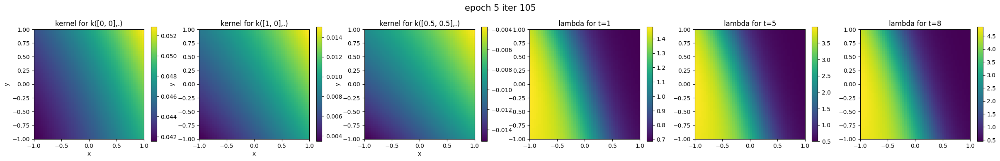

[2026-06-03T16:21:49.713655+00:00] Epoch : 5,	Total loss : 1.75104e+03
[2026-06-03T16:22:02.095490+00:00] Epoch : 6,	iter : 0,	loss : 7.14666e+00
[2026-06-03T16:23:04.832104+00:00] Epoch : 6,	iter : 5,	loss : 7.26674e+00
[2026-06-03T16:24:07.793886+00:00] Epoch : 6,	iter : 10,	loss : 7.05197e+00
[2026-06-03T16:25:10.431743+00:00] Epoch : 6,	iter : 15,	loss : 7.00874e+00
[2026-06-03T16:26:12.860907+00:00] Epoch : 6,	iter : 20,	loss : 7.03793e+00
[2026-06-03T16:27:13.223497+00:00] Epoch : 6,	iter : 25,	loss : 7.18129e+00
[2026-06-03T16:28:15.306020+00:00] Epoch : 6,	iter : 30,	loss : 7.23011e+00
[2026-06-03T16:29:16.647275+00:00] Epoch : 6,	iter : 35,	loss : 7.21384e+00
[2026-06-03T16:30:17.760430+00:00] Epoch : 6,	iter : 40,	loss : 6.81992e+00
[2026-06-03T16:31:19.868366+00:00] Epoch : 6,	iter : 45,	loss : 5.85759e+00
[2026-06-03T16:32:23.655983+00:00] Epoch : 6,	iter : 50,	loss : 7.00448e+00
[2026-06-03T16:33:26.005946+00:00] Epoch : 6,	iter : 55,	loss : 7.12554e+00
[2026-06-03T16:34:2

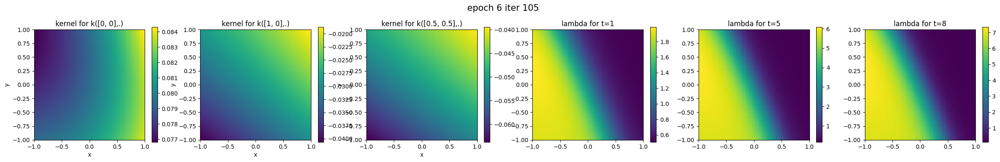

[2026-06-03T16:43:58.273657+00:00] Epoch : 6,	Total loss : 1.36990e+03
[2026-06-03T16:44:10.277622+00:00] Epoch : 7,	iter : 0,	loss : 7.21588e+00
[2026-06-03T16:45:11.459257+00:00] Epoch : 7,	iter : 5,	loss : 7.08759e+00
[2026-06-03T16:46:12.891454+00:00] Epoch : 7,	iter : 10,	loss : 2.87705e+00
[2026-06-03T16:47:15.719328+00:00] Epoch : 7,	iter : 15,	loss : 4.45910e+00
[2026-06-03T16:48:18.383327+00:00] Epoch : 7,	iter : 20,	loss : 6.65346e+00
[2026-06-03T16:49:19.010236+00:00] Epoch : 7,	iter : 25,	loss : 6.30897e+00
[2026-06-03T16:50:22.026997+00:00] Epoch : 7,	iter : 30,	loss : 6.29942e+00
[2026-06-03T16:51:23.460449+00:00] Epoch : 7,	iter : 35,	loss : 5.21673e+00
[2026-06-03T16:52:25.287498+00:00] Epoch : 7,	iter : 40,	loss : 6.20682e+00
[2026-06-03T16:53:27.026766+00:00] Epoch : 7,	iter : 45,	loss : 6.17202e+00
[2026-06-03T16:54:28.724189+00:00] Epoch : 7,	iter : 50,	loss : 5.57731e+00
[2026-06-03T16:55:29.305791+00:00] Epoch : 7,	iter : 55,	loss : -2.50883e-01
[2026-06-03T16:56:

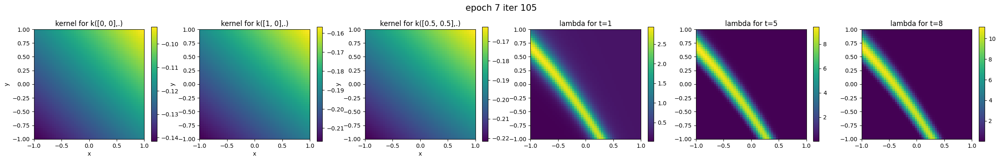

[2026-06-03T17:05:58.523970+00:00] Epoch : 7,	Total loss : 3.99577e+01
[2026-06-03T17:06:10.707189+00:00] Epoch : 8,	iter : 0,	loss : 2.84197e+00
[2026-06-03T17:07:13.569422+00:00] Epoch : 8,	iter : 5,	loss : 3.13328e+00
[2026-06-03T17:08:15.343950+00:00] Epoch : 8,	iter : 10,	loss : 1.01817e-01
[2026-06-03T17:09:15.845735+00:00] Epoch : 8,	iter : 15,	loss : -5.51445e+00
[2026-06-03T17:10:17.883927+00:00] Epoch : 8,	iter : 20,	loss : -1.62685e+00
[2026-06-03T17:11:20.783114+00:00] Epoch : 8,	iter : 25,	loss : 4.27837e+00
[2026-06-03T17:12:22.877103+00:00] Epoch : 8,	iter : 30,	loss : -1.53065e+02
[2026-06-03T17:13:25.132734+00:00] Epoch : 8,	iter : 35,	loss : 3.67682e-01
[2026-06-03T17:14:28.621862+00:00] Epoch : 8,	iter : 40,	loss : -6.75331e+00
[2026-06-03T17:15:30.254176+00:00] Epoch : 8,	iter : 45,	loss : 1.46843e+01
[2026-06-03T17:16:31.955521+00:00] Epoch : 8,	iter : 50,	loss : 5.05499e+00
[2026-06-03T17:17:34.766035+00:00] Epoch : 8,	iter : 55,	loss : 5.14454e+00
[2026-06-03T17:

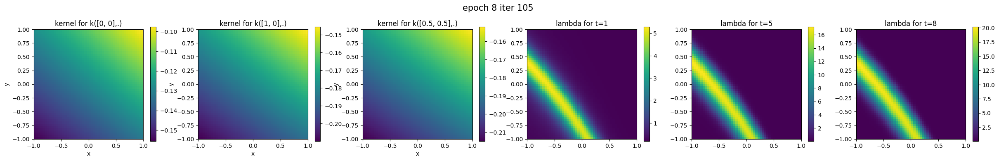

[2026-06-03T17:28:07.342800+00:00] Epoch : 8,	Total loss : -9.72087e+02
[2026-06-03T17:28:19.685945+00:00] Epoch : 9,	iter : 0,	loss : 5.52101e+00
[2026-06-03T17:29:21.074159+00:00] Epoch : 9,	iter : 5,	loss : 5.20612e+00
[2026-06-03T17:30:23.047942+00:00] Epoch : 9,	iter : 10,	loss : 4.65212e+00
[2026-06-03T17:31:24.272039+00:00] Epoch : 9,	iter : 15,	loss : 6.71887e+00
[2026-06-03T17:32:27.524206+00:00] Epoch : 9,	iter : 20,	loss : -4.00783e-01
[2026-06-03T17:33:30.045472+00:00] Epoch : 9,	iter : 25,	loss : 4.45231e+00
[2026-06-03T17:34:32.802691+00:00] Epoch : 9,	iter : 30,	loss : -1.91804e+01
[2026-06-03T17:35:34.896599+00:00] Epoch : 9,	iter : 35,	loss : 3.78282e+00
[2026-06-03T17:36:37.329546+00:00] Epoch : 9,	iter : 40,	loss : 4.15780e+00
[2026-06-03T17:37:39.798301+00:00] Epoch : 9,	iter : 45,	loss : 3.43748e+00
[2026-06-03T17:38:41.486470+00:00] Epoch : 9,	iter : 50,	loss : -4.27955e+00
[2026-06-03T17:39:43.623476+00:00] Epoch : 9,	iter : 55,	loss : 5.07383e+00
[2026-06-03T17:

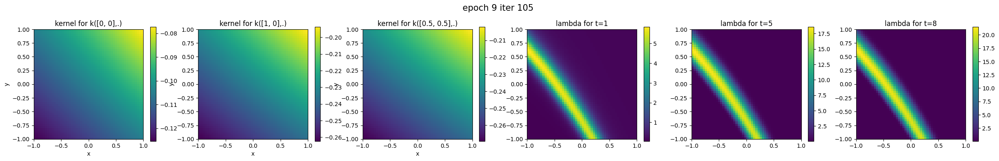

[2026-06-03T17:50:15.484788+00:00] Epoch : 9,	Total loss : -1.64481e+03
[2026-06-03T17:50:27.226781+00:00] Epoch : 10,	iter : 0,	loss : 4.30154e+00
[2026-06-03T17:51:29.394402+00:00] Epoch : 10,	iter : 5,	loss : 3.65927e+00
[2026-06-03T17:52:30.748100+00:00] Epoch : 10,	iter : 10,	loss : 3.87792e+00
[2026-06-03T17:53:31.539019+00:00] Epoch : 10,	iter : 15,	loss : 4.87057e+00
[2026-06-03T17:54:34.102659+00:00] Epoch : 10,	iter : 20,	loss : 7.50076e+00
[2026-06-03T17:55:35.605167+00:00] Epoch : 10,	iter : 25,	loss : 7.95744e+00
[2026-06-03T17:56:37.237198+00:00] Epoch : 10,	iter : 30,	loss : 6.31832e+00
[2026-06-03T17:57:39.565114+00:00] Epoch : 10,	iter : 35,	loss : 5.39229e+00
[2026-06-03T17:58:42.296177+00:00] Epoch : 10,	iter : 40,	loss : 5.45515e+00
[2026-06-03T17:59:43.004161+00:00] Epoch : 10,	iter : 45,	loss : 2.48583e+00
[2026-06-03T18:00:45.589808+00:00] Epoch : 10,	iter : 50,	loss : 4.16515e+00
[2026-06-03T18:01:48.993677+00:00] Epoch : 10,	iter : 55,	loss : -1.99658e+00
[2026

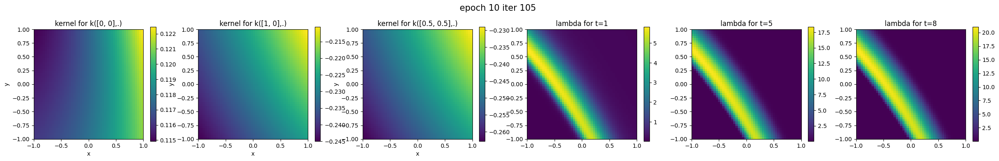

[2026-06-03T18:12:16.395451+00:00] Epoch : 10,	Total loss : -4.58236e+02
[2026-06-03T18:12:28.322588+00:00] Epoch : 11,	iter : 0,	loss : -2.83727e+02
[2026-06-03T18:13:30.065845+00:00] Epoch : 11,	iter : 5,	loss : 3.86800e+00
[2026-06-03T18:14:31.698130+00:00] Epoch : 11,	iter : 10,	loss : -3.35353e-01
[2026-06-03T18:15:32.595582+00:00] Epoch : 11,	iter : 15,	loss : 3.58606e+00
[2026-06-03T18:16:35.699385+00:00] Epoch : 11,	iter : 20,	loss : 4.39421e+00
[2026-06-03T18:17:37.239997+00:00] Epoch : 11,	iter : 25,	loss : 2.94299e+00
[2026-06-03T18:18:38.435048+00:00] Epoch : 11,	iter : 30,	loss : 3.04433e+00
[2026-06-03T18:19:40.348037+00:00] Epoch : 11,	iter : 35,	loss : 4.49705e+00
[2026-06-03T18:20:43.042214+00:00] Epoch : 11,	iter : 40,	loss : 3.89472e+00
[2026-06-03T18:21:44.100068+00:00] Epoch : 11,	iter : 45,	loss : 4.68047e+00
[2026-06-03T18:22:46.542764+00:00] Epoch : 11,	iter : 50,	loss : -1.27961e+00
[2026-06-03T18:23:48.693957+00:00] Epoch : 11,	iter : 55,	loss : 3.79798e+00
[2

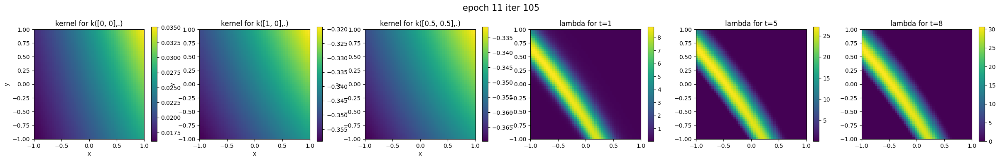

[2026-06-03T18:34:26.915661+00:00] Epoch : 11,	Total loss : -2.33121e+03
[2026-06-03T18:34:38.934292+00:00] Epoch : 12,	iter : 0,	loss : 3.10530e+00
[2026-06-03T18:35:40.822960+00:00] Epoch : 12,	iter : 5,	loss : 4.15319e+00
[2026-06-03T18:36:43.447369+00:00] Epoch : 12,	iter : 10,	loss : -8.90915e-01
[2026-06-03T18:37:45.693688+00:00] Epoch : 12,	iter : 15,	loss : -1.58884e+02
[2026-06-03T18:38:47.449593+00:00] Epoch : 12,	iter : 20,	loss : 9.52346e-01
[2026-06-03T18:39:49.228059+00:00] Epoch : 12,	iter : 25,	loss : 3.99491e+00
[2026-06-03T18:40:52.930646+00:00] Epoch : 12,	iter : 30,	loss : 3.75980e+00
[2026-06-03T18:41:55.170800+00:00] Epoch : 12,	iter : 35,	loss : 3.57678e+00
[2026-06-03T18:42:57.462548+00:00] Epoch : 12,	iter : 40,	loss : 3.33133e+00
[2026-06-03T18:43:58.829248+00:00] Epoch : 12,	iter : 45,	loss : 2.73692e+00
[2026-06-03T18:45:02.087794+00:00] Epoch : 12,	iter : 50,	loss : 3.72980e+00
[2026-06-03T18:46:06.194216+00:00] Epoch : 12,	iter : 55,	loss : 3.78239e+00
[20

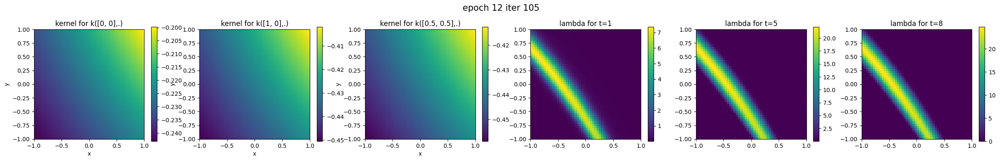

[2026-06-03T18:56:39.690511+00:00] Epoch : 12,	Total loss : -2.66223e+03
[2026-06-03T18:56:52.066477+00:00] Epoch : 13,	iter : 0,	loss : 2.29156e+00
[2026-06-03T18:57:53.467121+00:00] Epoch : 13,	iter : 5,	loss : 3.57198e+00
[2026-06-03T18:58:54.177672+00:00] Epoch : 13,	iter : 10,	loss : 1.94150e+00
[2026-06-03T18:59:54.737286+00:00] Epoch : 13,	iter : 15,	loss : -2.37417e+00
[2026-06-03T19:00:57.735546+00:00] Epoch : 13,	iter : 20,	loss : 2.09474e+00
[2026-06-03T19:01:58.559726+00:00] Epoch : 13,	iter : 25,	loss : 3.68995e+00
[2026-06-03T19:03:01.058284+00:00] Epoch : 13,	iter : 30,	loss : 4.11813e+00
[2026-06-03T19:04:03.128936+00:00] Epoch : 13,	iter : 35,	loss : 1.86951e+00
[2026-06-03T19:05:04.886752+00:00] Epoch : 13,	iter : 40,	loss : 1.51808e+00
[2026-06-03T19:06:07.073430+00:00] Epoch : 13,	iter : 45,	loss : 4.06750e+00
[2026-06-03T19:07:09.893373+00:00] Epoch : 13,	iter : 50,	loss : 3.15128e+00
[2026-06-03T19:08:12.980791+00:00] Epoch : 13,	iter : 55,	loss : 2.71923e+00
[202

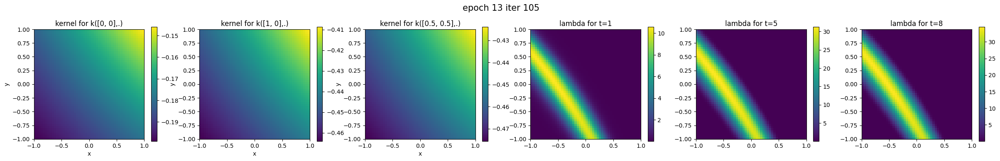

[2026-06-03T19:18:45.691020+00:00] Epoch : 13,	Total loss : -2.52947e+03
[2026-06-03T19:18:57.796653+00:00] Epoch : 14,	iter : 0,	loss : 2.65982e+00
[2026-06-03T19:19:59.986584+00:00] Epoch : 14,	iter : 5,	loss : 3.55331e+00
[2026-06-03T19:21:00.912301+00:00] Epoch : 14,	iter : 10,	loss : 4.63217e+00
[2026-06-03T19:22:04.791976+00:00] Epoch : 14,	iter : 15,	loss : 4.08776e+00
[2026-06-03T19:23:08.497982+00:00] Epoch : 14,	iter : 20,	loss : 2.45003e+00
[2026-06-03T19:24:10.199407+00:00] Epoch : 14,	iter : 25,	loss : -1.10980e+00
[2026-06-03T19:25:12.456273+00:00] Epoch : 14,	iter : 30,	loss : 1.72553e+00
[2026-06-03T19:26:13.974589+00:00] Epoch : 14,	iter : 35,	loss : -1.61819e+02
[2026-06-03T19:27:16.322295+00:00] Epoch : 14,	iter : 40,	loss : -2.26200e+00
[2026-06-03T19:28:18.324374+00:00] Epoch : 14,	iter : 45,	loss : 2.35903e-01
[2026-06-03T19:29:20.674801+00:00] Epoch : 14,	iter : 50,	loss : 1.47961e-02
[2026-06-03T19:30:22.960965+00:00] Epoch : 14,	iter : 55,	loss : 3.16354e+00
[2

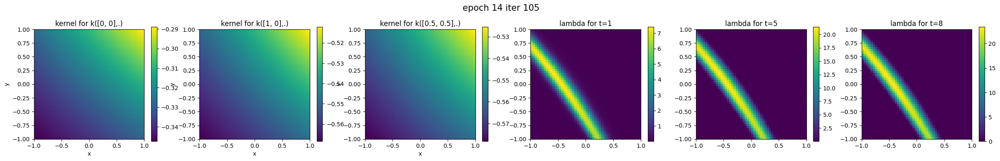

[2026-06-03T19:40:58.982804+00:00] Epoch : 14,	Total loss : -2.71337e+03
[2026-06-03T19:41:11.037602+00:00] Epoch : 15,	iter : 0,	loss : 4.84150e+00
[2026-06-03T19:42:11.705804+00:00] Epoch : 15,	iter : 5,	loss : -1.54424e+02
[2026-06-03T19:43:13.079276+00:00] Epoch : 15,	iter : 10,	loss : -1.45926e+01
[2026-06-03T19:44:14.231980+00:00] Epoch : 15,	iter : 15,	loss : -3.65926e+00
[2026-06-03T19:45:17.042930+00:00] Epoch : 15,	iter : 20,	loss : 4.83877e+00
[2026-06-03T19:46:19.535325+00:00] Epoch : 15,	iter : 25,	loss : 5.68381e+00
[2026-06-03T19:47:22.190977+00:00] Epoch : 15,	iter : 30,	loss : 2.34227e+00
[2026-06-03T19:48:24.065520+00:00] Epoch : 15,	iter : 35,	loss : 2.54867e+00
[2026-06-03T19:49:26.249244+00:00] Epoch : 15,	iter : 40,	loss : 1.53921e+00
[2026-06-03T19:50:29.437171+00:00] Epoch : 15,	iter : 45,	loss : 4.03925e+00
[2026-06-03T19:51:33.094312+00:00] Epoch : 15,	iter : 50,	loss : 1.02881e+00
[2026-06-03T19:52:34.458070+00:00] Epoch : 15,	iter : 55,	loss : 3.29407e+00
[2

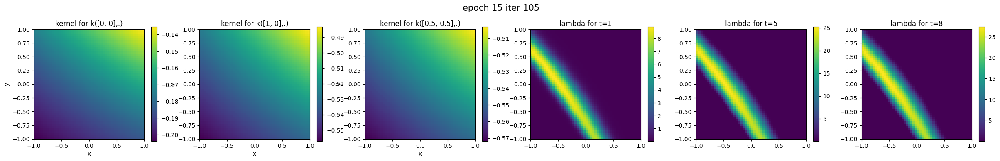

[2026-06-03T20:03:06.188194+00:00] Epoch : 15,	Total loss : -2.22571e+03
[2026-06-03T20:03:17.979699+00:00] Epoch : 16,	iter : 0,	loss : -8.32141e+01
[2026-06-03T20:04:19.787407+00:00] Epoch : 16,	iter : 5,	loss : 3.68432e+00
[2026-06-03T20:05:21.468983+00:00] Epoch : 16,	iter : 10,	loss : 3.18485e+00
[2026-06-03T20:06:23.579481+00:00] Epoch : 16,	iter : 15,	loss : 3.16361e+00
[2026-06-03T20:07:25.483894+00:00] Epoch : 16,	iter : 20,	loss : 3.77776e+00
[2026-06-03T20:08:26.500769+00:00] Epoch : 16,	iter : 25,	loss : 7.45412e+00
[2026-06-03T20:09:26.817658+00:00] Epoch : 16,	iter : 30,	loss : 1.52136e+00
[2026-06-03T20:10:28.865399+00:00] Epoch : 16,	iter : 35,	loss : 3.86803e+00
[2026-06-03T20:11:31.782468+00:00] Epoch : 16,	iter : 40,	loss : 3.49407e+00
[2026-06-03T20:12:32.999499+00:00] Epoch : 16,	iter : 45,	loss : 4.17846e+00
[2026-06-03T20:13:35.374856+00:00] Epoch : 16,	iter : 50,	loss : -5.57310e+01
[2026-06-03T20:14:37.155971+00:00] Epoch : 16,	iter : 55,	loss : -1.95966e+00
[2

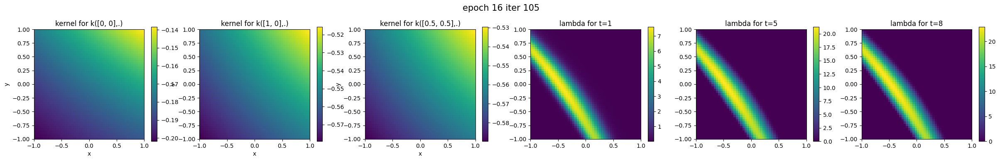

[2026-06-03T20:25:08.095648+00:00] Epoch : 16,	Total loss : -2.18370e+03
[2026-06-03T20:25:20.092167+00:00] Epoch : 17,	iter : 0,	loss : 3.09739e+00
[2026-06-03T20:26:20.927289+00:00] Epoch : 17,	iter : 5,	loss : -5.17887e-01
[2026-06-03T20:27:22.536733+00:00] Epoch : 17,	iter : 10,	loss : 3.85195e+00
[2026-06-03T20:28:24.635735+00:00] Epoch : 17,	iter : 15,	loss : 2.94157e+00
[2026-06-03T20:29:26.539376+00:00] Epoch : 17,	iter : 20,	loss : 1.63590e+00
[2026-06-03T20:30:29.197389+00:00] Epoch : 17,	iter : 25,	loss : 3.54282e+00
[2026-06-03T20:31:32.804986+00:00] Epoch : 17,	iter : 30,	loss : 5.02614e+00
[2026-06-03T20:32:35.667963+00:00] Epoch : 17,	iter : 35,	loss : 6.86893e+00
[2026-06-03T20:33:37.713916+00:00] Epoch : 17,	iter : 40,	loss : -1.30121e+01
[2026-06-03T20:34:39.766404+00:00] Epoch : 17,	iter : 45,	loss : 5.77721e+00
[2026-06-03T20:35:42.572703+00:00] Epoch : 17,	iter : 50,	loss : -2.33363e-01
[2026-06-03T20:36:45.342892+00:00] Epoch : 17,	iter : 55,	loss : 4.59559e+00
[2

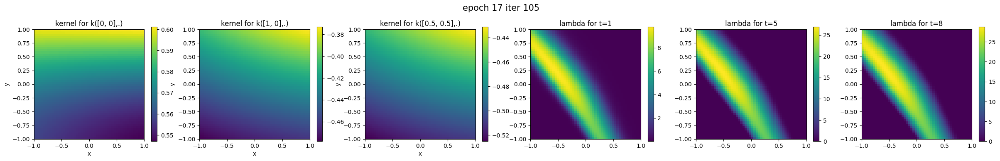

[2026-06-03T20:47:18.829543+00:00] Epoch : 17,	Total loss : -2.19965e+03
[2026-06-03T20:47:30.864055+00:00] Epoch : 18,	iter : 0,	loss : 5.84445e+00
[2026-06-03T20:48:33.627396+00:00] Epoch : 18,	iter : 5,	loss : -1.79026e+02
[2026-06-03T20:49:35.490480+00:00] Epoch : 18,	iter : 10,	loss : 3.39518e+00
[2026-06-03T20:50:36.171919+00:00] Epoch : 18,	iter : 15,	loss : 2.92212e+00
[2026-06-03T20:51:37.890530+00:00] Epoch : 18,	iter : 20,	loss : 2.10953e+00
[2026-06-03T20:52:39.402872+00:00] Epoch : 18,	iter : 25,	loss : 1.83096e+00
[2026-06-03T20:53:41.111087+00:00] Epoch : 18,	iter : 30,	loss : 3.86332e+00
[2026-06-03T20:54:42.562155+00:00] Epoch : 18,	iter : 35,	loss : 4.03174e+00
[2026-06-03T20:55:44.507718+00:00] Epoch : 18,	iter : 40,	loss : 4.37747e+00
[2026-06-03T20:56:45.404126+00:00] Epoch : 18,	iter : 45,	loss : 2.66575e+00
[2026-06-03T20:57:46.993154+00:00] Epoch : 18,	iter : 50,	loss : 1.35942e+00
[2026-06-03T20:58:48.648829+00:00] Epoch : 18,	iter : 55,	loss : 8.65813e-01
[202

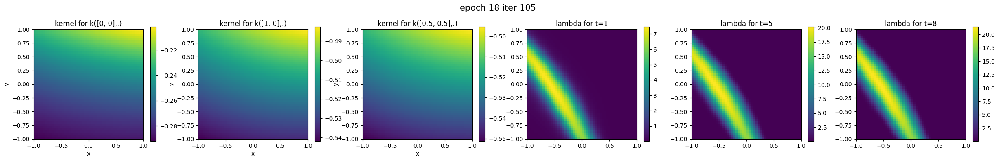

[2026-06-03T21:09:25.605573+00:00] Epoch : 18,	Total loss : -2.28390e+03
[2026-06-03T21:09:37.391632+00:00] Epoch : 19,	iter : 0,	loss : 8.96140e-01
[2026-06-03T21:10:40.284221+00:00] Epoch : 19,	iter : 5,	loss : 3.56744e+00
[2026-06-03T21:11:41.995316+00:00] Epoch : 19,	iter : 10,	loss : 4.12011e+00
[2026-06-03T21:12:44.064957+00:00] Epoch : 19,	iter : 15,	loss : 4.19564e+00
[2026-06-03T21:13:46.645968+00:00] Epoch : 19,	iter : 20,	loss : 1.84281e+00
[2026-06-03T21:14:49.599943+00:00] Epoch : 19,	iter : 25,	loss : 4.06310e+00
[2026-06-03T21:15:51.748880+00:00] Epoch : 19,	iter : 30,	loss : -9.85237e+00
[2026-06-03T21:16:53.196755+00:00] Epoch : 19,	iter : 35,	loss : 7.35129e-01
[2026-06-03T21:17:55.175201+00:00] Epoch : 19,	iter : 40,	loss : 2.26292e+00
[2026-06-03T21:18:57.532566+00:00] Epoch : 19,	iter : 45,	loss : 1.36330e+00
[2026-06-03T21:20:00.212765+00:00] Epoch : 19,	iter : 50,	loss : -3.68061e-02
[2026-06-03T21:21:01.625702+00:00] Epoch : 19,	iter : 55,	loss : 3.04617e+00
[20

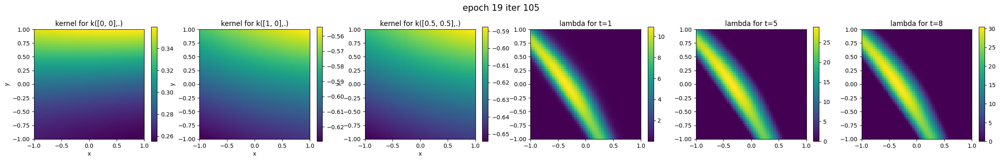

[2026-06-03T21:31:39.491386+00:00] Epoch : 19,	Total loss : -2.85755e+03
[2026-06-03T21:31:51.469838+00:00] Epoch : 20,	iter : 0,	loss : 2.72484e+00
[2026-06-03T21:32:52.648984+00:00] Epoch : 20,	iter : 5,	loss : 1.58388e+00
[2026-06-03T21:33:55.961459+00:00] Epoch : 20,	iter : 10,	loss : 3.66119e+00
[2026-06-03T21:34:58.897876+00:00] Epoch : 20,	iter : 15,	loss : 3.02238e+00
[2026-06-03T21:36:00.008368+00:00] Epoch : 20,	iter : 20,	loss : 3.87872e+00
[2026-06-03T21:37:01.301138+00:00] Epoch : 20,	iter : 25,	loss : 2.46071e+00
[2026-06-03T21:38:02.313730+00:00] Epoch : 20,	iter : 30,	loss : 3.11047e+00
[2026-06-03T21:39:02.993929+00:00] Epoch : 20,	iter : 35,	loss : -5.23581e+00
[2026-06-03T21:40:06.454228+00:00] Epoch : 20,	iter : 40,	loss : 4.21617e+00
[2026-06-03T21:41:08.023918+00:00] Epoch : 20,	iter : 45,	loss : 3.68789e+00
[2026-06-03T21:42:10.054684+00:00] Epoch : 20,	iter : 50,	loss : -9.66842e-01
[2026-06-03T21:43:12.153160+00:00] Epoch : 20,	iter : 55,	loss : 8.89364e+00
[20

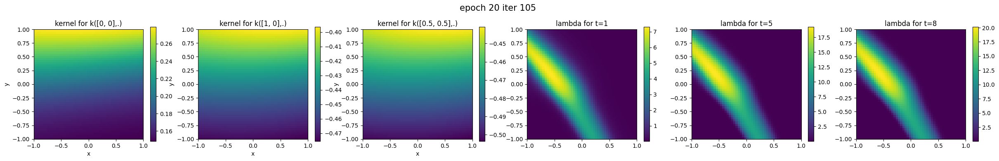

[2026-06-03T21:53:49.086958+00:00] Epoch : 20,	Total loss : -1.86364e+03
[2026-06-03T21:54:01.053708+00:00] Epoch : 21,	iter : 0,	loss : 3.12082e+00
[2026-06-03T21:55:03.702454+00:00] Epoch : 21,	iter : 5,	loss : 4.18620e+00
[2026-06-03T21:56:05.345559+00:00] Epoch : 21,	iter : 10,	loss : 2.11661e+00
[2026-06-03T21:57:07.242463+00:00] Epoch : 21,	iter : 15,	loss : -7.14543e+01
[2026-06-03T21:58:09.265009+00:00] Epoch : 21,	iter : 20,	loss : 8.49053e-01
[2026-06-03T21:59:11.872252+00:00] Epoch : 21,	iter : 25,	loss : 3.24774e+00
[2026-06-03T22:00:17.485281+00:00] Epoch : 21,	iter : 30,	loss : 2.93409e+00
[2026-06-03T22:01:20.910359+00:00] Epoch : 21,	iter : 35,	loss : 1.17774e+00
[2026-06-03T22:02:22.907350+00:00] Epoch : 21,	iter : 40,	loss : 3.71219e+00
[2026-06-03T22:03:25.827100+00:00] Epoch : 21,	iter : 45,	loss : 1.15810e+00
[2026-06-03T22:04:28.313253+00:00] Epoch : 21,	iter : 50,	loss : -3.86833e+00
[2026-06-03T22:05:29.893442+00:00] Epoch : 21,	iter : 55,	loss : 1.47250e+00
[20

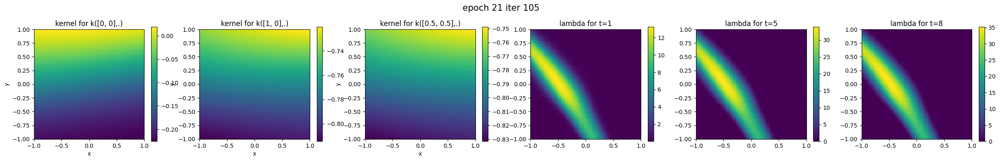

[2026-06-03T22:16:07.472729+00:00] Epoch : 21,	Total loss : -3.03774e+03
[2026-06-03T22:16:19.688174+00:00] Epoch : 22,	iter : 0,	loss : 4.06804e+00
[2026-06-03T22:17:21.594350+00:00] Epoch : 22,	iter : 5,	loss : 2.02210e+00
[2026-06-03T22:18:24.973226+00:00] Epoch : 22,	iter : 10,	loss : 4.29458e+00
[2026-06-03T22:19:27.642091+00:00] Epoch : 22,	iter : 15,	loss : -1.22528e+01
[2026-06-03T22:20:31.362954+00:00] Epoch : 22,	iter : 20,	loss : 3.60435e+00
[2026-06-03T22:21:33.497074+00:00] Epoch : 22,	iter : 25,	loss : -2.77766e-01
[2026-06-03T22:22:36.763240+00:00] Epoch : 22,	iter : 30,	loss : 2.44944e+00
[2026-06-03T22:23:38.843497+00:00] Epoch : 22,	iter : 35,	loss : -3.22554e+02
[2026-06-03T22:24:40.881529+00:00] Epoch : 22,	iter : 40,	loss : 3.48037e+00
[2026-06-03T22:25:42.918955+00:00] Epoch : 22,	iter : 45,	loss : 5.44436e+00
[2026-06-03T22:26:46.074589+00:00] Epoch : 22,	iter : 50,	loss : 3.51907e+00
[2026-06-03T22:27:48.990674+00:00] Epoch : 22,	iter : 55,	loss : -6.03754e+00
[

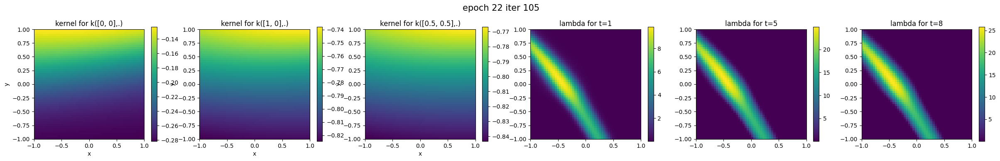

[2026-06-03T22:38:45.032428+00:00] Epoch : 22,	Total loss : -2.82906e+03
[2026-06-03T22:38:57.169018+00:00] Epoch : 23,	iter : 0,	loss : -3.76559e+00
[2026-06-03T22:39:59.639550+00:00] Epoch : 23,	iter : 5,	loss : -1.90526e+02
[2026-06-03T22:41:03.898368+00:00] Epoch : 23,	iter : 10,	loss : 2.14820e+00
[2026-06-03T22:42:06.536465+00:00] Epoch : 23,	iter : 15,	loss : 3.17287e+00
[2026-06-03T22:43:09.785001+00:00] Epoch : 23,	iter : 20,	loss : 2.50678e-01
[2026-06-03T22:44:14.712065+00:00] Epoch : 23,	iter : 25,	loss : 1.55930e+00
[2026-06-03T22:45:18.442253+00:00] Epoch : 23,	iter : 30,	loss : 1.62219e+00
[2026-06-03T22:46:21.231970+00:00] Epoch : 23,	iter : 35,	loss : -1.44089e+00
[2026-06-03T22:47:22.697197+00:00] Epoch : 23,	iter : 40,	loss : 6.59327e-01
[2026-06-03T22:48:25.231946+00:00] Epoch : 23,	iter : 45,	loss : -6.36641e+00
[2026-06-03T22:49:28.085155+00:00] Epoch : 23,	iter : 50,	loss : 3.48424e+00
[2026-06-03T22:50:31.248126+00:00] Epoch : 23,	iter : 55,	loss : 3.68298e+00
[

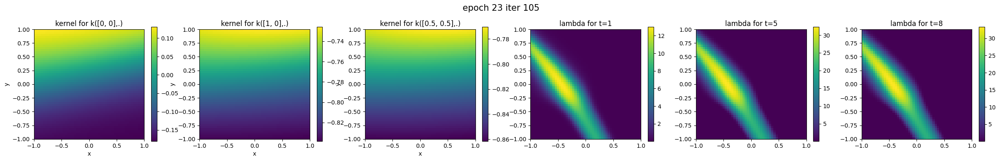

[2026-06-03T23:01:07.817087+00:00] Epoch : 23,	Total loss : -3.10032e+03
[2026-06-03T23:01:19.767671+00:00] Epoch : 24,	iter : 0,	loss : 3.82155e+00
[2026-06-03T23:02:21.701559+00:00] Epoch : 24,	iter : 5,	loss : 4.22104e+00
[2026-06-03T23:03:23.762460+00:00] Epoch : 24,	iter : 10,	loss : 3.38801e+00
[2026-06-03T23:04:25.624275+00:00] Epoch : 24,	iter : 15,	loss : -1.62988e+00
[2026-06-03T23:05:27.710398+00:00] Epoch : 24,	iter : 20,	loss : -1.91181e+02
[2026-06-03T23:06:29.918668+00:00] Epoch : 24,	iter : 25,	loss : 7.17512e-01
[2026-06-03T23:07:34.535394+00:00] Epoch : 24,	iter : 30,	loss : 4.17319e+00
[2026-06-03T23:08:37.152333+00:00] Epoch : 24,	iter : 35,	loss : -1.15154e+00
[2026-06-03T23:09:39.271396+00:00] Epoch : 24,	iter : 40,	loss : -1.02817e+00
[2026-06-03T23:10:40.703557+00:00] Epoch : 24,	iter : 45,	loss : 3.74275e+00
[2026-06-03T23:11:41.735511+00:00] Epoch : 24,	iter : 50,	loss : 3.62148e+00
[2026-06-03T23:12:44.955713+00:00] Epoch : 24,	iter : 55,	loss : -1.63464e+00


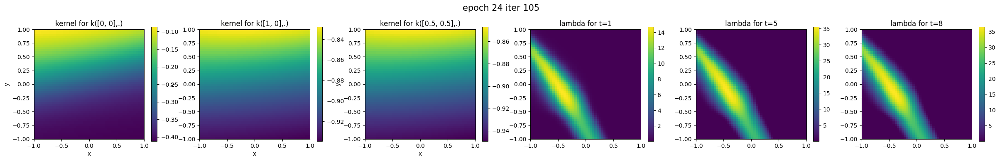

[2026-06-03T23:23:10.439184+00:00] Epoch : 24,	Total loss : -3.02811e+03
[2026-06-03T23:23:22.841697+00:00] Epoch : 25,	iter : 0,	loss : 3.99190e+00
[2026-06-03T23:24:24.640830+00:00] Epoch : 25,	iter : 5,	loss : 5.59052e+00
[2026-06-03T23:25:26.097826+00:00] Epoch : 25,	iter : 10,	loss : 4.15944e+00
[2026-06-03T23:26:28.317387+00:00] Epoch : 25,	iter : 15,	loss : -6.84300e-01
[2026-06-03T23:27:30.129208+00:00] Epoch : 25,	iter : 20,	loss : 2.14554e+00
[2026-06-03T23:28:31.602752+00:00] Epoch : 25,	iter : 25,	loss : 4.01013e+00
[2026-06-03T23:29:32.990261+00:00] Epoch : 25,	iter : 30,	loss : 4.26604e+00
[2026-06-03T23:30:35.064728+00:00] Epoch : 25,	iter : 35,	loss : -3.13288e+02
[2026-06-03T23:31:36.196943+00:00] Epoch : 25,	iter : 40,	loss : -1.32087e+01
[2026-06-03T23:32:36.598571+00:00] Epoch : 25,	iter : 45,	loss : -1.09272e+01
[2026-06-03T23:33:37.142722+00:00] Epoch : 25,	iter : 50,	loss : 1.94118e+00
[2026-06-03T23:34:38.932061+00:00] Epoch : 25,	iter : 55,	loss : 4.67869e+00
[

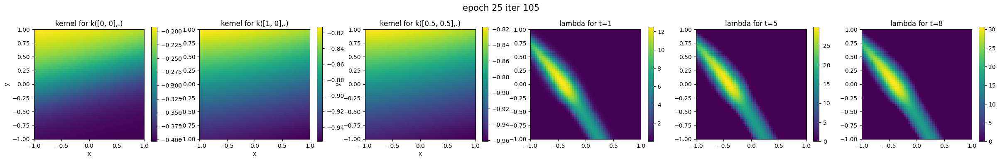

[2026-06-03T23:45:08.246463+00:00] Epoch : 25,	Total loss : -2.97319e+03
[2026-06-03T23:45:20.064846+00:00] Epoch : 26,	iter : 0,	loss : 4.22251e-01
[2026-06-03T23:46:21.160952+00:00] Epoch : 26,	iter : 5,	loss : -2.31899e+01
[2026-06-03T23:47:23.493205+00:00] Epoch : 26,	iter : 10,	loss : -1.62029e+00
[2026-06-03T23:48:23.544482+00:00] Epoch : 26,	iter : 15,	loss : 2.66714e+00
[2026-06-03T23:49:26.578069+00:00] Epoch : 26,	iter : 20,	loss : -1.88560e-01
[2026-06-03T23:50:29.143876+00:00] Epoch : 26,	iter : 25,	loss : 2.62282e+00
[2026-06-03T23:51:29.483141+00:00] Epoch : 26,	iter : 30,	loss : -3.77839e+00
[2026-06-03T23:52:30.574047+00:00] Epoch : 26,	iter : 35,	loss : 1.98619e+00
[2026-06-03T23:53:31.424407+00:00] Epoch : 26,	iter : 40,	loss : 8.55409e-01
[2026-06-03T23:54:33.795506+00:00] Epoch : 26,	iter : 45,	loss : -8.12811e+00
[2026-06-03T23:55:36.995070+00:00] Epoch : 26,	iter : 50,	loss : 1.39256e+00
[2026-06-03T23:56:39.629197+00:00] Epoch : 26,	iter : 55,	loss : -9.14573e-01

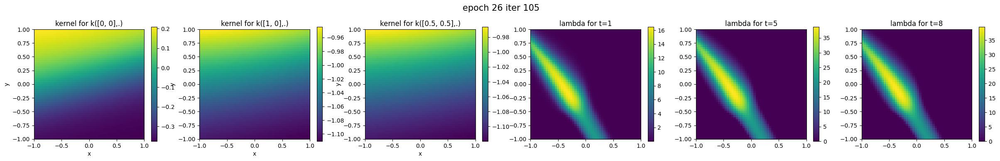

[2026-06-04T00:07:06.921672+00:00] Epoch : 26,	Total loss : -3.85739e+03
[2026-06-04T00:07:18.882973+00:00] Epoch : 27,	iter : 0,	loss : 2.83565e+00
[2026-06-04T00:08:20.941269+00:00] Epoch : 27,	iter : 5,	loss : -7.93523e-01
[2026-06-04T00:09:22.682058+00:00] Epoch : 27,	iter : 10,	loss : 3.25585e+00
[2026-06-04T00:10:24.426319+00:00] Epoch : 27,	iter : 15,	loss : 3.04236e+00
[2026-06-04T00:11:26.761100+00:00] Epoch : 27,	iter : 20,	loss : 1.51280e+00
[2026-06-04T00:12:27.631183+00:00] Epoch : 27,	iter : 25,	loss : 2.47969e+00
[2026-06-04T00:13:29.842283+00:00] Epoch : 27,	iter : 30,	loss : 3.47180e+00
[2026-06-04T00:14:32.396428+00:00] Epoch : 27,	iter : 35,	loss : 2.77080e+00
[2026-06-04T00:15:35.656833+00:00] Epoch : 27,	iter : 40,	loss : 3.58799e+00
[2026-06-04T00:16:36.528494+00:00] Epoch : 27,	iter : 45,	loss : -8.09067e+01
[2026-06-04T00:17:38.326231+00:00] Epoch : 27,	iter : 50,	loss : 3.50493e+00
[2026-06-04T00:18:40.216643+00:00] Epoch : 27,	iter : 55,	loss : -6.73021e+01
[2

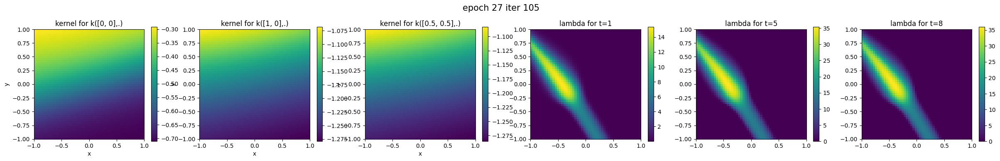

[2026-06-04T00:29:02.352588+00:00] Epoch : 27,	Total loss : -3.82053e+03
[2026-06-04T00:29:14.532277+00:00] Epoch : 28,	iter : 0,	loss : -1.52487e+00
[2026-06-04T00:30:15.168182+00:00] Epoch : 28,	iter : 5,	loss : 1.63548e+00
[2026-06-04T00:31:15.918301+00:00] Epoch : 28,	iter : 10,	loss : 2.14879e+00
[2026-06-04T00:32:17.636475+00:00] Epoch : 28,	iter : 15,	loss : 2.79125e+00
[2026-06-04T00:33:19.652413+00:00] Epoch : 28,	iter : 20,	loss : 1.89135e+00
[2026-06-04T00:34:21.711655+00:00] Epoch : 28,	iter : 25,	loss : 2.79155e+00
[2026-06-04T00:35:23.482095+00:00] Epoch : 28,	iter : 30,	loss : 3.32760e+00
[2026-06-04T00:36:24.210021+00:00] Epoch : 28,	iter : 35,	loss : -1.83859e+01
[2026-06-04T00:37:26.310538+00:00] Epoch : 28,	iter : 40,	loss : -5.82317e-01
[2026-06-04T00:38:27.533215+00:00] Epoch : 28,	iter : 45,	loss : 4.67557e-01
[2026-06-04T00:39:28.579630+00:00] Epoch : 28,	iter : 50,	loss : 3.13356e+00
[2026-06-04T00:40:28.870008+00:00] Epoch : 28,	iter : 55,	loss : 1.67664e+00
[2

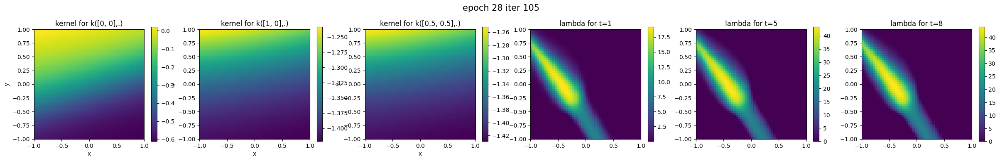

[2026-06-04T00:51:02.071357+00:00] Epoch : 28,	Total loss : -4.16597e+03
[2026-06-04T00:51:14.261427+00:00] Epoch : 29,	iter : 0,	loss : -3.01216e+00
[2026-06-04T00:52:16.665926+00:00] Epoch : 29,	iter : 5,	loss : -6.05088e+00
[2026-06-04T00:53:18.482766+00:00] Epoch : 29,	iter : 10,	loss : -7.83843e-01
[2026-06-04T00:54:19.216055+00:00] Epoch : 29,	iter : 15,	loss : 5.00118e+00
[2026-06-04T00:55:21.712105+00:00] Epoch : 29,	iter : 20,	loss : -7.20106e-01
[2026-06-04T00:56:23.747257+00:00] Epoch : 29,	iter : 25,	loss : 2.67590e+00
[2026-06-04T00:57:24.442064+00:00] Epoch : 29,	iter : 30,	loss : 2.95376e+00
[2026-06-04T00:58:27.413375+00:00] Epoch : 29,	iter : 35,	loss : 1.70147e+00
[2026-06-04T00:59:30.531733+00:00] Epoch : 29,	iter : 40,	loss : 1.89497e+00
[2026-06-04T01:00:33.095994+00:00] Epoch : 29,	iter : 45,	loss : -1.87716e+00
[2026-06-04T01:01:36.212396+00:00] Epoch : 29,	iter : 50,	loss : -6.85523e+00
[2026-06-04T01:02:38.408655+00:00] Epoch : 29,	iter : 55,	loss : 1.12839e+00

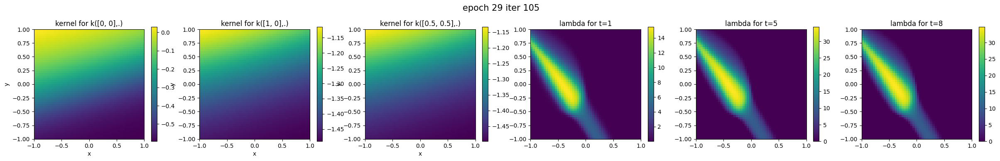

[2026-06-04T01:13:15.133257+00:00] Epoch : 29,	Total loss : -3.82688e+03
[2026-06-04T01:13:27.398058+00:00] Epoch : 30,	iter : 0,	loss : 1.49927e+00
[2026-06-04T01:14:30.224012+00:00] Epoch : 30,	iter : 5,	loss : -3.02259e+00
[2026-06-04T01:15:32.626102+00:00] Epoch : 30,	iter : 10,	loss : -6.57219e-01
[2026-06-04T01:16:37.941229+00:00] Epoch : 30,	iter : 15,	loss : 5.90478e-01
[2026-06-04T01:17:42.036742+00:00] Epoch : 30,	iter : 20,	loss : 2.20021e+00
[2026-06-04T01:18:42.656291+00:00] Epoch : 30,	iter : 25,	loss : -5.61004e-01
[2026-06-04T01:19:44.294913+00:00] Epoch : 30,	iter : 30,	loss : -2.76637e+00
[2026-06-04T01:20:45.878051+00:00] Epoch : 30,	iter : 35,	loss : -1.16476e+01
[2026-06-04T01:21:48.047662+00:00] Epoch : 30,	iter : 40,	loss : -4.42056e-02
[2026-06-04T01:22:49.403337+00:00] Epoch : 30,	iter : 45,	loss : 2.46726e+00
[2026-06-04T01:23:52.963011+00:00] Epoch : 30,	iter : 50,	loss : 5.65282e+00
[2026-06-04T01:24:54.360898+00:00] Epoch : 30,	iter : 55,	loss : 2.43439e+00

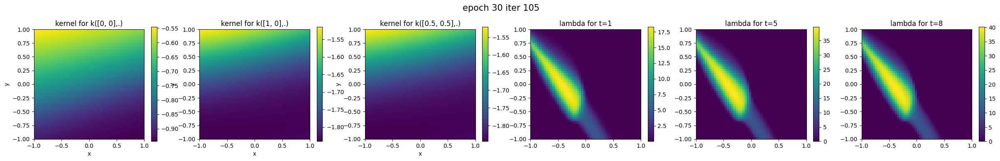

[2026-06-04T01:35:29.755580+00:00] Epoch : 30,	Total loss : -4.60886e+03
[2026-06-04T01:35:41.672892+00:00] Epoch : 31,	iter : 0,	loss : -3.32415e+00
[2026-06-04T01:36:42.564140+00:00] Epoch : 31,	iter : 5,	loss : 2.98133e+00
[2026-06-04T01:37:43.877910+00:00] Epoch : 31,	iter : 10,	loss : -1.38660e+00
[2026-06-04T01:38:45.893579+00:00] Epoch : 31,	iter : 15,	loss : 2.05894e+00
[2026-06-04T01:39:46.888829+00:00] Epoch : 31,	iter : 20,	loss : 2.45395e+00
[2026-06-04T01:40:47.585352+00:00] Epoch : 31,	iter : 25,	loss : 1.29511e+00
[2026-06-04T01:41:49.507053+00:00] Epoch : 31,	iter : 30,	loss : 2.79324e+00
[2026-06-04T01:42:49.706656+00:00] Epoch : 31,	iter : 35,	loss : -2.31372e-01
[2026-06-04T01:43:51.237911+00:00] Epoch : 31,	iter : 40,	loss : 1.19723e-01
[2026-06-04T01:44:52.018699+00:00] Epoch : 31,	iter : 45,	loss : -1.61921e+00
[2026-06-04T01:45:52.142053+00:00] Epoch : 31,	iter : 50,	loss : 1.02019e+00
[2026-06-04T01:46:52.268824+00:00] Epoch : 31,	iter : 55,	loss : -2.17823e+01


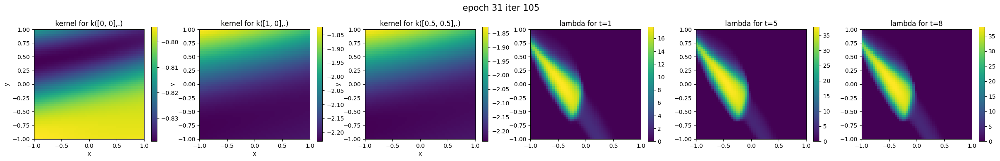

[2026-06-04T01:57:25.545376+00:00] Epoch : 31,	Total loss : -4.83193e+03
[2026-06-04T01:57:38.247020+00:00] Epoch : 32,	iter : 0,	loss : -1.22389e+01
[2026-06-04T01:58:40.227067+00:00] Epoch : 32,	iter : 5,	loss : 1.83272e+00
[2026-06-04T01:59:41.892413+00:00] Epoch : 32,	iter : 10,	loss : -1.71312e+01
[2026-06-04T02:00:43.310936+00:00] Epoch : 32,	iter : 15,	loss : -5.94520e+00
[2026-06-04T02:01:45.947840+00:00] Epoch : 32,	iter : 20,	loss : 2.69661e+00
[2026-06-04T02:02:46.783221+00:00] Epoch : 32,	iter : 25,	loss : 2.88876e+00
[2026-06-04T02:03:48.243611+00:00] Epoch : 32,	iter : 30,	loss : 2.62763e+00
[2026-06-04T02:04:49.905954+00:00] Epoch : 32,	iter : 35,	loss : -1.93653e+00
[2026-06-04T02:05:55.824068+00:00] Epoch : 32,	iter : 40,	loss : -8.15434e+01
[2026-06-04T02:06:59.559481+00:00] Epoch : 32,	iter : 45,	loss : 3.94368e+00
[2026-06-04T02:08:03.965426+00:00] Epoch : 32,	iter : 50,	loss : 2.28487e+00
[2026-06-04T02:09:06.713050+00:00] Epoch : 32,	iter : 55,	loss : -4.06935e+01

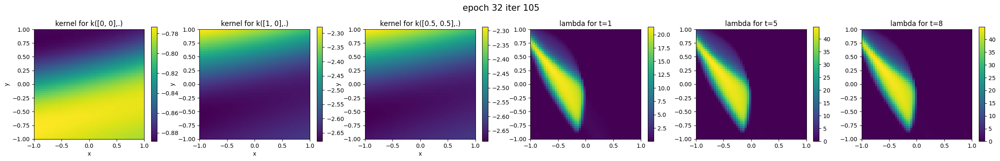

[2026-06-04T02:19:38.222644+00:00] Epoch : 32,	Total loss : -5.16022e+03
[2026-06-04T02:19:50.524568+00:00] Epoch : 33,	iter : 0,	loss : -2.06693e-01
[2026-06-04T02:20:52.385296+00:00] Epoch : 33,	iter : 5,	loss : -1.23857e+00
[2026-06-04T02:21:52.250217+00:00] Epoch : 33,	iter : 10,	loss : 2.73796e+00
[2026-06-04T02:22:53.185153+00:00] Epoch : 33,	iter : 15,	loss : -1.95256e+01
[2026-06-04T02:23:54.726300+00:00] Epoch : 33,	iter : 20,	loss : 2.61148e+00
[2026-06-04T02:24:54.736908+00:00] Epoch : 33,	iter : 25,	loss : 1.80069e+00
[2026-06-04T02:25:55.868316+00:00] Epoch : 33,	iter : 30,	loss : 8.78040e-01
[2026-06-04T02:26:56.155806+00:00] Epoch : 33,	iter : 35,	loss : -1.71551e-01
[2026-06-04T02:27:58.288408+00:00] Epoch : 33,	iter : 40,	loss : 2.52947e+00
[2026-06-04T02:28:59.705983+00:00] Epoch : 33,	iter : 45,	loss : 1.81127e+00
[2026-06-04T02:30:01.732464+00:00] Epoch : 33,	iter : 50,	loss : -2.90810e-01
[2026-06-04T02:31:02.069313+00:00] Epoch : 33,	iter : 55,	loss : 1.86519e+00


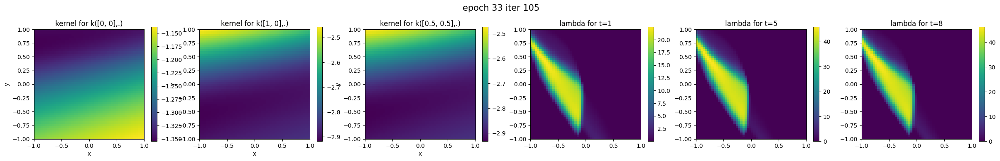

[2026-06-04T02:41:31.153970+00:00] Epoch : 33,	Total loss : -4.97641e+03
[2026-06-04T02:41:43.263768+00:00] Epoch : 34,	iter : 0,	loss : 2.69645e+00
[2026-06-04T02:42:45.239609+00:00] Epoch : 34,	iter : 5,	loss : -1.06219e+01
[2026-06-04T02:43:46.445391+00:00] Epoch : 34,	iter : 10,	loss : 1.32565e+00
[2026-06-04T02:44:48.986061+00:00] Epoch : 34,	iter : 15,	loss : -2.01604e+00
[2026-06-04T02:45:52.008933+00:00] Epoch : 34,	iter : 20,	loss : -1.28860e+00
[2026-06-04T02:46:53.546020+00:00] Epoch : 34,	iter : 25,	loss : 6.16768e-01
[2026-06-04T02:47:55.747883+00:00] Epoch : 34,	iter : 30,	loss : -3.67435e+00
[2026-06-04T02:48:58.952332+00:00] Epoch : 34,	iter : 35,	loss : -5.42149e-01
[2026-06-04T02:50:00.702311+00:00] Epoch : 34,	iter : 40,	loss : 2.85783e+00
[2026-06-04T02:51:02.337921+00:00] Epoch : 34,	iter : 45,	loss : 2.08902e+00
[2026-06-04T02:52:07.153425+00:00] Epoch : 34,	iter : 50,	loss : -4.67074e+00
[2026-06-04T02:53:10.344671+00:00] Epoch : 34,	iter : 55,	loss : 9.65197e-01

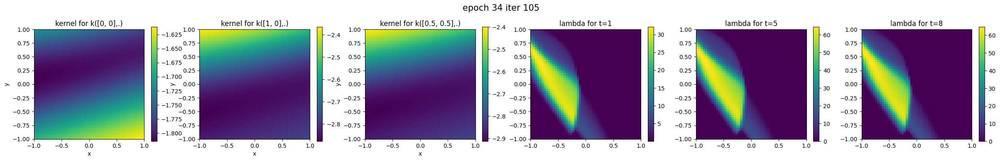

[2026-06-04T03:03:48.990153+00:00] Epoch : 34,	Total loss : -5.06775e+03
[2026-06-04T03:04:01.320578+00:00] Epoch : 35,	iter : 0,	loss : 7.61248e-01
[2026-06-04T03:05:03.503972+00:00] Epoch : 35,	iter : 5,	loss : -6.89250e+00
[2026-06-04T03:06:05.231429+00:00] Epoch : 35,	iter : 10,	loss : 7.44606e+00
[2026-06-04T03:07:06.723388+00:00] Epoch : 35,	iter : 15,	loss : 4.90239e-01
[2026-06-04T03:08:09.721545+00:00] Epoch : 35,	iter : 20,	loss : 4.21935e+00
[2026-06-04T03:09:11.666860+00:00] Epoch : 35,	iter : 25,	loss : 3.43215e+00
[2026-06-04T03:10:14.428501+00:00] Epoch : 35,	iter : 30,	loss : 2.94040e+00
[2026-06-04T03:11:17.727316+00:00] Epoch : 35,	iter : 35,	loss : 2.73933e+00
[2026-06-04T03:12:20.794374+00:00] Epoch : 35,	iter : 40,	loss : 1.36076e+00
[2026-06-04T03:13:24.133166+00:00] Epoch : 35,	iter : 45,	loss : -3.26732e-01
[2026-06-04T03:14:27.353933+00:00] Epoch : 35,	iter : 50,	loss : 2.42946e+00
[2026-06-04T03:15:30.467049+00:00] Epoch : 35,	iter : 55,	loss : 1.85061e+00
[20

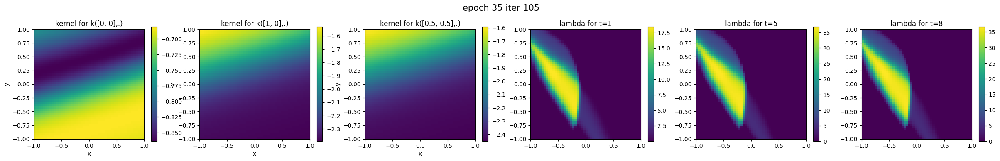

[2026-06-04T03:26:05.981801+00:00] Epoch : 35,	Total loss : -3.14169e+03
[2026-06-04T03:26:17.927757+00:00] Epoch : 36,	iter : 0,	loss : -1.59826e+01
[2026-06-04T03:27:19.482077+00:00] Epoch : 36,	iter : 5,	loss : 1.75800e-02
[2026-06-04T03:28:22.485800+00:00] Epoch : 36,	iter : 10,	loss : -7.17930e+00
[2026-06-04T03:29:24.482817+00:00] Epoch : 36,	iter : 15,	loss : -3.92497e+02
[2026-06-04T03:30:28.076346+00:00] Epoch : 36,	iter : 20,	loss : -4.53658e+00
[2026-06-04T03:31:29.255261+00:00] Epoch : 36,	iter : 25,	loss : 3.36459e+00
[2026-06-04T03:32:32.073285+00:00] Epoch : 36,	iter : 30,	loss : 2.69994e+00
[2026-06-04T03:33:34.311547+00:00] Epoch : 36,	iter : 35,	loss : -1.37062e+00
[2026-06-04T03:34:36.666568+00:00] Epoch : 36,	iter : 40,	loss : -3.17677e+00
[2026-06-04T03:35:37.468483+00:00] Epoch : 36,	iter : 45,	loss : -3.74510e+00
[2026-06-04T03:36:38.942782+00:00] Epoch : 36,	iter : 50,	loss : 1.25231e+00
[2026-06-04T03:37:39.019359+00:00] Epoch : 36,	iter : 55,	loss : -1.10825e+

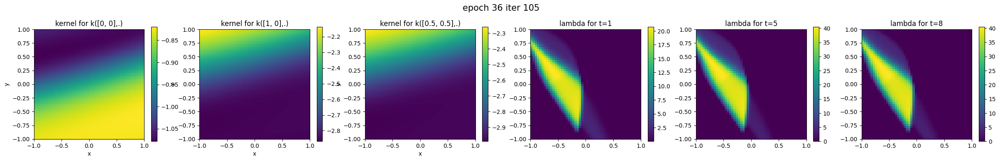

[2026-06-04T03:48:07.111660+00:00] Epoch : 36,	Total loss : -5.22761e+03
[2026-06-04T03:48:19.377122+00:00] Epoch : 37,	iter : 0,	loss : -4.71743e+01
[2026-06-04T03:49:21.932423+00:00] Epoch : 37,	iter : 5,	loss : 3.23373e+00
[2026-06-04T03:50:27.299456+00:00] Epoch : 37,	iter : 10,	loss : -3.33873e+00
[2026-06-04T03:51:30.784495+00:00] Epoch : 37,	iter : 15,	loss : 3.37914e+00
[2026-06-04T03:52:32.614437+00:00] Epoch : 37,	iter : 20,	loss : -8.02048e+00
[2026-06-04T03:53:35.288516+00:00] Epoch : 37,	iter : 25,	loss : -4.46241e+00
[2026-06-04T03:54:38.231030+00:00] Epoch : 37,	iter : 30,	loss : -4.53933e-01
[2026-06-04T03:55:38.334170+00:00] Epoch : 37,	iter : 35,	loss : 8.00049e-01
[2026-06-04T03:56:39.710854+00:00] Epoch : 37,	iter : 40,	loss : 9.09242e-01
[2026-06-04T03:57:40.129027+00:00] Epoch : 37,	iter : 45,	loss : -4.34201e+00
[2026-06-04T03:58:41.187821+00:00] Epoch : 37,	iter : 50,	loss : -1.65536e+01
[2026-06-04T03:59:42.014883+00:00] Epoch : 37,	iter : 55,	loss : -2.30043e+

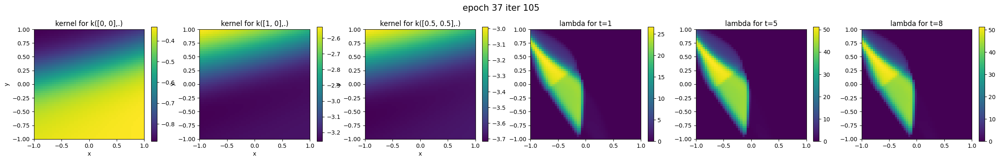

[2026-06-04T04:10:06.196820+00:00] Epoch : 37,	Total loss : -5.51725e+03
[2026-06-04T04:10:18.192037+00:00] Epoch : 38,	iter : 0,	loss : 2.44631e+00
[2026-06-04T04:11:18.791606+00:00] Epoch : 38,	iter : 5,	loss : -1.13166e+00
[2026-06-04T04:12:18.871015+00:00] Epoch : 38,	iter : 10,	loss : 8.59314e-01
[2026-06-04T04:13:20.039729+00:00] Epoch : 38,	iter : 15,	loss : 1.90253e+00
[2026-06-04T04:14:21.222909+00:00] Epoch : 38,	iter : 20,	loss : -5.12035e+00
[2026-06-04T04:15:22.299516+00:00] Epoch : 38,	iter : 25,	loss : 1.77906e+00
[2026-06-04T04:16:23.576245+00:00] Epoch : 38,	iter : 30,	loss : -1.17697e+00
[2026-06-04T04:17:24.621504+00:00] Epoch : 38,	iter : 35,	loss : 2.57483e+00
[2026-06-04T04:18:26.280314+00:00] Epoch : 38,	iter : 40,	loss : 2.43567e-01
[2026-06-04T04:19:29.406309+00:00] Epoch : 38,	iter : 45,	loss : 9.55425e-01
[2026-06-04T04:20:30.318794+00:00] Epoch : 38,	iter : 50,	loss : 1.34695e+00
[2026-06-04T04:21:30.785061+00:00] Epoch : 38,	iter : 55,	loss : 1.62294e+00
[2

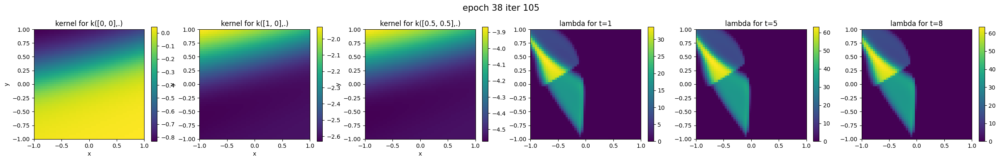

[2026-06-04T04:32:00.028532+00:00] Epoch : 38,	Total loss : -5.96503e+03
[2026-06-04T04:32:12.169411+00:00] Epoch : 39,	iter : 0,	loss : 2.30899e+00
[2026-06-04T04:33:14.707986+00:00] Epoch : 39,	iter : 5,	loss : 2.44880e+00
[2026-06-04T04:34:16.234197+00:00] Epoch : 39,	iter : 10,	loss : 7.82930e-01
[2026-06-04T04:35:17.874499+00:00] Epoch : 39,	iter : 15,	loss : 1.25577e+00
[2026-06-04T04:36:20.152284+00:00] Epoch : 39,	iter : 20,	loss : 2.21353e+00
[2026-06-04T04:37:23.216362+00:00] Epoch : 39,	iter : 25,	loss : -1.04336e+01
[2026-06-04T04:38:24.597768+00:00] Epoch : 39,	iter : 30,	loss : 2.19815e+00
[2026-06-04T04:39:27.624690+00:00] Epoch : 39,	iter : 35,	loss : 3.49878e-01
[2026-06-04T04:40:29.739668+00:00] Epoch : 39,	iter : 40,	loss : 7.29581e-01
[2026-06-04T04:41:31.439267+00:00] Epoch : 39,	iter : 45,	loss : 9.00109e-01
[2026-06-04T04:42:32.600926+00:00] Epoch : 39,	iter : 50,	loss : -2.82216e-01
[2026-06-04T04:43:35.896427+00:00] Epoch : 39,	iter : 55,	loss : -5.91716e+00
[2

In [ ]:
seed = 5
torch.random.manual_seed(seed)

# Training configurations
batch_size = 8
num_epochs = 50
lr         = 1e-2
modelname  = "nsmpp_st-db_real-%d" % seed

# Model configurations
T          = (0., 10.)
S          = ((-1, 1), (-1, 1))
data_dim   = 3
int_res    = 5

# Define point process model
#trg_model  = SpatioTemporalDeepBasisPointProcess(
#    T=T, S=S,
#    n_basis=5, basis_dim=7, data_dim=data_dim,
#    numerical_int=True, int_res=int_res,
    # init_gain=3.5e+0, init_bias=-7e-1,
#    init_gain=3e+0, init_bias=-1e-1,
#    nn_width=5, beta=1)
#torch.save(trg_model.state_dict(), "%s/saved_models/%s-%d.pth" % (rootpath, "spatiotemporal-deepnnbasis_target_model", seed))
#trg_model.load_state_dict(torch.load("%s/saved_models/%s-%d.pth" % (rootpath, "spatiotemporal-deepnnbasis_target_model", seed)))

init_model2 = SpatioTemporalDeepBasisPointProcess(
    T=T, S=S,
    n_basis=5, basis_dim=7, data_dim=data_dim,
    numerical_int=True, int_res=int_res,
    nn_width=10, beta=1) #, beta=1
# init_model.load_state_dict(torch.load("%s/saved_models/%s.pth" % (rootpath, modelname)))
print("Number of parameters:",
      sum(p.numel() for p in init_model2.parameters()))

# visualize the target model
#plot_fitted_2D_model(trg_model, test_seq,
#                     ss=[[0, 0], [1, 0], [-0.5, 0.5]],
#                     ts=[10, 50, 80],
#                     S=S, ngrid=50, filename="Target Model")
plot_fitted_2D_model(init_model2, test_seq,
                     ss=[[0, 0], [1, 0], [0.5, 0.5]],
                     ts=[1, 5, 8],
                     S=S, ngrid=50, filename="Initialized Model")

# Training
train(init_model2, train_loader, trg_model=None, S=S, ngrid=50, test_data=test_seq,
      modelname=modelname, num_epochs=num_epochs, lr=lr, print_iter=5)

# Log-likelihood evaluation
def evaluate_loglik_nspp(model, data):
    model.eval()
    with torch.no_grad():
        _, loglik = model(data)   # [N_seq]
        total_loglik = loglik.sum().item()
        n_events = (data[..., 0] > 0).sum().item()
        ll_per_event = total_loglik / n_events
    return total_loglik, ll_per_event, n_events

total_ll_stdb, ll_per_ev_stdb, n_ev_stdb = evaluate_loglik_nspp(init_model2, data)
print("NSMPP total log-likelihood :", total_ll_stdb)

#4. ST-Hawkes Baseline (without Magnitude)
This baseline uses an exponential kernel in time and a Gaussian kernel in space.


In [16]:
class st_hawkes_exp_gauss_kernel(torch.nn.Module):
    """
    temporal: exponential (beta)
    spatial: gaussian (sigma)
    """
    def __init__(self, alpha, beta, sigma):
        """
        Arg:
        - beta: decaying rate
        - sigma: variance of gaussian
        """
        super(st_hawkes_exp_gauss_kernel, self).__init__()
        self._alpha  = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
        self._beta  = torch.nn.Parameter(torch.rand([1]), requires_grad=True)
        self._sigma = torch.nn.Parameter(torch.rand([1]), requires_grad=True)

    def forward(self, x, y):
        """
        customized forward function returning kernel evaluation at x and y with
        size [ batch_size, batch_size ], where
        x: [N, 3] (t, x, y)
        y: [N, 3] (t, x, y)
        return kernel k(x - y) elementwise
        """
        dt = x[:, 0] - y[:, 0]                      # [N]
        dx = x[:, 1] - y[:, 1]                      # [N]
        dy = x[:, 2] - y[:, 2]                      # [N]

        # Temporal kernel
        k_t = self._beta * torch.exp(-self._beta * dt)

        # Gaussian spatial kernel
        dist2 = dx**2 + dy**2
        k_s = (1.0 / (2 * np.pi * self._sigma**2)) * torch.exp(- dist2 / (2 * self._sigma**2))

        # Return overall kernel
        return self._alpha * k_t * k_s

class sthawkes_exp_gauss_kernel(BasePointProcess):
    """
    Hawkes process with exponential temporal kernel and gaussian spatial kernel
    """
    def __init__(self, T, S, alpha, beta, sigma, mu, data_dim, numerical_int=True, int_res=100):
        super(sthawkes_exp_gauss_kernel, self).__init__(T, S, data_dim, numerical_int, int_res)
        self.kernel = st_hawkes_exp_gauss_kernel(alpha, beta, sigma)
        self._mu    = torch.nn.Parameter(torch.rand([1]), requires_grad=True)

    def mu(self):
        """
        return base intensity
        """
        return torch.nn.functional.softplus(self._mu)

    def forward(self, X):
        return self.log_likelihood(X)

Number of parameters: 4


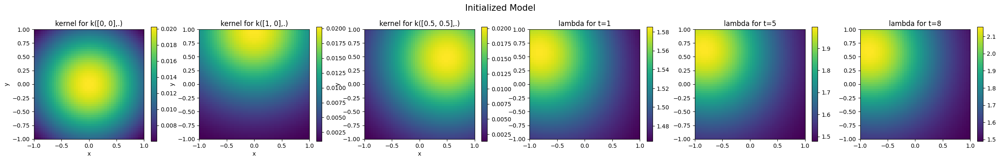

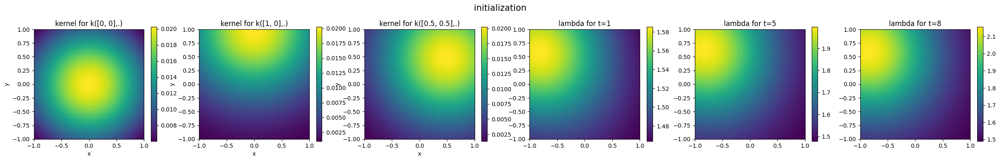

[2026-06-06T04:57:00.222798+00:00] Epoch : 0,	iter : 0,	loss : 1.04364e+01
[2026-06-06T04:57:03.132426+00:00] Epoch : 0,	iter : 5,	loss : 1.04491e+01
[2026-06-06T04:57:06.212906+00:00] Epoch : 0,	iter : 10,	loss : -7.93572e+00
[2026-06-06T04:57:09.141557+00:00] Epoch : 0,	iter : 15,	loss : 1.02292e+01
[2026-06-06T04:57:12.343672+00:00] Epoch : 0,	iter : 20,	loss : 9.03733e+00
[2026-06-06T04:57:15.284107+00:00] Epoch : 0,	iter : 25,	loss : 9.65692e+00


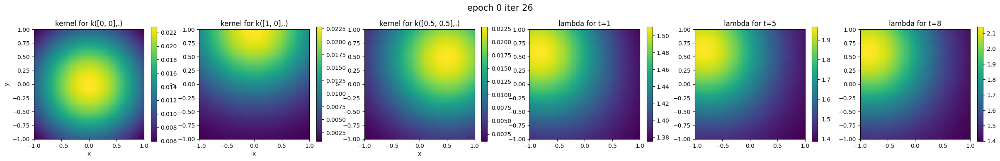

[2026-06-06T04:57:16.596286+00:00] Epoch : 0,	Total loss : 9.85474e+02
[2026-06-06T04:57:17.260215+00:00] Epoch : 1,	iter : 0,	loss : 9.73623e+00
[2026-06-06T04:57:20.435986+00:00] Epoch : 1,	iter : 5,	loss : 9.22793e+00
[2026-06-06T04:57:23.310552+00:00] Epoch : 1,	iter : 10,	loss : 9.05169e+00
[2026-06-06T04:57:26.203871+00:00] Epoch : 1,	iter : 15,	loss : -2.53862e+01
[2026-06-06T04:57:29.253217+00:00] Epoch : 1,	iter : 20,	loss : 9.38256e+00
[2026-06-06T04:57:32.294017+00:00] Epoch : 1,	iter : 25,	loss : 9.83586e+00


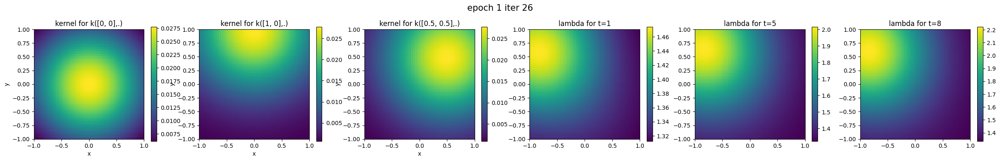

[2026-06-06T04:57:33.555745+00:00] Epoch : 1,	Total loss : 9.14791e+02
[2026-06-06T04:57:34.135157+00:00] Epoch : 2,	iter : 0,	loss : 9.46340e+00
[2026-06-06T04:57:37.135624+00:00] Epoch : 2,	iter : 5,	loss : 9.72638e+00
[2026-06-06T04:57:40.169859+00:00] Epoch : 2,	iter : 10,	loss : 9.40717e+00
[2026-06-06T04:57:43.079932+00:00] Epoch : 2,	iter : 15,	loss : 9.41769e+00
[2026-06-06T04:57:46.006770+00:00] Epoch : 2,	iter : 20,	loss : 6.37226e+00
[2026-06-06T04:57:49.024744+00:00] Epoch : 2,	iter : 25,	loss : 3.91098e+00


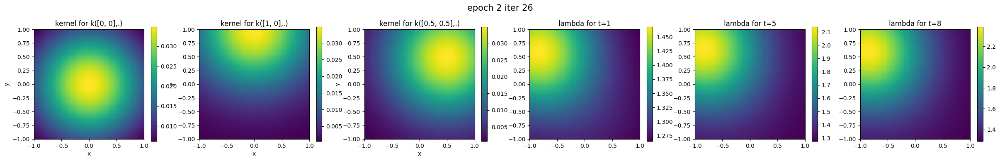

[2026-06-06T04:57:50.253491+00:00] Epoch : 2,	Total loss : 8.51559e+02
[2026-06-06T04:57:50.873467+00:00] Epoch : 3,	iter : 0,	loss : 9.61171e+00
[2026-06-06T04:57:54.115339+00:00] Epoch : 3,	iter : 5,	loss : 9.60278e+00
[2026-06-06T04:57:57.035563+00:00] Epoch : 3,	iter : 10,	loss : 3.70982e+00
[2026-06-06T04:57:59.971895+00:00] Epoch : 3,	iter : 15,	loss : -1.84654e+00
[2026-06-06T04:58:02.969285+00:00] Epoch : 3,	iter : 20,	loss : 9.21064e+00
[2026-06-06T04:58:06.162966+00:00] Epoch : 3,	iter : 25,	loss : 9.21931e+00


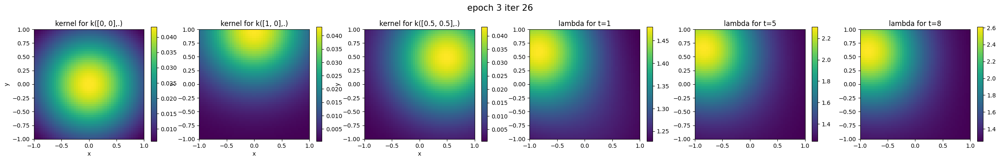

[2026-06-06T04:58:07.420612+00:00] Epoch : 3,	Total loss : 7.93790e+02
[2026-06-06T04:58:07.979884+00:00] Epoch : 4,	iter : 0,	loss : 8.89784e+00
[2026-06-06T04:58:11.187817+00:00] Epoch : 4,	iter : 5,	loss : -1.66426e+01
[2026-06-06T04:58:14.136489+00:00] Epoch : 4,	iter : 10,	loss : 8.18569e+00
[2026-06-06T04:58:17.089728+00:00] Epoch : 4,	iter : 15,	loss : 8.67587e+00
[2026-06-06T04:58:20.044934+00:00] Epoch : 4,	iter : 20,	loss : 8.81600e+00
[2026-06-06T04:58:22.940373+00:00] Epoch : 4,	iter : 25,	loss : 7.94864e+00


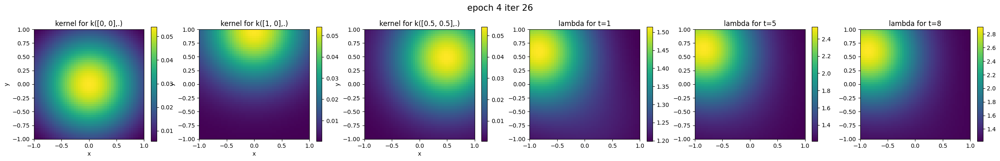

[2026-06-06T04:58:24.305588+00:00] Epoch : 4,	Total loss : 7.44672e+02
[2026-06-06T04:58:24.850911+00:00] Epoch : 5,	iter : 0,	loss : 9.26124e+00
[2026-06-06T04:58:27.855005+00:00] Epoch : 5,	iter : 5,	loss : 6.84460e+00
[2026-06-06T04:58:30.981234+00:00] Epoch : 5,	iter : 10,	loss : 4.98223e-02
[2026-06-06T04:58:33.947993+00:00] Epoch : 5,	iter : 15,	loss : 8.91070e+00
[2026-06-06T04:58:36.876872+00:00] Epoch : 5,	iter : 20,	loss : 8.93852e+00
[2026-06-06T04:58:39.834404+00:00] Epoch : 5,	iter : 25,	loss : 7.43986e+00


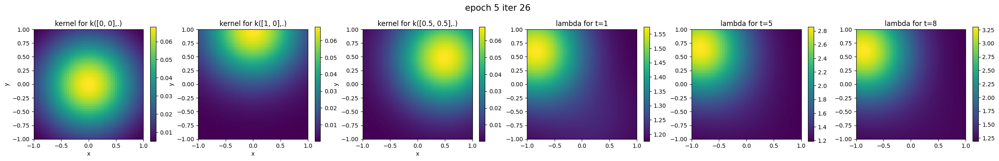

[2026-06-06T04:58:41.222789+00:00] Epoch : 5,	Total loss : 6.84030e+02
[2026-06-06T04:58:41.805650+00:00] Epoch : 6,	iter : 0,	loss : -5.55532e-02
[2026-06-06T04:58:44.745667+00:00] Epoch : 6,	iter : 5,	loss : 5.06440e+00
[2026-06-06T04:58:47.676365+00:00] Epoch : 6,	iter : 10,	loss : 8.56131e+00
[2026-06-06T04:58:50.852633+00:00] Epoch : 6,	iter : 15,	loss : 7.39909e+00
[2026-06-06T04:58:53.802186+00:00] Epoch : 6,	iter : 20,	loss : 5.01230e+00
[2026-06-06T04:58:56.789815+00:00] Epoch : 6,	iter : 25,	loss : 6.53763e+00


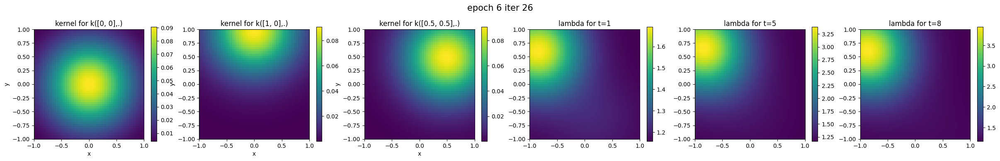

[2026-06-06T04:58:58.180782+00:00] Epoch : 6,	Total loss : 6.21464e+02
[2026-06-06T04:58:58.767196+00:00] Epoch : 7,	iter : 0,	loss : 5.42668e+00
[2026-06-06T04:59:01.740457+00:00] Epoch : 7,	iter : 5,	loss : 8.88257e+00
[2026-06-06T04:59:04.686702+00:00] Epoch : 7,	iter : 10,	loss : 8.31518e+00
[2026-06-06T04:59:07.640569+00:00] Epoch : 7,	iter : 15,	loss : 8.47794e+00
[2026-06-06T04:59:10.712441+00:00] Epoch : 7,	iter : 20,	loss : 8.15615e+00
[2026-06-06T04:59:13.886038+00:00] Epoch : 7,	iter : 25,	loss : 7.12966e+00


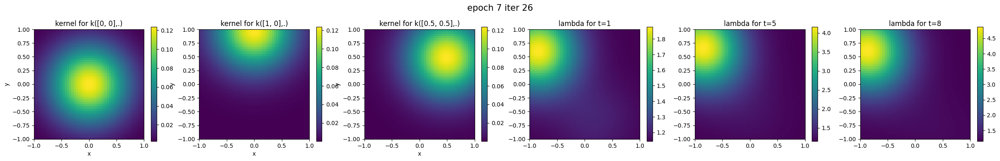

[2026-06-06T04:59:15.139031+00:00] Epoch : 7,	Total loss : 5.47375e+02
[2026-06-06T04:59:15.740507+00:00] Epoch : 8,	iter : 0,	loss : 4.26152e+00
[2026-06-06T04:59:18.883317+00:00] Epoch : 8,	iter : 5,	loss : 7.05277e+00
[2026-06-06T04:59:21.883090+00:00] Epoch : 8,	iter : 10,	loss : 8.81528e+00
[2026-06-06T04:59:24.894118+00:00] Epoch : 8,	iter : 15,	loss : 8.86468e+00
[2026-06-06T04:59:27.731622+00:00] Epoch : 8,	iter : 20,	loss : 8.96900e+00
[2026-06-06T04:59:30.872616+00:00] Epoch : 8,	iter : 25,	loss : 8.29940e+00


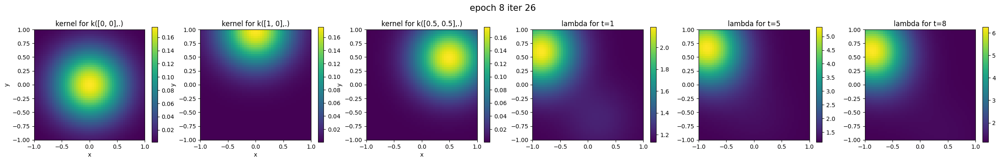

[2026-06-06T04:59:32.147944+00:00] Epoch : 8,	Total loss : 4.73000e+02
[2026-06-06T04:59:32.741348+00:00] Epoch : 9,	iter : 0,	loss : 8.31761e+00
[2026-06-06T04:59:36.045339+00:00] Epoch : 9,	iter : 5,	loss : 8.06415e+00
[2026-06-06T04:59:38.990687+00:00] Epoch : 9,	iter : 10,	loss : 6.87241e+00
[2026-06-06T04:59:41.944503+00:00] Epoch : 9,	iter : 15,	loss : 6.45216e+00
[2026-06-06T04:59:44.911640+00:00] Epoch : 9,	iter : 20,	loss : 8.70243e+00
[2026-06-06T04:59:48.120025+00:00] Epoch : 9,	iter : 25,	loss : 2.78407e+00


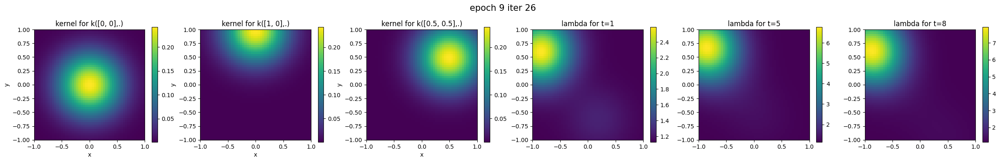

[2026-06-06T04:59:49.323398+00:00] Epoch : 9,	Total loss : 3.95432e+02
[2026-06-06T04:59:49.920713+00:00] Epoch : 10,	iter : 0,	loss : 7.70362e+00
[2026-06-06T04:59:52.882353+00:00] Epoch : 10,	iter : 5,	loss : 8.55493e+00
[2026-06-06T04:59:55.980880+00:00] Epoch : 10,	iter : 10,	loss : 7.81601e+00
[2026-06-06T04:59:58.947557+00:00] Epoch : 10,	iter : 15,	loss : 7.82392e+00
[2026-06-06T05:00:01.862904+00:00] Epoch : 10,	iter : 20,	loss : 7.79984e+00
[2026-06-06T05:00:04.789706+00:00] Epoch : 10,	iter : 25,	loss : 5.38617e+00


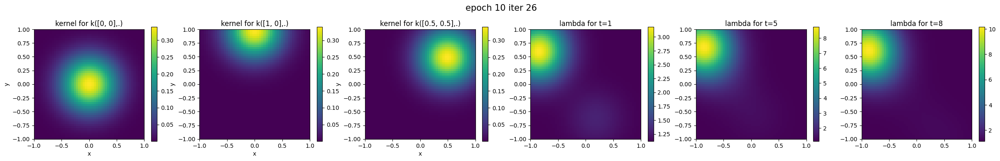

[2026-06-06T05:00:06.185284+00:00] Epoch : 10,	Total loss : 3.04287e+02
[2026-06-06T05:00:06.757678+00:00] Epoch : 11,	iter : 0,	loss : 3.39999e+00
[2026-06-06T05:00:09.799339+00:00] Epoch : 11,	iter : 5,	loss : 7.41741e+00
[2026-06-06T05:00:12.812550+00:00] Epoch : 11,	iter : 10,	loss : 5.21467e+00
[2026-06-06T05:00:15.850448+00:00] Epoch : 11,	iter : 15,	loss : 8.69924e+00
[2026-06-06T05:00:18.792538+00:00] Epoch : 11,	iter : 20,	loss : 8.58009e+00
[2026-06-06T05:00:21.821601+00:00] Epoch : 11,	iter : 25,	loss : 6.58612e+00


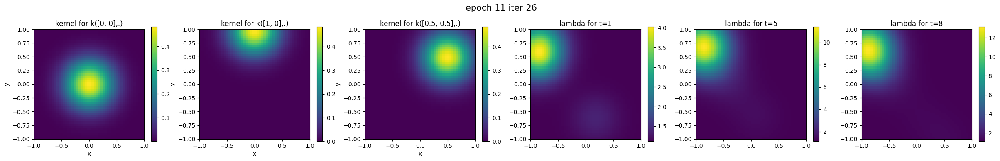

[2026-06-06T05:00:23.079401+00:00] Epoch : 11,	Total loss : 2.28108e+02
[2026-06-06T05:00:23.831420+00:00] Epoch : 12,	iter : 0,	loss : 8.23271e+00
[2026-06-06T05:00:26.819951+00:00] Epoch : 12,	iter : 5,	loss : 8.23300e+00
[2026-06-06T05:00:29.667589+00:00] Epoch : 12,	iter : 10,	loss : 8.28312e+00
[2026-06-06T05:00:32.673821+00:00] Epoch : 12,	iter : 15,	loss : 8.74749e+00
[2026-06-06T05:00:35.949262+00:00] Epoch : 12,	iter : 20,	loss : 3.22794e+00
[2026-06-06T05:00:38.895349+00:00] Epoch : 12,	iter : 25,	loss : 9.12586e+00


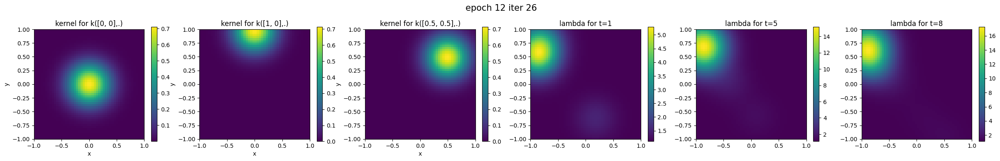

[2026-06-06T05:00:40.156043+00:00] Epoch : 12,	Total loss : 1.33833e+02
[2026-06-06T05:00:40.763850+00:00] Epoch : 13,	iter : 0,	loss : -6.12099e+01
[2026-06-06T05:00:44.023847+00:00] Epoch : 13,	iter : 5,	loss : -3.38731e+00
[2026-06-06T05:00:47.144232+00:00] Epoch : 13,	iter : 10,	loss : 7.18428e+00
[2026-06-06T05:00:50.193271+00:00] Epoch : 13,	iter : 15,	loss : 7.98211e+00
[2026-06-06T05:00:53.215981+00:00] Epoch : 13,	iter : 20,	loss : 5.98948e+00
[2026-06-06T05:00:56.471539+00:00] Epoch : 13,	iter : 25,	loss : 7.82301e+00


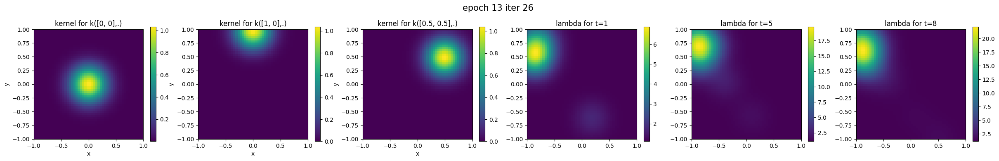

[2026-06-06T05:00:57.766226+00:00] Epoch : 13,	Total loss : 4.21266e+01
[2026-06-06T05:00:58.390245+00:00] Epoch : 14,	iter : 0,	loss : 6.73476e+00
[2026-06-06T05:01:01.593090+00:00] Epoch : 14,	iter : 5,	loss : 5.87220e+00
[2026-06-06T05:01:04.579723+00:00] Epoch : 14,	iter : 10,	loss : 8.41942e+00
[2026-06-06T05:01:07.569428+00:00] Epoch : 14,	iter : 15,	loss : 4.83272e+00
[2026-06-06T05:01:10.685895+00:00] Epoch : 14,	iter : 20,	loss : 4.68665e+00
[2026-06-06T05:01:13.837880+00:00] Epoch : 14,	iter : 25,	loss : -8.94101e-01


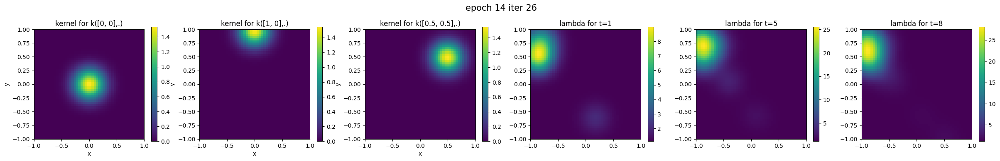

[2026-06-06T05:01:15.080402+00:00] Epoch : 14,	Total loss : -7.70657e+01
[2026-06-06T05:01:15.691978+00:00] Epoch : 15,	iter : 0,	loss : 7.89082e+00
[2026-06-06T05:01:18.629959+00:00] Epoch : 15,	iter : 5,	loss : 6.89296e+00
[2026-06-06T05:01:21.865791+00:00] Epoch : 15,	iter : 10,	loss : 6.75966e+00
[2026-06-06T05:01:24.823491+00:00] Epoch : 15,	iter : 15,	loss : -7.44880e+01
[2026-06-06T05:01:27.751353+00:00] Epoch : 15,	iter : 20,	loss : 6.42721e+00
[2026-06-06T05:01:30.707204+00:00] Epoch : 15,	iter : 25,	loss : 6.73873e+00


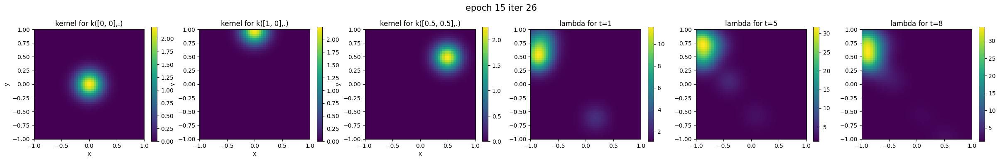

[2026-06-06T05:01:32.226178+00:00] Epoch : 15,	Total loss : -1.79664e+02
[2026-06-06T05:01:32.803150+00:00] Epoch : 16,	iter : 0,	loss : 7.81454e+00
[2026-06-06T05:01:35.834799+00:00] Epoch : 16,	iter : 5,	loss : -7.34378e+01
[2026-06-06T05:01:38.774438+00:00] Epoch : 16,	iter : 10,	loss : 2.32257e+00
[2026-06-06T05:01:42.030236+00:00] Epoch : 16,	iter : 15,	loss : -4.83576e+01
[2026-06-06T05:01:45.089164+00:00] Epoch : 16,	iter : 20,	loss : 8.07788e+00
[2026-06-06T05:01:48.025388+00:00] Epoch : 16,	iter : 25,	loss : 2.15631e+00


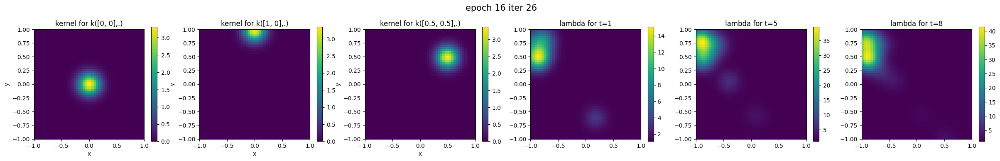

[2026-06-06T05:01:49.476703+00:00] Epoch : 16,	Total loss : -2.87769e+02
[2026-06-06T05:01:50.084851+00:00] Epoch : 17,	iter : 0,	loss : -6.05898e+00
[2026-06-06T05:01:53.020478+00:00] Epoch : 17,	iter : 5,	loss : 5.05391e+00
[2026-06-06T05:01:56.072450+00:00] Epoch : 17,	iter : 10,	loss : -1.59614e+01
[2026-06-06T05:01:59.050881+00:00] Epoch : 17,	iter : 15,	loss : 6.97951e+00
[2026-06-06T05:02:02.235748+00:00] Epoch : 17,	iter : 20,	loss : 5.92799e+00
[2026-06-06T05:02:05.238427+00:00] Epoch : 17,	iter : 25,	loss : 8.61151e+00


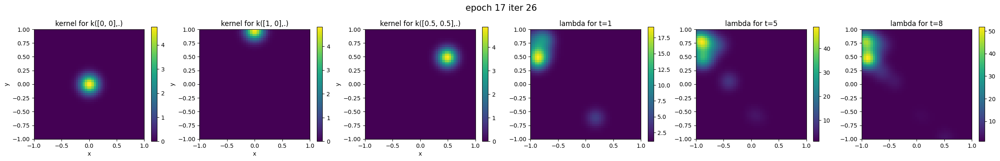

[2026-06-06T05:02:06.542618+00:00] Epoch : 17,	Total loss : -3.79917e+02
[2026-06-06T05:02:07.123413+00:00] Epoch : 18,	iter : 0,	loss : 6.66061e+00
[2026-06-06T05:02:10.217321+00:00] Epoch : 18,	iter : 5,	loss : 5.15481e+00
[2026-06-06T05:02:13.115211+00:00] Epoch : 18,	iter : 10,	loss : 5.81407e+00
[2026-06-06T05:02:15.982368+00:00] Epoch : 18,	iter : 15,	loss : 2.30889e+00
[2026-06-06T05:02:18.992330+00:00] Epoch : 18,	iter : 20,	loss : 5.78403e+00
[2026-06-06T05:02:22.139818+00:00] Epoch : 18,	iter : 25,	loss : 3.46712e+00


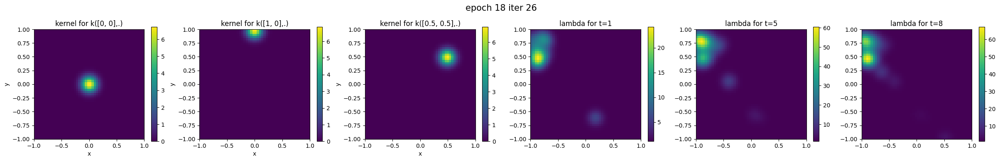

[2026-06-06T05:02:23.359867+00:00] Epoch : 18,	Total loss : -5.27370e+02
[2026-06-06T05:02:23.927061+00:00] Epoch : 19,	iter : 0,	loss : 7.11376e+00
[2026-06-06T05:02:27.098160+00:00] Epoch : 19,	iter : 5,	loss : 5.46316e+00
[2026-06-06T05:02:30.167097+00:00] Epoch : 19,	iter : 10,	loss : 4.58019e+00
[2026-06-06T05:02:33.161392+00:00] Epoch : 19,	iter : 15,	loss : -5.72684e+01
[2026-06-06T05:02:36.285594+00:00] Epoch : 19,	iter : 20,	loss : 7.65337e+00
[2026-06-06T05:02:39.245609+00:00] Epoch : 19,	iter : 25,	loss : -2.86327e+01


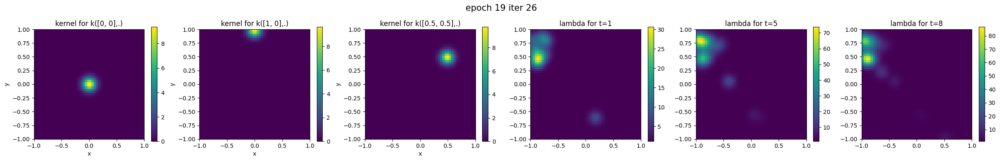

[2026-06-06T05:02:40.603716+00:00] Epoch : 19,	Total loss : -6.65165e+02
[2026-06-06T05:02:41.201580+00:00] Epoch : 20,	iter : 0,	loss : 1.70986e+00
[2026-06-06T05:02:44.217882+00:00] Epoch : 20,	iter : 5,	loss : -4.24970e+00
[2026-06-06T05:02:47.506544+00:00] Epoch : 20,	iter : 10,	loss : -6.01419e-02
[2026-06-06T05:02:50.579381+00:00] Epoch : 20,	iter : 15,	loss : 5.68290e+00
[2026-06-06T05:02:53.754753+00:00] Epoch : 20,	iter : 20,	loss : 6.16217e+00
[2026-06-06T05:02:56.946323+00:00] Epoch : 20,	iter : 25,	loss : -2.41513e+01


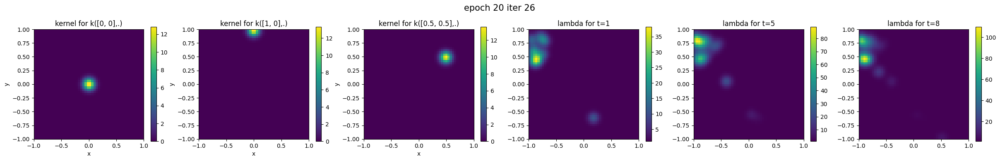

[2026-06-06T05:02:58.207915+00:00] Epoch : 20,	Total loss : -6.40191e+02
[2026-06-06T05:02:58.819699+00:00] Epoch : 21,	iter : 0,	loss : -2.85825e+00
[2026-06-06T05:03:01.894314+00:00] Epoch : 21,	iter : 5,	loss : -3.34483e+00
[2026-06-06T05:03:05.257444+00:00] Epoch : 21,	iter : 10,	loss : 5.67842e+00
[2026-06-06T05:03:08.326528+00:00] Epoch : 21,	iter : 15,	loss : 1.20445e+00
[2026-06-06T05:03:11.391925+00:00] Epoch : 21,	iter : 20,	loss : -7.02967e+01
[2026-06-06T05:03:14.522571+00:00] Epoch : 21,	iter : 25,	loss : -9.98115e+01


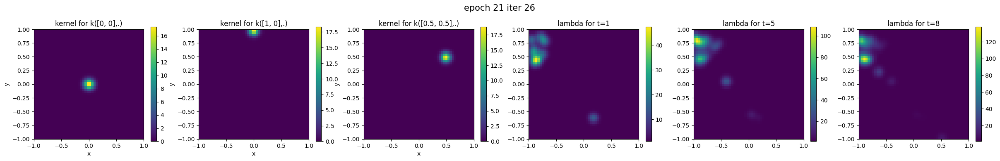

[2026-06-06T05:03:16.060989+00:00] Epoch : 21,	Total loss : -7.38020e+02
[2026-06-06T05:03:16.675621+00:00] Epoch : 22,	iter : 0,	loss : 5.74961e+00
[2026-06-06T05:03:19.792419+00:00] Epoch : 22,	iter : 5,	loss : 5.79457e+00
[2026-06-06T05:03:22.919765+00:00] Epoch : 22,	iter : 10,	loss : 5.68604e+00
[2026-06-06T05:03:26.078063+00:00] Epoch : 22,	iter : 15,	loss : -1.72175e+00
[2026-06-06T05:03:29.418670+00:00] Epoch : 22,	iter : 20,	loss : 5.21403e+00
[2026-06-06T05:03:32.552528+00:00] Epoch : 22,	iter : 25,	loss : -1.64761e+01


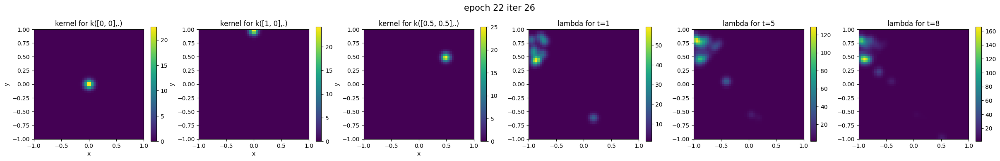

[2026-06-06T05:03:33.844483+00:00] Epoch : 22,	Total loss : -8.01657e+02
[2026-06-06T05:03:34.645206+00:00] Epoch : 23,	iter : 0,	loss : -6.09297e+00
[2026-06-06T05:03:37.763943+00:00] Epoch : 23,	iter : 5,	loss : 3.42165e+00
[2026-06-06T05:03:40.913431+00:00] Epoch : 23,	iter : 10,	loss : 2.70288e-01
[2026-06-06T05:03:43.978778+00:00] Epoch : 23,	iter : 15,	loss : 5.11552e+00
[2026-06-06T05:03:47.201498+00:00] Epoch : 23,	iter : 20,	loss : 4.45985e+00
[2026-06-06T05:03:50.433123+00:00] Epoch : 23,	iter : 25,	loss : -6.00133e+01


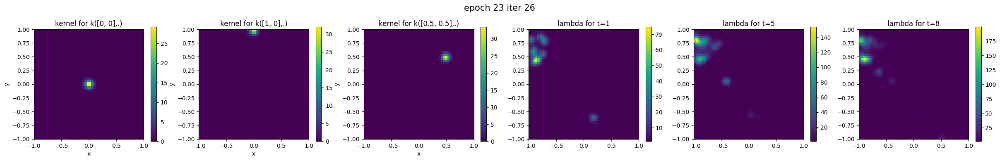

[2026-06-06T05:03:51.728002+00:00] Epoch : 23,	Total loss : -8.79123e+02
[2026-06-06T05:03:52.353643+00:00] Epoch : 24,	iter : 0,	loss : 3.16050e+00
[2026-06-06T05:03:55.712894+00:00] Epoch : 24,	iter : 5,	loss : 7.65338e+00
[2026-06-06T05:03:58.757774+00:00] Epoch : 24,	iter : 10,	loss : -1.23838e+01
[2026-06-06T05:04:02.025798+00:00] Epoch : 24,	iter : 15,	loss : 7.20999e+00
[2026-06-06T05:04:05.221179+00:00] Epoch : 24,	iter : 20,	loss : -2.25515e+00
[2026-06-06T05:04:08.390061+00:00] Epoch : 24,	iter : 25,	loss : -9.15715e+01


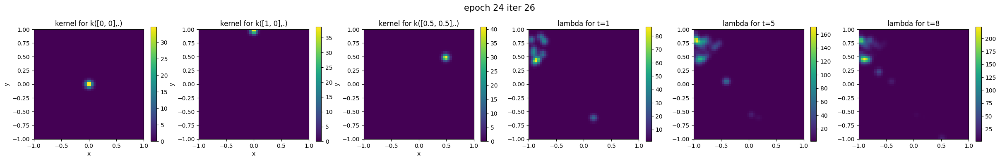

[2026-06-06T05:04:09.734675+00:00] Epoch : 24,	Total loss : -9.03680e+02
[2026-06-06T05:04:10.352112+00:00] Epoch : 25,	iter : 0,	loss : -4.87147e+00
[2026-06-06T05:04:13.785281+00:00] Epoch : 25,	iter : 5,	loss : 4.92116e+00
[2026-06-06T05:04:16.918988+00:00] Epoch : 25,	iter : 10,	loss : -1.39494e+01
[2026-06-06T05:04:19.990970+00:00] Epoch : 25,	iter : 15,	loss : 4.94836e+00
[2026-06-06T05:04:23.165266+00:00] Epoch : 25,	iter : 20,	loss : -2.08614e+01
[2026-06-06T05:04:26.667025+00:00] Epoch : 25,	iter : 25,	loss : 6.85969e+00


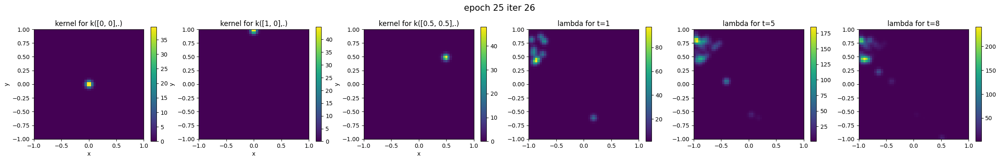

[2026-06-06T05:04:27.965176+00:00] Epoch : 25,	Total loss : -9.42582e+02
[2026-06-06T05:04:28.596918+00:00] Epoch : 26,	iter : 0,	loss : 4.21353e+00
[2026-06-06T05:04:31.782720+00:00] Epoch : 26,	iter : 5,	loss : 8.12582e+00
[2026-06-06T05:04:35.052378+00:00] Epoch : 26,	iter : 10,	loss : 1.56800e+00
[2026-06-06T05:04:38.245447+00:00] Epoch : 26,	iter : 15,	loss : 5.11818e+00
[2026-06-06T05:04:41.333013+00:00] Epoch : 26,	iter : 20,	loss : -1.10336e+02
[2026-06-06T05:04:44.408756+00:00] Epoch : 26,	iter : 25,	loss : 5.72717e+00


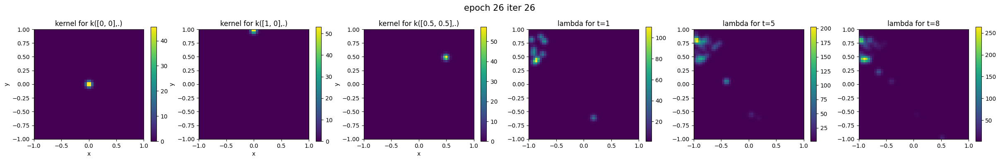

[2026-06-06T05:04:45.861407+00:00] Epoch : 26,	Total loss : -9.43450e+02
[2026-06-06T05:04:46.513228+00:00] Epoch : 27,	iter : 0,	loss : 4.71367e+00
[2026-06-06T05:04:49.761241+00:00] Epoch : 27,	iter : 5,	loss : 5.83337e+00
[2026-06-06T05:04:52.889896+00:00] Epoch : 27,	iter : 10,	loss : 4.51957e+00
[2026-06-06T05:04:56.204646+00:00] Epoch : 27,	iter : 15,	loss : 4.90916e+00
[2026-06-06T05:04:59.351942+00:00] Epoch : 27,	iter : 20,	loss : 2.07604e+00
[2026-06-06T05:05:02.508659+00:00] Epoch : 27,	iter : 25,	loss : 6.66708e+00


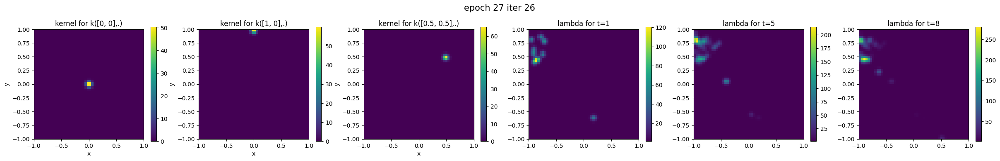

[2026-06-06T05:05:03.997993+00:00] Epoch : 27,	Total loss : -9.85285e+02
[2026-06-06T05:05:04.614044+00:00] Epoch : 28,	iter : 0,	loss : 7.81709e+00
[2026-06-06T05:05:07.679179+00:00] Epoch : 28,	iter : 5,	loss : 5.38928e+00
[2026-06-06T05:05:10.950519+00:00] Epoch : 28,	iter : 10,	loss : 4.20169e+00
[2026-06-06T05:05:14.281163+00:00] Epoch : 28,	iter : 15,	loss : 7.88019e+00
[2026-06-06T05:05:17.428586+00:00] Epoch : 28,	iter : 20,	loss : 2.73506e+00
[2026-06-06T05:05:20.586704+00:00] Epoch : 28,	iter : 25,	loss : 4.15043e+00


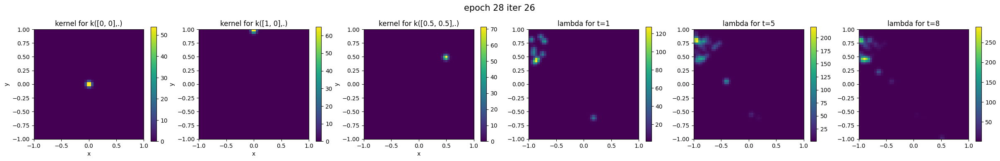

[2026-06-06T05:05:21.918966+00:00] Epoch : 28,	Total loss : -1.01218e+03
[2026-06-06T05:05:22.595320+00:00] Epoch : 29,	iter : 0,	loss : 4.83447e+00
[2026-06-06T05:05:25.950710+00:00] Epoch : 29,	iter : 5,	loss : -6.96741e+01
[2026-06-06T05:05:29.067915+00:00] Epoch : 29,	iter : 10,	loss : 4.44884e+00
[2026-06-06T05:05:32.195643+00:00] Epoch : 29,	iter : 15,	loss : 5.00722e+00
[2026-06-06T05:05:35.578535+00:00] Epoch : 29,	iter : 20,	loss : 1.89563e-01
[2026-06-06T05:05:38.673871+00:00] Epoch : 29,	iter : 25,	loss : -1.90774e+01


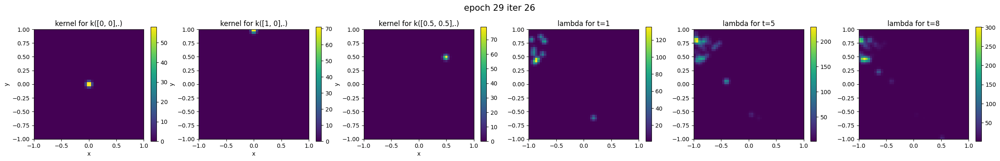

[2026-06-06T05:05:39.916895+00:00] Epoch : 29,	Total loss : -9.89758e+02
[2026-06-06T05:05:40.568775+00:00] Epoch : 30,	iter : 0,	loss : -4.03837e-01
[2026-06-06T05:05:44.024185+00:00] Epoch : 30,	iter : 5,	loss : 5.24544e+00
[2026-06-06T05:05:47.146131+00:00] Epoch : 30,	iter : 10,	loss : 4.86638e+00
[2026-06-06T05:05:50.330576+00:00] Epoch : 30,	iter : 15,	loss : 8.06003e+00
[2026-06-06T05:05:53.516637+00:00] Epoch : 30,	iter : 20,	loss : -2.95066e+01
[2026-06-06T05:05:57.059824+00:00] Epoch : 30,	iter : 25,	loss : 2.18974e+00


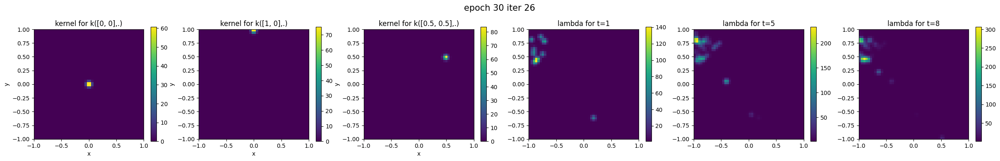

[2026-06-06T05:05:58.377407+00:00] Epoch : 30,	Total loss : -9.81499e+02
[2026-06-06T05:05:59.019883+00:00] Epoch : 31,	iter : 0,	loss : -1.84754e+01
[2026-06-06T05:06:02.108206+00:00] Epoch : 31,	iter : 5,	loss : 5.23060e+00
[2026-06-06T05:06:05.462012+00:00] Epoch : 31,	iter : 10,	loss : 6.14242e+00
[2026-06-06T05:06:08.741463+00:00] Epoch : 31,	iter : 15,	loss : 5.16399e+00
[2026-06-06T05:06:11.885455+00:00] Epoch : 31,	iter : 20,	loss : 6.00388e+00
[2026-06-06T05:06:15.168002+00:00] Epoch : 31,	iter : 25,	loss : -1.16990e+02


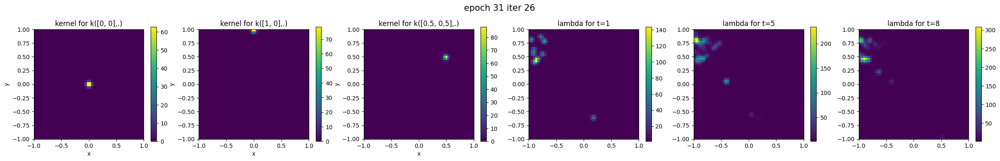

[2026-06-06T05:06:16.478238+00:00] Epoch : 31,	Total loss : -9.86410e+02
[2026-06-06T05:06:17.093515+00:00] Epoch : 32,	iter : 0,	loss : 7.69237e+00
[2026-06-06T05:06:20.364110+00:00] Epoch : 32,	iter : 5,	loss : -6.35134e+00
[2026-06-06T05:06:23.708788+00:00] Epoch : 32,	iter : 10,	loss : 9.49533e+00
[2026-06-06T05:06:26.876987+00:00] Epoch : 32,	iter : 15,	loss : 2.44426e+00
[2026-06-06T05:06:30.043035+00:00] Epoch : 32,	iter : 20,	loss : 6.29485e+00
[2026-06-06T05:06:33.380934+00:00] Epoch : 32,	iter : 25,	loss : -1.13532e+02


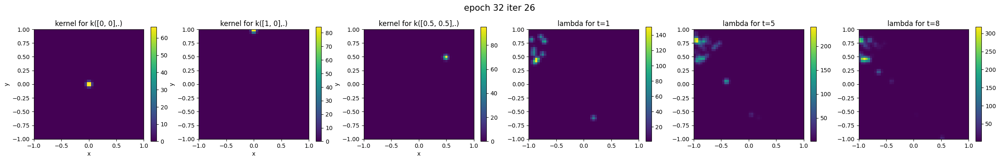

[2026-06-06T05:06:34.811461+00:00] Epoch : 32,	Total loss : -1.00043e+03
[2026-06-06T05:06:35.451122+00:00] Epoch : 33,	iter : 0,	loss : 3.38573e+00
[2026-06-06T05:06:38.555667+00:00] Epoch : 33,	iter : 5,	loss : 4.00174e+00
[2026-06-06T05:06:41.744380+00:00] Epoch : 33,	iter : 10,	loss : -3.70390e+00
[2026-06-06T05:06:45.236781+00:00] Epoch : 33,	iter : 15,	loss : 6.14186e-01
[2026-06-06T05:06:48.432821+00:00] Epoch : 33,	iter : 20,	loss : -4.45714e+00
[2026-06-06T05:06:51.586652+00:00] Epoch : 33,	iter : 25,	loss : -2.88221e+01


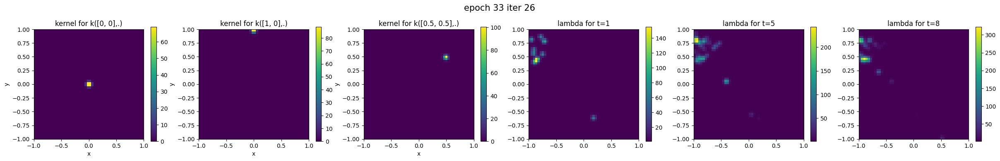

[2026-06-06T05:06:53.046879+00:00] Epoch : 33,	Total loss : -1.01011e+03
[2026-06-06T05:06:53.713779+00:00] Epoch : 34,	iter : 0,	loss : -1.00935e+00
[2026-06-06T05:06:56.951101+00:00] Epoch : 34,	iter : 5,	loss : -1.11548e+00
[2026-06-06T05:07:00.028914+00:00] Epoch : 34,	iter : 10,	loss : 6.08386e+00
[2026-06-06T05:07:03.178035+00:00] Epoch : 34,	iter : 15,	loss : 5.42267e+00
[2026-06-06T05:07:06.725468+00:00] Epoch : 34,	iter : 20,	loss : -1.84227e+00
[2026-06-06T05:07:09.837562+00:00] Epoch : 34,	iter : 25,	loss : 2.94469e+00


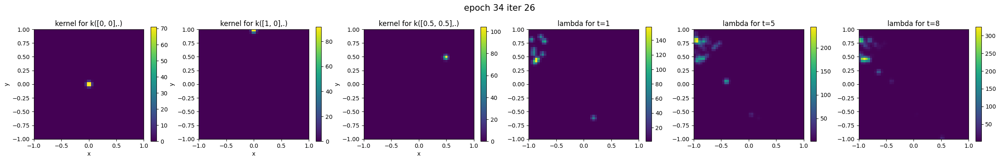

[2026-06-06T05:07:11.162024+00:00] Epoch : 34,	Total loss : -1.00267e+03
[2026-06-06T05:07:11.794740+00:00] Epoch : 35,	iter : 0,	loss : -1.29173e+02
[2026-06-06T05:07:15.115087+00:00] Epoch : 35,	iter : 5,	loss : 3.46262e+00
[2026-06-06T05:07:18.442801+00:00] Epoch : 35,	iter : 10,	loss : 2.72899e+00
[2026-06-06T05:07:21.520064+00:00] Epoch : 35,	iter : 15,	loss : -2.18019e+00
[2026-06-06T05:07:24.783519+00:00] Epoch : 35,	iter : 20,	loss : 8.05877e+00
[2026-06-06T05:07:27.858043+00:00] Epoch : 35,	iter : 25,	loss : -3.47104e+01


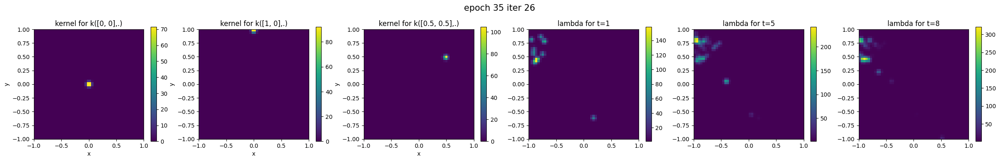

[2026-06-06T05:07:29.178609+00:00] Epoch : 35,	Total loss : -1.00053e+03
[2026-06-06T05:07:29.874473+00:00] Epoch : 36,	iter : 0,	loss : -2.67210e+01
[2026-06-06T05:07:33.014044+00:00] Epoch : 36,	iter : 5,	loss : 6.27068e-01
[2026-06-06T05:07:36.367621+00:00] Epoch : 36,	iter : 10,	loss : 4.70395e+00
[2026-06-06T05:07:39.508892+00:00] Epoch : 36,	iter : 15,	loss : 4.37389e+00
[2026-06-06T05:07:42.832595+00:00] Epoch : 36,	iter : 20,	loss : 4.22931e+00
[2026-06-06T05:07:46.008335+00:00] Epoch : 36,	iter : 25,	loss : 1.42853e+00


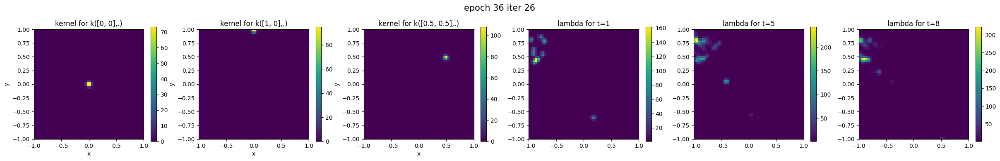

[2026-06-06T05:07:47.266381+00:00] Epoch : 36,	Total loss : -9.99199e+02
[2026-06-06T05:07:47.881314+00:00] Epoch : 37,	iter : 0,	loss : 3.72277e+00
[2026-06-06T05:07:51.018755+00:00] Epoch : 37,	iter : 5,	loss : -4.94533e+00
[2026-06-06T05:07:54.494476+00:00] Epoch : 37,	iter : 10,	loss : 8.53384e+00
[2026-06-06T05:07:57.561602+00:00] Epoch : 37,	iter : 15,	loss : -2.06385e+01
[2026-06-06T05:08:00.701212+00:00] Epoch : 37,	iter : 20,	loss : 4.08363e+00
[2026-06-06T05:08:03.899099+00:00] Epoch : 37,	iter : 25,	loss : -6.23634e-01


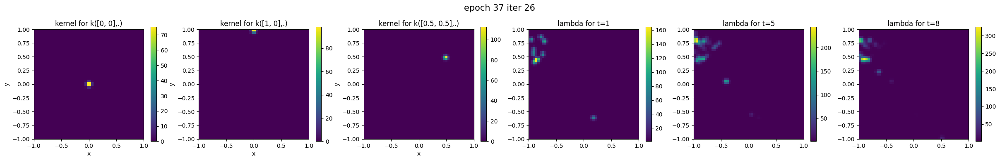

[2026-06-06T05:08:05.435202+00:00] Epoch : 37,	Total loss : -1.02577e+03
[2026-06-06T05:08:06.063845+00:00] Epoch : 38,	iter : 0,	loss : 4.66604e+00
[2026-06-06T05:08:09.179626+00:00] Epoch : 38,	iter : 5,	loss : 2.85595e+00
[2026-06-06T05:08:12.283304+00:00] Epoch : 38,	iter : 10,	loss : -6.68070e-01
[2026-06-06T05:08:15.735277+00:00] Epoch : 38,	iter : 15,	loss : 6.51025e+00
[2026-06-06T05:08:18.939017+00:00] Epoch : 38,	iter : 20,	loss : 1.18283e-01
[2026-06-06T05:08:22.080131+00:00] Epoch : 38,	iter : 25,	loss : 4.84840e+00


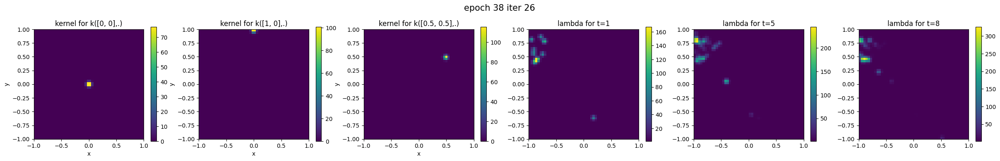

[2026-06-06T05:08:23.504278+00:00] Epoch : 38,	Total loss : -1.02052e+03
[2026-06-06T05:08:24.143994+00:00] Epoch : 39,	iter : 0,	loss : 5.65446e+00
[2026-06-06T05:08:27.382460+00:00] Epoch : 39,	iter : 5,	loss : -1.24831e+00
[2026-06-06T05:08:30.582333+00:00] Epoch : 39,	iter : 10,	loss : -1.14944e+02
[2026-06-06T05:08:33.704301+00:00] Epoch : 39,	iter : 15,	loss : 4.87362e-01
[2026-06-06T05:08:37.065002+00:00] Epoch : 39,	iter : 20,	loss : 1.18374e+00
[2026-06-06T05:08:40.350172+00:00] Epoch : 39,	iter : 25,	loss : 4.74500e+00


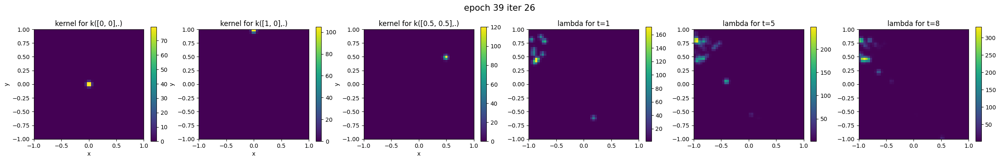

[2026-06-06T05:08:41.689163+00:00] Epoch : 39,	Total loss : -1.05744e+03
[2026-06-06T05:08:42.307215+00:00] Epoch : 40,	iter : 0,	loss : -1.18705e+02
[2026-06-06T05:08:45.568471+00:00] Epoch : 40,	iter : 5,	loss : 2.16477e+00
[2026-06-06T05:08:48.672100+00:00] Epoch : 40,	iter : 10,	loss : 5.25620e+00
[2026-06-06T05:08:51.899224+00:00] Epoch : 40,	iter : 15,	loss : 8.75523e+00
[2026-06-06T05:08:55.022819+00:00] Epoch : 40,	iter : 20,	loss : 1.49650e+00
[2026-06-06T05:08:58.295632+00:00] Epoch : 40,	iter : 25,	loss : 6.52536e+00


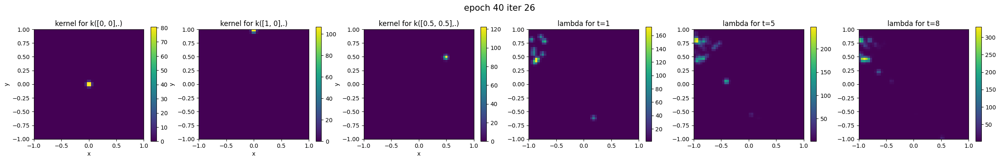

[2026-06-06T05:08:59.562341+00:00] Epoch : 40,	Total loss : -1.03177e+03
[2026-06-06T05:09:00.166251+00:00] Epoch : 41,	iter : 0,	loss : 5.25032e+00
[2026-06-06T05:09:03.422931+00:00] Epoch : 41,	iter : 5,	loss : 2.58982e+00
[2026-06-06T05:09:06.794934+00:00] Epoch : 41,	iter : 10,	loss : -2.83900e+01
[2026-06-06T05:09:09.974814+00:00] Epoch : 41,	iter : 15,	loss : 6.18944e+00
[2026-06-06T05:09:13.214126+00:00] Epoch : 41,	iter : 20,	loss : -1.18502e+02
[2026-06-06T05:09:16.474791+00:00] Epoch : 41,	iter : 25,	loss : -5.99774e+00


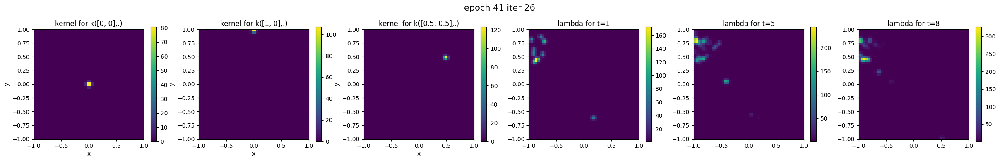

[2026-06-06T05:09:17.947029+00:00] Epoch : 41,	Total loss : -1.01704e+03
[2026-06-06T05:09:18.588508+00:00] Epoch : 42,	iter : 0,	loss : -1.95992e+00
[2026-06-06T05:09:21.665571+00:00] Epoch : 42,	iter : 5,	loss : 6.52966e+00
[2026-06-06T05:09:24.845018+00:00] Epoch : 42,	iter : 10,	loss : -7.73471e+00
[2026-06-06T05:09:28.275652+00:00] Epoch : 42,	iter : 15,	loss : 3.65220e+00
[2026-06-06T05:09:31.407120+00:00] Epoch : 42,	iter : 20,	loss : -3.32243e+00
[2026-06-06T05:09:34.464003+00:00] Epoch : 42,	iter : 25,	loss : -2.36513e+01


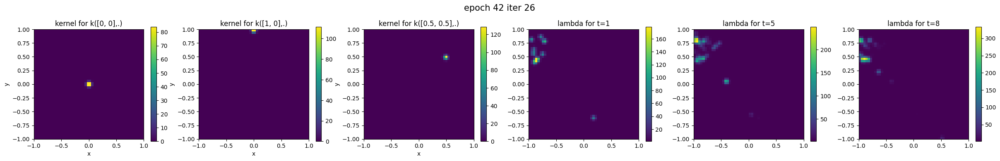

[2026-06-06T05:09:35.922264+00:00] Epoch : 42,	Total loss : -1.02238e+03
[2026-06-06T05:09:36.616402+00:00] Epoch : 43,	iter : 0,	loss : 6.04739e+00
[2026-06-06T05:09:39.811752+00:00] Epoch : 43,	iter : 5,	loss : 2.53520e+00
[2026-06-06T05:09:42.924279+00:00] Epoch : 43,	iter : 10,	loss : 2.65473e+00
[2026-06-06T05:09:46.032319+00:00] Epoch : 43,	iter : 15,	loss : 3.12095e+00
[2026-06-06T05:09:49.456546+00:00] Epoch : 43,	iter : 20,	loss : 2.03710e+00
[2026-06-06T05:09:52.581458+00:00] Epoch : 43,	iter : 25,	loss : -4.83162e-01


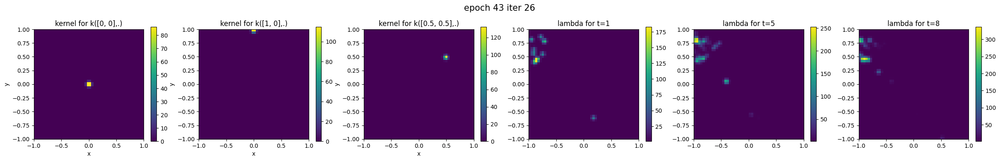

[2026-06-06T05:09:53.856623+00:00] Epoch : 43,	Total loss : -1.04622e+03
[2026-06-06T05:09:54.458208+00:00] Epoch : 44,	iter : 0,	loss : -6.12081e-01
[2026-06-06T05:09:57.812688+00:00] Epoch : 44,	iter : 5,	loss : 1.77856e+00
[2026-06-06T05:10:01.148552+00:00] Epoch : 44,	iter : 10,	loss : 3.55228e+00
[2026-06-06T05:10:04.270654+00:00] Epoch : 44,	iter : 15,	loss : -4.32295e+01
[2026-06-06T05:10:07.386764+00:00] Epoch : 44,	iter : 20,	loss : 4.04517e+00
[2026-06-06T05:10:10.663949+00:00] Epoch : 44,	iter : 25,	loss : 7.34786e+00


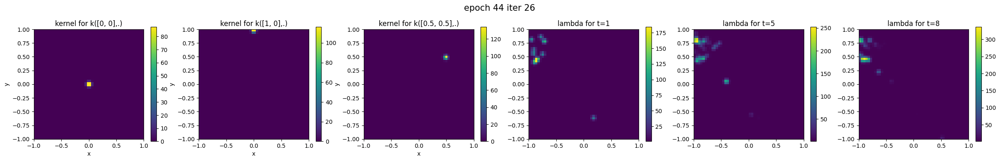

[2026-06-06T05:10:12.076361+00:00] Epoch : 44,	Total loss : -1.01354e+03
[2026-06-06T05:10:12.734681+00:00] Epoch : 45,	iter : 0,	loss : -3.70469e-01
[2026-06-06T05:10:15.981258+00:00] Epoch : 45,	iter : 5,	loss : 7.28419e+00
[2026-06-06T05:10:19.073200+00:00] Epoch : 45,	iter : 10,	loss : 8.01931e+00
[2026-06-06T05:10:22.208983+00:00] Epoch : 45,	iter : 15,	loss : -3.00949e+01
[2026-06-06T05:10:25.500490+00:00] Epoch : 45,	iter : 20,	loss : 1.73587e+00
[2026-06-06T05:10:28.773483+00:00] Epoch : 45,	iter : 25,	loss : -4.85154e+00


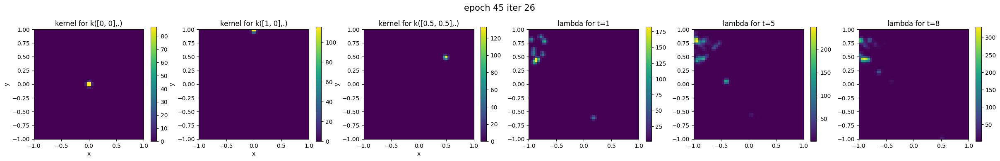

[2026-06-06T05:10:30.080837+00:00] Epoch : 45,	Total loss : -1.02782e+03
[2026-06-06T05:10:30.679330+00:00] Epoch : 46,	iter : 0,	loss : 3.17126e+00
[2026-06-06T05:10:33.835598+00:00] Epoch : 46,	iter : 5,	loss : -4.33727e+00
[2026-06-06T05:10:37.272943+00:00] Epoch : 46,	iter : 10,	loss : 2.45586e+00
[2026-06-06T05:10:40.384944+00:00] Epoch : 46,	iter : 15,	loss : 7.76570e+00
[2026-06-06T05:10:43.487935+00:00] Epoch : 46,	iter : 20,	loss : 4.20490e+00
[2026-06-06T05:10:46.645051+00:00] Epoch : 46,	iter : 25,	loss : -9.10385e+00


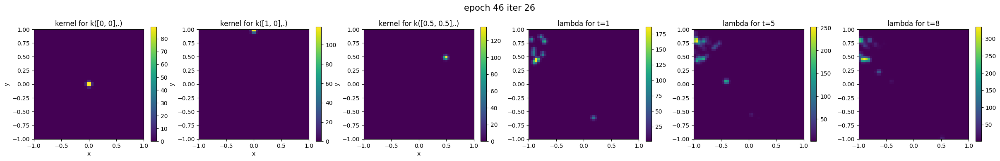

[2026-06-06T05:10:48.177371+00:00] Epoch : 46,	Total loss : -1.02868e+03
[2026-06-06T05:10:48.797504+00:00] Epoch : 47,	iter : 0,	loss : -2.76692e+00
[2026-06-06T05:10:51.970497+00:00] Epoch : 47,	iter : 5,	loss : 7.03648e+00
[2026-06-06T05:10:55.079396+00:00] Epoch : 47,	iter : 10,	loss : -2.56252e-01
[2026-06-06T05:10:58.555158+00:00] Epoch : 47,	iter : 15,	loss : -3.37441e+01
[2026-06-06T05:11:01.699589+00:00] Epoch : 47,	iter : 20,	loss : 4.55272e+00
[2026-06-06T05:11:04.816182+00:00] Epoch : 47,	iter : 25,	loss : -2.95504e+01


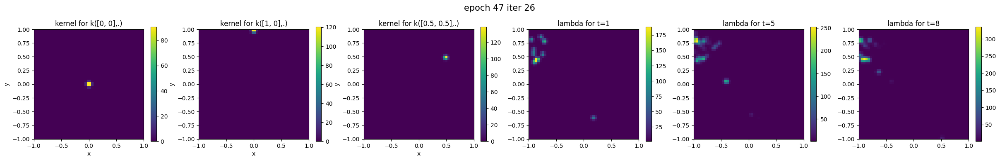

[2026-06-06T05:11:06.313127+00:00] Epoch : 47,	Total loss : -1.37259e+03
[2026-06-06T05:11:06.968437+00:00] Epoch : 48,	iter : 0,	loss : -6.64459e+01
[2026-06-06T05:11:10.219639+00:00] Epoch : 48,	iter : 5,	loss : 4.49988e+00
[2026-06-06T05:11:13.410738+00:00] Epoch : 48,	iter : 10,	loss : -1.46412e+00
[2026-06-06T05:11:16.561342+00:00] Epoch : 48,	iter : 15,	loss : 4.00817e+00
[2026-06-06T05:11:19.910400+00:00] Epoch : 48,	iter : 20,	loss : 6.34787e+00
[2026-06-06T05:11:23.239264+00:00] Epoch : 48,	iter : 25,	loss : -7.80625e-01


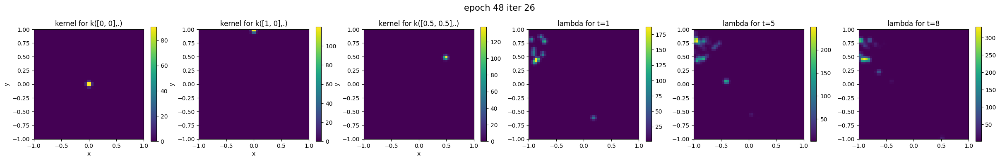

[2026-06-06T05:11:24.542731+00:00] Epoch : 48,	Total loss : -1.02282e+03
[2026-06-06T05:11:25.187401+00:00] Epoch : 49,	iter : 0,	loss : 8.72157e-01
[2026-06-06T05:11:28.570469+00:00] Epoch : 49,	iter : 5,	loss : 6.08648e+00
[2026-06-06T05:11:31.747723+00:00] Epoch : 49,	iter : 10,	loss : 4.94114e+00
[2026-06-06T05:11:35.109983+00:00] Epoch : 49,	iter : 15,	loss : -8.15770e-01
[2026-06-06T05:11:38.301876+00:00] Epoch : 49,	iter : 20,	loss : 4.76424e+00
[2026-06-06T05:11:41.344213+00:00] Epoch : 49,	iter : 25,	loss : -1.17477e+02


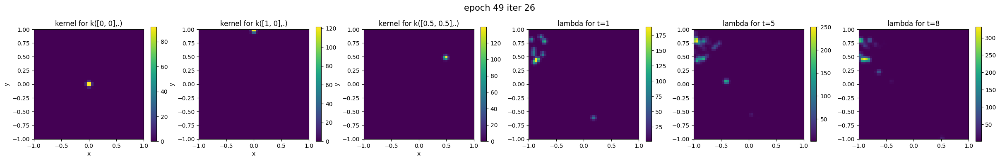

[2026-06-06T05:11:42.620544+00:00] Epoch : 49,	Total loss : -1.03935e+03
=== COMPARISON NSMPP vs ST-Hawkes (no magnitude) ===
ST-Hawkes1: total LL = 8412.108, per event = 1.235077, N = 6811


In [19]:
seed = 5
torch.random.manual_seed(seed)

# Training configurations
batch_size = 8
num_epochs = 50
lr         = 1e-2
modelname  = "hawkes_real-%d" % seed

# Model configurations
T          = (0., 10.)
S          = ((-1, 1), (-1, 1))
data_dim   = 3
int_res    = 10

# Define point process model
hawkes_model = sthawkes_exp_gauss_kernel(
    T=T, S=S,
    alpha=1, beta=1, sigma=1, mu=1,         # initial guess
    data_dim=data_dim, numerical_int=True, int_res=int_res)
# init_model.load_state_dict(torch.load("%s/saved_models/%s.pth" % (rootpath, modelname)))
print("Number of parameters:",
      sum(p.numel() for p in hawkes_model.parameters()))

# visualize the target model
plot_fitted_2D_model(hawkes_model, test_seq,
                     ss=[[0, 0], [1, 0], [0.5, 0.5]],
                     ts=[1, 5, 8],
                     S=S, ngrid=50, filename="Initialized Model")

# Training
train(hawkes_model, train_loader, trg_model=None, S=S, ngrid=50, test_data=test_seq,
      modelname=modelname, num_epochs=num_epochs, lr=lr, print_iter=5)

# Log-likelihood evaluation
def evaluate_loglik_st(model, data):
    model.eval()
    with torch.no_grad():
        _, loglik = model(data)   # [N_seq]
        total_loglik = loglik.sum().item()
        n_events = (data[..., 0] > 0).sum().item()
        ll_per_event = total_loglik / n_events
    return total_loglik, ll_per_event, n_events

total_ll_hk1, ll_per_ev_hk1, n_ev_hk1 = evaluate_loglik_st(hawkes_model, data)

print("=== COMPARISON NSMPP vs ST-Hawkes (no magnitude) ===")
#print(f"DB        : total LL = {total_ll_db:.3f}, per event = {ll_per_ev_db:.6f}, N = {n_ev_db}")
#print(f"STDB      : total LL = {total_ll_stdb:.3f}, per event = {ll_per_ev_stdb:.6f}, N = {n_ev_stdb}")
print(f"ST-Hawkes1: total LL = {total_ll_hk1:.3f}, per event = {ll_per_ev_hk1:.6f}, N = {n_ev_hk1}")

In [ ]:
print(f"ST-Hawkes1: total LL = {total_ll_hk1:.3f}, per event = {ll_per_ev_hk1:.6f}, N = {n_ev_hk1}")

ST-Hawkes1: total LL = 9048.014, per event = 1.328441, N = 6811


In [ ]:
for name, param in hawkes_model.named_parameters():
    print(name, param.detach().cpu().numpy())


#5. Intensity Map
Plots the integrated intensity over time and space approximated by the model.

In [20]:
import numpy as np
import torch
import matplotlib.pyplot as plt

def plot_integrated_intensity_overlay_norm(model, test_seq, T, S, title=""):
    seq = test_seq
    valid = (seq[:, 0] > 0)
    seq_valid = seq[valid]

    with torch.no_grad():
        integ = model.numerical_integral(seq.unsqueeze(0))

    if integ.dim() == 3:
        integ = integ[0]  # [nt, nx*ny]

    nt, nxny = integ.shape
    nside = int(np.sqrt(nxny))
    dt = (T[1] - T[0]) / max(nt - 1, 1)

    # integral over time -> A(x,y)
    Axy = np.trapezoid(
        integ.reshape(nt, nside, nside).detach().cpu().numpy(),
        dx=dt,
        axis=0
    )  # [nside, nside]

    # events in normalized coordinates
    ev = seq_valid.detach().cpu().numpy()
    ev_x, ev_y = ev[:, 1], ev[:, 2]

    extent = [S[0][0], S[0][1], S[1][0], S[1][1]]

    plt.figure(figsize=(7, 6))
    im = plt.imshow(Axy.T, extent=extent, origin="lower", aspect="auto")
    plt.colorbar(im)
    plt.scatter(ev_x, ev_y, s=60, marker="x", linewidths=2,
                color="white", label="Real events")

    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()

In [ ]:
plot_integrated_intensity_overlay_norm(init_model, test_seq, T=(0.,10.), S=((-1,1),(-1,1)))

In [ ]:
plot_integrated_intensity_overlay_norm(init_model2, test_seq, T=(0.,10.), S=((-1,1),(-1,1)))

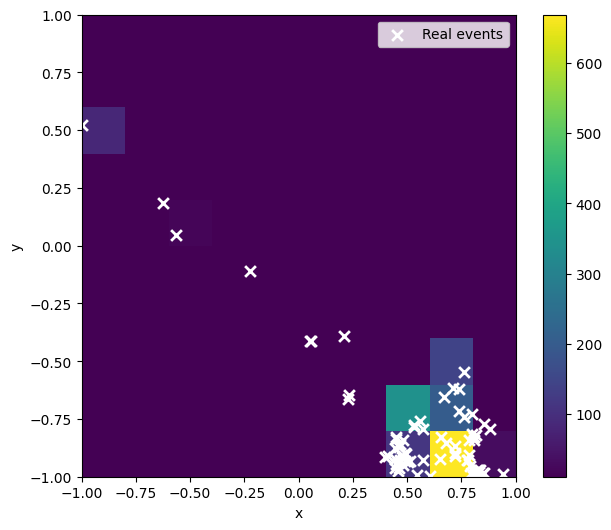

In [21]:
plot_integrated_intensity_overlay_norm(hawkes_model, test_seq, T=(0.,10.), S=((-1,1),(-1,1)))

In [22]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def plot_events_vs_pred_by_sequence(model, data,
                                           title="Number of events per sequence (observed vs predicted)"):
    """
    model : PointProcess
    data  : tensor [N_seq, L, data_dim]

    Output:
    - x-axis : index sequence (1..N_seq)
    - y-axis : total events vs total compensator per sequence
    """

    model.eval()
    N_seq = data.shape[0]

    total_events = []
    total_comp = []

    with torch.no_grad():
        for n in range(N_seq):
            seq = data[n:n+1]                 # [1, L, D]

            #observed
            times = seq[0, :, 0]
            N_n = (times > 0).sum().item()
            total_events.append(N_n)

            #predicted -> integrated lambda
            lam_grid = model.numerical_integral(seq)   # [1, T_res, S_res]

            Lambda_n = lam_grid.sum().item() * model.unit_vol
            total_comp.append(Lambda_n)

    total_events = np.array(total_events)
    total_comp   = np.array(total_comp)
    seq_idx      = np.arange(1, N_seq + 1)

    #Plot
    plt.figure(figsize=(10,5))
    plt.plot(seq_idx, total_comp, '-o',
             label="Predicted", alpha=0.9)
    plt.plot(seq_idx, total_events, '-s',
             label="Observed", alpha=0.9)

    plt.xlabel("Sequence index")
    plt.ylabel("Number of events")
    plt.title(title)
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

    return seq_idx, total_events, total_comp


In [ ]:
seq_idx, N_obs, Lambda = plot_events_vs_pred_by_sequence(
    model=init_model,
    data=data
)


In [ ]:
seq_idx, N_obs, Lambda = plot_events_vs_pred_by_sequence(
    model=init_model2,
    data=data
)


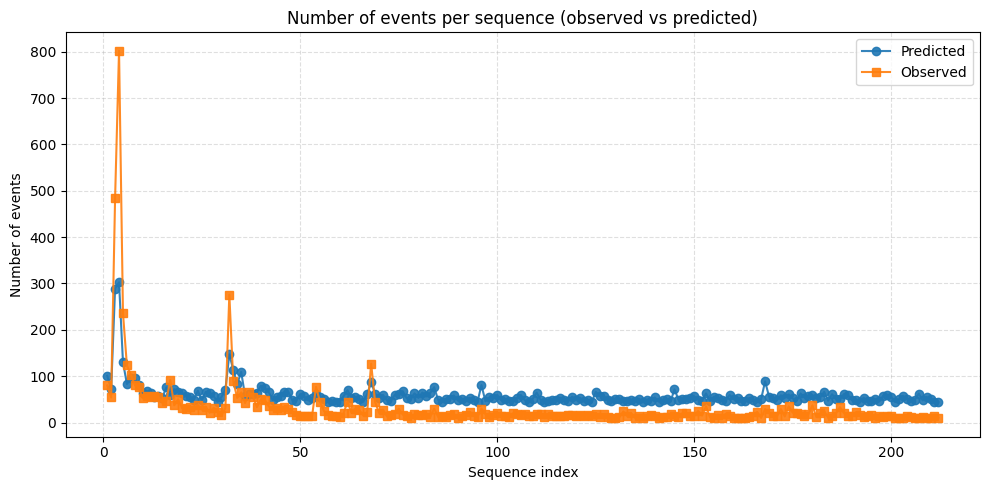

In [23]:
seq_idx, N_obs, Lambda = plot_events_vs_pred_by_sequence(
    model=hawkes_model,
    data=data
)
